In [1]:
# import all libraries and dependencies for dataframe
from numpy import *
from pandas import *
from scipy.stats import *
from matplotlib.pyplot import *
from seaborn import *
#from statsmodels.api import *
from statsmodels.formula.api import *
from pylab import rcParams
#import warnings
#warnings.filterwarnings("ignore")
# Don't need to type show() command further if you do %matplotlib inline
%matplotlib inline
from statsmodels.tsa.api import *
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
#from datetime import datetime, timedelta

In [2]:
#import all libraries and dependencies for data visualization
rcParams['figure.figsize'] = [10,10]
set(style='darkgrid')
rcParams["scatter.edgecolors"]='black'
from matplotlib.ticker import *
#Set Option for Displaying All Columns of a Pandas DataFrame
#Set Option for Displaying All Rows of a Pandas DataFrame
set_option('display.max_columns',None)
set_option('display.max_rows',None)

# Check out the Data

In [3]:
# sep=',' to align the DataFrame properly
# header='infer' which Row should be taken as header, default behaviour is to infer the Column names as header
# header=0 means 0th Row index should be taken as header
# na_values=None or na_values="String" or na_values=["String1","String2"] if you wanna specify any "String" as NaN
# keep_default_na=True by default ‘#N/A’,‘#N/A N/A’,‘#NA’,‘-1.#IND’,‘-1.#QNAN’,‘-NaN’,‘-nan’,‘1.#IND’,‘1.#QNAN’,‘N/A’,‘NA’,‘NULL’,‘NaN’,‘n/a’,‘nan’,‘null’ will be treated as NaN
# na_filter=True blank cells will be treated as NaN
# index_col=None works just like set_index() & you just need to type the column name to be set as index column

Liver=read_csv("DataFile\\indian_liver_patient.csv",sep=',',header='infer',na_values=None,keep_default_na=True,na_filter=True,index_col=None) #Write the file path & name inside ("")
Liver

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1
5,46,Male,1.8,0.7,208,19,14,7.6,4.4,1.30,1
6,26,Female,0.9,0.2,154,16,12,7.0,3.5,1.00,1
7,29,Female,0.9,0.3,202,14,11,6.7,3.6,1.10,1
8,17,Male,0.9,0.3,202,22,19,7.4,4.1,1.20,2
9,55,Male,0.7,0.2,290,53,58,6.8,3.4,1.00,1


In [4]:
# It shows type of the DataFrame
# Shows no of Rows & Cols
# Shows all Col names
# Shows total no of NaN values for each Column
# Shows data type of each Columns
Liver.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 583 entries, 0 to 582
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         583 non-null    int64  
 1   Gender                      583 non-null    object 
 2   Total_Bilirubin             583 non-null    float64
 3   Direct_Bilirubin            583 non-null    float64
 4   Alkaline_Phosphotase        583 non-null    int64  
 5   Alamine_Aminotransferase    583 non-null    int64  
 6   Aspartate_Aminotransferase  583 non-null    int64  
 7   Total_Protiens              583 non-null    float64
 8   Albumin                     583 non-null    float64
 9   Albumin_and_Globulin_Ratio  579 non-null    float64
 10  Dataset                     583 non-null    int64  
dtypes: float64(5), int64(5), object(1)
memory usage: 50.2+ KB


In [5]:
# Total no of NaN Values in each column
# Shows which col has how many no of NaN values in total
# No Column has NaN value
Liver.isna().sum()

Age                           0
Gender                        0
Total_Bilirubin               0
Direct_Bilirubin              0
Alkaline_Phosphotase          0
Alamine_Aminotransferase      0
Aspartate_Aminotransferase    0
Total_Protiens                0
Albumin                       0
Albumin_and_Globulin_Ratio    4
Dataset                       0
dtype: int64

In [6]:
# Find the Mean of 'Albumin_and_Globulin_Ratio' Numeric Column
Liver['Albumin_and_Globulin_Ratio'].mean()

0.9470639032815197

In [7]:
Liver=Liver.fillna(0.94) # Replace the Missing Values of 'Albumin_and_Globulin_Ratio' Numeric Column with the Column Mean

In [8]:
# Total no of NaN Values in each column
# Shows which col has how many no of NaN values in total
# No Column has NaN value
Liver.isna().sum()

Age                           0
Gender                        0
Total_Bilirubin               0
Direct_Bilirubin              0
Alkaline_Phosphotase          0
Alamine_Aminotransferase      0
Aspartate_Aminotransferase    0
Total_Protiens                0
Albumin                       0
Albumin_and_Globulin_Ratio    0
Dataset                       0
dtype: int64

In [9]:
# detect duplicate DataFrame rows: True if an entire row is identical to a previous row
Liver.duplicated().tail()

578    False
579    False
580    False
581    False
582    False
dtype: bool

In [10]:
# examine the duplicate rows (ignoring the first occurrence)
Liver.loc[Liver.duplicated(keep='first'), :]

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
19,40,Female,0.9,0.3,293,232,245,6.8,3.1,0.80,1
26,34,Male,4.1,2.0,289,875,731,5.0,2.7,1.10,1
34,38,Female,2.6,1.2,410,59,57,5.6,3.0,0.80,2
55,42,Male,8.9,4.5,272,31,61,5.8,2.0,0.50,1
62,58,Male,1.0,0.5,158,37,43,7.2,3.6,1.00,1
106,36,Male,5.3,2.3,145,32,92,5.1,2.6,1.00,2
108,36,Male,0.8,0.2,158,29,39,6.0,2.2,0.50,2
138,18,Male,0.8,0.2,282,72,140,5.5,2.5,0.80,1
143,30,Male,1.6,0.4,332,84,139,5.6,2.7,0.90,1
158,72,Male,0.7,0.1,196,20,35,5.8,2.0,0.50,1


In [11]:
# drop the duplicate rows (inplace=False by default)
Liver.drop_duplicates(keep='first', inplace=True)
Liver.shape

(570, 11)

In [12]:
# examine the duplicate rows (ignoring the first occurrence)
Liver.loc[Liver.duplicated(keep='first'), :]

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset


In [13]:
Liver.describe() #It prints the statistics of the data file
                 #This shows the statistical informations of numerical cols only
                 #Only numeric cols have been taken into account

,Age,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
count,570.000000,570.000000,570.000000,570.000000,570.000000,570.000000,570.000000,570.000000,570.000000,570.000000
mean,44.849123,3.321754,1.497544,291.750877,79.728070,109.380702,6.496316,3.148947,0.947947,1.287719
std,16.242182,6.267941,2.833231,245.291859,181.471697,290.880671,1.088300,0.796813,0.318511,0.453097
min,4.000000,0.400000,0.100000,63.000000,10.000000,10.000000,2.700000,0.900000,0.300000,1.000000
25%,33.000000,0.800000,0.200000,176.000000,23.000000,25.000000,5.800000,2.600000,0.700000,1.000000
50%,45.000000,1.000000,0.300000,208.000000,35.000000,41.000000,6.600000,3.100000,0.940000,1.000000
75%,58.000000,2.600000,1.300000,298.000000,60.000000,86.750000,7.200000,3.800000,1.100000,2.000000
max,90.000000,75.000000,19.700000,2110.000000,2000.000000,4929.000000,9.600000,5.500000,2.800000,2.000000


In [14]:
# We will rename/replace the Unique Elements/Entries of "Dataset" Column/Series
# As 1 = 0, 2 = 1
Liver["Dataset"].replace({1:0,2:1},inplace=True)
Liver

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,0
1,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,0
2,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,0
3,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,0
4,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,0
5,46,Male,1.8,0.7,208,19,14,7.6,4.4,1.30,0
6,26,Female,0.9,0.2,154,16,12,7.0,3.5,1.00,0
7,29,Female,0.9,0.3,202,14,11,6.7,3.6,1.10,0
8,17,Male,0.9,0.3,202,22,19,7.4,4.1,1.20,1
9,55,Male,0.7,0.2,290,53,58,6.8,3.4,1.00,0


In [15]:
# Replace the Elements of "Gender" Column
Liver["Gender"].replace({'Male':1,'Female':0},inplace=True)
Liver

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90,0
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74,0
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89,0
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00,0
4,72,1,3.9,2.0,195,27,59,7.3,2.4,0.40,0
5,46,1,1.8,0.7,208,19,14,7.6,4.4,1.30,0
6,26,0,0.9,0.2,154,16,12,7.0,3.5,1.00,0
7,29,0,0.9,0.3,202,14,11,6.7,3.6,1.10,0
8,17,1,0.9,0.3,202,22,19,7.4,4.1,1.20,1
9,55,1,0.7,0.2,290,53,58,6.8,3.4,1.00,0


In [16]:
# Dont Count the NaN Values
# Count the Frequency of Each Factor of Survived Column
# Survived is Imbalanced Categorical Target Column ie Dataset
Liver.Dataset.value_counts(dropna=True)

0    406
1    164
Name: Dataset, dtype: int64

# Balancing the Data

In [17]:
# We will Perform Over Sampling
from sklearn.metrics import classification_report,accuracy_score
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM

In [18]:
#DataFrame Separation for Encoding
#Label will be remain in 1D Series Format
#Features will be remain in 2D DataFrame only
Label=Liver['Dataset']
Features=Liver[['Age','Gender','Total_Bilirubin','Direct_Bilirubin','Alkaline_Phosphotase','Alamine_Aminotransferase','Aspartate_Aminotransferase','Total_Protiens','Albumin','Albumin_and_Globulin_Ratio']]

Text(0, 0.5, 'Frequency')

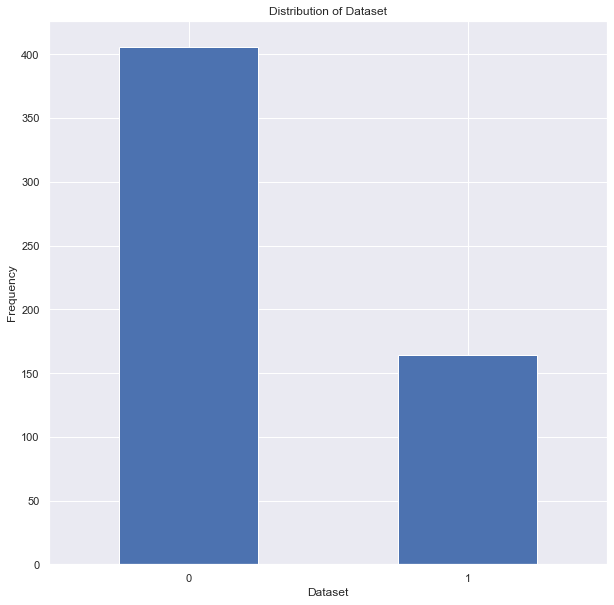

In [19]:
# See the Categorical Distribution of "Dataset" Column/Series
count_Dataset = value_counts(Label, sort = True)

count_Dataset.plot(kind = 'bar', rot=0)

title("Distribution of Dataset")

xlabel("Dataset")

ylabel("Frequency")

In [20]:
## Get the GoodLiver and the BadLiver dataset

GoodLiver = Liver[Liver['Dataset']==0]

BadLiver = Liver[Liver['Dataset']==1]

In [21]:
print(GoodLiver.shape,BadLiver.shape)

(406, 11) (164, 11)


In [22]:
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import NearMiss

In [23]:
# Implementing Oversampling for Handling Imbalanced Target Column
smk = SMOTETomek(random_state=42)
X_res,Y_res=smk.fit_sample(Features,Label)

In [24]:
X_res.shape,Y_res.shape

((766, 10), (766,))

In [25]:
from collections import Counter
print('Original dataset shape {}'.format(Counter(Label)))
print('Resampled dataset shape {}'.format(Counter(Y_res)))

Original dataset shape Counter({0: 406, 1: 164})
Resampled dataset shape Counter({0: 383, 1: 383})


In [26]:
## RandomOverSampler to handle imbalanced data

from imblearn.over_sampling import RandomOverSampler
os =  RandomOverSampler(sampling_strategy=1)
X_train_res, Y_train_res = os.fit_sample(Features, Label)
X_train_res.shape,Y_train_res.shape

((812, 10), (812,))

In [27]:
X_train_res, Y_train_res = os.fit_sample(Features, Label)

In [28]:
X_train_res.shape,Y_train_res.shape

((812, 10), (812,))

In [29]:
print('Original dataset shape {}'.format(Counter(Label)))
print('Resampled dataset shape {}'.format(Counter(Y_train_res)))

Original dataset shape Counter({0: 406, 1: 164})
Resampled dataset shape Counter({0: 406, 1: 406})


In [30]:
# In this example I use SMOTETomek which is a method of imblearn. SMOTETomek is a hybrid method
# which uses an under sampling method (Tomek) in with an over sampling method (SMOTE).
os_us = SMOTETomek(sampling_strategy=1)

X_train_res1, Y_train_res1 = os_us.fit_sample(Features, Label)

In [31]:
X_train_res1.shape,Y_train_res1.shape

((758, 10), (758,))

In [32]:
print('Original dataset shape {}'.format(Counter(Label)))
print('Resampled dataset shape {}'.format(Counter(Y_train_res1)))

Original dataset shape Counter({0: 406, 1: 164})
Resampled dataset shape Counter({0: 379, 1: 379})


In [33]:
#Final ConCatination For Creating Features
#Features will be 2D DataFrame
Liver=concat([X_res, Y_res],axis=1)
Liver.head()

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90,0
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74,0
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89,0
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00,0
4,72,1,3.9,2.0,195,27,59,7.3,2.4,0.40,0


In [34]:
# examine the duplicate rows (ignoring the first occurrence)
Liver.loc[Liver.duplicated(keep='first'), :]

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset


In [35]:
#Saving This Liver DataFrame into DataFile folder as Liver.csv file
Liver.to_csv(r'D:\Python Data\Anwesh Python\DataFile\Liver.csv', index=False)

In [36]:
Liver=read_csv("DataFile\\Liver.csv",sep=',',header='infer',na_values=None,keep_default_na=True,na_filter=True,index_col=None) #Write the file path & name inside ("")
Liver

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
0,65,0,0.700000,0.100000,187,16,18,6.800000,3.300000,0.900000,0
1,62,1,10.900000,5.500000,699,64,100,7.500000,3.200000,0.740000,0
2,62,1,7.300000,4.100000,490,60,68,7.000000,3.300000,0.890000,0
3,58,1,1.000000,0.400000,182,14,20,6.800000,3.400000,1.000000,0
4,72,1,3.900000,2.000000,195,27,59,7.300000,2.400000,0.400000,0
5,46,1,1.800000,0.700000,208,19,14,7.600000,4.400000,1.300000,0
6,26,0,0.900000,0.200000,154,16,12,7.000000,3.500000,1.000000,0
7,29,0,0.900000,0.300000,202,14,11,6.700000,3.600000,1.100000,0
8,17,1,0.900000,0.300000,202,22,19,7.400000,4.100000,1.200000,1
9,55,1,0.700000,0.200000,290,53,58,6.800000,3.400000,1.000000,0


# Shapiro for Normality test of All Numeric Columns

In [37]:
#Normality test/Distribution test of all columns/variables
from scipy.stats import shapiro
stat,pvalue = shapiro(Liver['Age'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Age is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Age is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*D'Agostino's Skewness/K^2 test(normality)
from scipy.stats import normaltest
stat,pvalue = normaltest(Liver['Age'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Age is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Age is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*Anderson Darling Test(normality)
from scipy.stats import anderson
Result=anderson(Liver['Age'])
p=0
for i in range(len(Result.critical_values)):
    SL, CV = Result.significance_level[i], Result.critical_values[i]
    if Result.statistic < Result.critical_values[i]:
        print("Null Hypothesis (H0): '%.3f : %.3f, Age is Normally distributed"%(SL,CV))
    else:
        print("Alternate Hypothesis (H1): '%.3f : %.3f, Age is not Normally Distributed"%(SL,CV))
print("Confidence Level : {} %".format(((1- Result.statistic)*100)))
print('Statistic: %.3f' % Result.statistic)

Alternate Hypothesis (H1): Age is not Normally distributed
Confidence Level : 99.99873584929446 %
Statistics=0.989, p=0.000
Alternate Hypothesis (H1): Age is not Normally distributed
Confidence Level : 99.99999923530267 %
Statistics=37.378, p=0.000
Alternate Hypothesis (H1): '15.000 : 0.573, Age is not Normally Distributed
Alternate Hypothesis (H1): '10.000 : 0.653, Age is not Normally Distributed
Alternate Hypothesis (H1): '5.000 : 0.783, Age is not Normally Distributed
Alternate Hypothesis (H1): '2.500 : 0.913, Age is not Normally Distributed
Alternate Hypothesis (H1): '1.000 : 1.086, Age is not Normally Distributed
Confidence Level : -152.64685339449215 %
Statistic: 2.526


In [38]:
#Normality test/Distribution test of all columns/variables
stat,pvalue = shapiro(Liver['Total_Bilirubin'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Total_Bilirubin is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Total_Bilirubin is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*D'Agostino's Skewness/K^2 test(normality)
stat,pvalue = normaltest(Liver['Total_Bilirubin'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Total_Bilirubin is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Total_Bilirubin is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*Anderson Darling Test(normality)
Result=anderson(Liver['Total_Bilirubin'])
p=0
for i in range(len(Result.critical_values)):
    SL, CV = Result.significance_level[i], Result.critical_values[i]
    if Result.statistic < Result.critical_values[i]:
        print("Null Hypothesis (H0): '%.3f : %.3f, Total_Bilirubin is Normally distributed"%(SL,CV))
    else:
        print("Alternate Hypothesis (H1): '%.3f : %.3f, Total_Bilirubin is not Normally Distributed"%(SL,CV))
print("Confidence Level : {} %".format(((1- Result.statistic)*100)))
print('Statistic: %.3f' % Result.statistic)

Alternate Hypothesis (H1): Total_Bilirubin is not Normally distributed
Confidence Level : 100.0 %
Statistics=0.388, p=0.000
Alternate Hypothesis (H1): Total_Bilirubin is not Normally distributed
Confidence Level : 100.0 %
Statistics=896.671, p=0.000
Alternate Hypothesis (H1): '15.000 : 0.573, Total_Bilirubin is not Normally Distributed
Alternate Hypothesis (H1): '10.000 : 0.653, Total_Bilirubin is not Normally Distributed
Alternate Hypothesis (H1): '5.000 : 0.783, Total_Bilirubin is not Normally Distributed
Alternate Hypothesis (H1): '2.500 : 0.913, Total_Bilirubin is not Normally Distributed
Alternate Hypothesis (H1): '1.000 : 1.086, Total_Bilirubin is not Normally Distributed
Confidence Level : -16589.62395793742 %
Statistic: 166.896


In [39]:
#Normality test/Distribution test of all columns/variables
stat,pvalue = shapiro(Liver['Direct_Bilirubin'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Direct_Bilirubin is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Direct_Bilirubin is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*D'Agostino's Skewness/K^2 test(normality)
stat,pvalue = normaltest(Liver['Direct_Bilirubin'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Direct_Bilirubin is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Direct_Bilirubin is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*Anderson Darling Test(normality)
Result=anderson(Liver['Direct_Bilirubin'])
p=0
for i in range(len(Result.critical_values)):
    SL, CV = Result.significance_level[i], Result.critical_values[i]
    if Result.statistic < Result.critical_values[i]:
        print("Null Hypothesis (H0): '%.3f : %.3f, Direct_Bilirubin is Normally distributed"%(SL,CV))
    else:
        print("Alternate Hypothesis (H1): '%.3f : %.3f, Direct_Bilirubin is not Normally Distributed"%(SL,CV))
print("Confidence Level : {} %".format(((1- Result.statistic)*100)))
print('Statistic: %.3f' % Result.statistic)

Alternate Hypothesis (H1): Direct_Bilirubin is not Normally distributed
Confidence Level : 100.0 %
Statistics=0.450, p=0.000
Alternate Hypothesis (H1): Direct_Bilirubin is not Normally distributed
Confidence Level : 100.0 %
Statistics=638.308, p=0.000
Alternate Hypothesis (H1): '15.000 : 0.573, Direct_Bilirubin is not Normally Distributed
Alternate Hypothesis (H1): '10.000 : 0.653, Direct_Bilirubin is not Normally Distributed
Alternate Hypothesis (H1): '5.000 : 0.783, Direct_Bilirubin is not Normally Distributed
Alternate Hypothesis (H1): '2.500 : 0.913, Direct_Bilirubin is not Normally Distributed
Alternate Hypothesis (H1): '1.000 : 1.086, Direct_Bilirubin is not Normally Distributed
Confidence Level : -15706.743745402275 %
Statistic: 158.067


In [40]:
#Normality test/Distribution test of all columns/variables
stat,pvalue = shapiro(Liver['Alkaline_Phosphotase'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Alkaline_Phosphotase is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Alkaline_Phosphotase is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*D'Agostino's Skewness/K^2 test(normality)
stat,pvalue = normaltest(Liver['Alkaline_Phosphotase'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Alkaline_Phosphotase is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Alkaline_Phosphotase is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*Anderson Darling Test(normality)
Result=anderson(Liver['Alkaline_Phosphotase'])
p=0
for i in range(len(Result.critical_values)):
    SL, CV = Result.significance_level[i], Result.critical_values[i]
    if Result.statistic < Result.critical_values[i]:
        print("Null Hypothesis (H0): '%.3f : %.3f, Alkaline_Phosphotase is Normally distributed"%(SL,CV))
    else:
        print("Alternate Hypothesis (H1): '%.3f : %.3f, Alkaline_Phosphotase is not Normally Distributed"%(SL,CV))
print("Confidence Level : {} %".format(((1- Result.statistic)*100)))
print('Statistic: %.3f' % Result.statistic)

Alternate Hypothesis (H1): Alkaline_Phosphotase is not Normally distributed
Confidence Level : 100.0 %
Statistics=0.539, p=0.000
Alternate Hypothesis (H1): Alkaline_Phosphotase is not Normally distributed
Confidence Level : 100.0 %
Statistics=721.120, p=0.000
Alternate Hypothesis (H1): '15.000 : 0.573, Alkaline_Phosphotase is not Normally Distributed
Alternate Hypothesis (H1): '10.000 : 0.653, Alkaline_Phosphotase is not Normally Distributed
Alternate Hypothesis (H1): '5.000 : 0.783, Alkaline_Phosphotase is not Normally Distributed
Alternate Hypothesis (H1): '2.500 : 0.913, Alkaline_Phosphotase is not Normally Distributed
Alternate Hypothesis (H1): '1.000 : 1.086, Alkaline_Phosphotase is not Normally Distributed
Confidence Level : -10130.186364793508 %
Statistic: 102.302


In [41]:
#Normality test/Distribution test of all columns/variables
stat,pvalue = shapiro(Liver['Alamine_Aminotransferase'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Alamine_Aminotransferase is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Alamine_Aminotransferase is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*D'Agostino's Skewness/K^2 test(normality)
stat,pvalue = normaltest(Liver['Alamine_Aminotransferase'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Alamine_Aminotransferase is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Alamine_Aminotransferase is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*Anderson Darling Test(normality)
Result=anderson(Liver['Alamine_Aminotransferase'])
p=0
for i in range(len(Result.critical_values)):
    SL, CV = Result.significance_level[i], Result.critical_values[i]
    if Result.statistic < Result.critical_values[i]:
        print("Null Hypothesis (H0): '%.3f : %.3f, Alamine_Aminotransferase is Normally distributed"%(SL,CV))
    else:
        print("Alternate Hypothesis (H1): '%.3f : %.3f, Alamine_Aminotransferase is not Normally Distributed"%(SL,CV))
print("Confidence Level : {} %".format(((1- Result.statistic)*100)))
print('Statistic: %.3f' % Result.statistic)

Alternate Hypothesis (H1): Alamine_Aminotransferase is not Normally distributed
Confidence Level : 100.0 %
Statistics=0.283, p=0.000
Alternate Hypothesis (H1): Alamine_Aminotransferase is not Normally distributed
Confidence Level : 100.0 %
Statistics=1070.880, p=0.000
Alternate Hypothesis (H1): '15.000 : 0.573, Alamine_Aminotransferase is not Normally Distributed
Alternate Hypothesis (H1): '10.000 : 0.653, Alamine_Aminotransferase is not Normally Distributed
Alternate Hypothesis (H1): '5.000 : 0.783, Alamine_Aminotransferase is not Normally Distributed
Alternate Hypothesis (H1): '2.500 : 0.913, Alamine_Aminotransferase is not Normally Distributed
Alternate Hypothesis (H1): '1.000 : 1.086, Alamine_Aminotransferase is not Normally Distributed
Confidence Level : -17476.826007742977 %
Statistic: 175.768


In [42]:
#Normality test/Distribution test of all columns/variables
stat,pvalue = shapiro(Liver['Aspartate_Aminotransferase'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Aspartate_Aminotransferase is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Aspartate_Aminotransferase is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*D'Agostino's Skewness/K^2 test(normality)
stat,pvalue = normaltest(Liver['Aspartate_Aminotransferase'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Aspartate_Aminotransferase is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Aspartate_Aminotransferase is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*Anderson Darling Test(normality)
Result=anderson(Liver['Aspartate_Aminotransferase'])
p=0
for i in range(len(Result.critical_values)):
    SL, CV = Result.significance_level[i], Result.critical_values[i]
    if Result.statistic < Result.critical_values[i]:
        print("Null Hypothesis (H0): '%.3f : %.3f, Aspartate_Aminotransferase is Normally distributed"%(SL,CV))
    else:
        print("Alternate Hypothesis (H1): '%.3f : %.3f, Aspartate_Aminotransferase is not Normally Distributed"%(SL,CV))
print("Confidence Level : {} %".format(((1- Result.statistic)*100)))
print('Statistic: %.3f' % Result.statistic)

Alternate Hypothesis (H1): Aspartate_Aminotransferase is not Normally distributed
Confidence Level : 100.0 %
Statistics=0.239, p=0.000
Alternate Hypothesis (H1): Aspartate_Aminotransferase is not Normally distributed
Confidence Level : 100.0 %
Statistics=1390.049, p=0.000
Alternate Hypothesis (H1): '15.000 : 0.573, Aspartate_Aminotransferase is not Normally Distributed
Alternate Hypothesis (H1): '10.000 : 0.653, Aspartate_Aminotransferase is not Normally Distributed
Alternate Hypothesis (H1): '5.000 : 0.783, Aspartate_Aminotransferase is not Normally Distributed
Alternate Hypothesis (H1): '2.500 : 0.913, Aspartate_Aminotransferase is not Normally Distributed
Alternate Hypothesis (H1): '1.000 : 1.086, Aspartate_Aminotransferase is not Normally Distributed
Confidence Level : -17847.05968341175 %
Statistic: 179.471


In [43]:
#Normality test/Distribution test of all columns/variables
stat,pvalue = shapiro(Liver['Total_Protiens'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Total_Protiens is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Total_Protiens is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*D'Agostino's Skewness/K^2 test(normality)
stat,pvalue = normaltest(Liver['Total_Protiens'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Total_Protiens is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Total_Protiens is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*Anderson Darling Test(normality)
Result=anderson(Liver['Total_Protiens'])
p=0
for i in range(len(Result.critical_values)):
    SL, CV = Result.significance_level[i], Result.critical_values[i]
    if Result.statistic < Result.critical_values[i]:
        print("Null Hypothesis (H0): '%.3f : %.3f, Total_Protiens is Normally distributed"%(SL,CV))
    else:
        print("Alternate Hypothesis (H1): '%.3f : %.3f, Total_Protiens is not Normally Distributed"%(SL,CV))
print("Confidence Level : {} %".format(((1- Result.statistic)*100)))
print('Statistic: %.3f' % Result.statistic)

Alternate Hypothesis (H1): Total_Protiens is not Normally distributed
Confidence Level : 99.97194789466448 %
Statistics=0.992, p=0.000
Alternate Hypothesis (H1): Total_Protiens is not Normally distributed
Confidence Level : 99.95211727066967 %
Statistics=15.288, p=0.000
Alternate Hypothesis (H1): '15.000 : 0.573, Total_Protiens is not Normally Distributed
Alternate Hypothesis (H1): '10.000 : 0.653, Total_Protiens is not Normally Distributed
Alternate Hypothesis (H1): '5.000 : 0.783, Total_Protiens is not Normally Distributed
Alternate Hypothesis (H1): '2.500 : 0.913, Total_Protiens is not Normally Distributed
Alternate Hypothesis (H1): '1.000 : 1.086, Total_Protiens is not Normally Distributed
Confidence Level : -48.784410359121466 %
Statistic: 1.488


In [44]:
#Normality test/Distribution test of all columns/variables
stat,pvalue = shapiro(Liver['Albumin'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Albumin is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Albumin is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*D'Agostino's Skewness/K^2 test(normality)
stat,pvalue = normaltest(Liver['Albumin'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Albumin is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Albumin is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*Anderson Darling Test(normality)
Result=anderson(Liver['Albumin'])
p=0
for i in range(len(Result.critical_values)):
    SL, CV = Result.significance_level[i], Result.critical_values[i]
    if Result.statistic < Result.critical_values[i]:
        print("Null Hypothesis (H0): '%.3f : %.3f, Albumin is Normally distributed"%(SL,CV))
    else:
        print("Alternate Hypothesis (H1): '%.3f : %.3f, Albumin is not Normally Distributed"%(SL,CV))
print("Confidence Level : {} %".format(((1- Result.statistic)*100)))
print('Statistic: %.3f' % Result.statistic)

Alternate Hypothesis (H1): Albumin is not Normally distributed
Confidence Level : 99.98822240086156 %
Statistics=0.991, p=0.000
Alternate Hypothesis (H1): Albumin is not Normally distributed
Confidence Level : 99.40685054647473 %
Statistics=10.255, p=0.006
Alternate Hypothesis (H1): '15.000 : 0.573, Albumin is not Normally Distributed
Alternate Hypothesis (H1): '10.000 : 0.653, Albumin is not Normally Distributed
Alternate Hypothesis (H1): '5.000 : 0.783, Albumin is not Normally Distributed
Alternate Hypothesis (H1): '2.500 : 0.913, Albumin is not Normally Distributed
Alternate Hypothesis (H1): '1.000 : 1.086, Albumin is not Normally Distributed
Confidence Level : -132.9576485466191 %
Statistic: 2.330


In [45]:
#Normality test/Distribution test of all columns/variables
stat,pvalue = shapiro(Liver['Albumin_and_Globulin_Ratio'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Albumin_and_Globulin_Ratio is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Albumin_and_Globulin_Ratio is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*D'Agostino's Skewness/K^2 test(normality)
stat,pvalue = normaltest(Liver['Albumin_and_Globulin_Ratio'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Albumin_and_Globulin_Ratio is Normally Distributed")
else:
    print("Alternate Hypothesis (H1): Albumin_and_Globulin_Ratio is not Normally distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*Anderson Darling Test(normality)
Result=anderson(Liver['Albumin_and_Globulin_Ratio'])
p=0
for i in range(len(Result.critical_values)):
    SL, CV = Result.significance_level[i], Result.critical_values[i]
    if Result.statistic < Result.critical_values[i]:
        print("Null Hypothesis (H0): '%.3f : %.3f, Albumin_and_Globulin_Ratio is Normally distributed"%(SL,CV))
    else:
        print("Alternate Hypothesis (H1): '%.3f : %.3f, Albumin_and_Globulin_Ratio is not Normally Distributed"%(SL,CV))
print("Confidence Level : {} %".format(((1- Result.statistic)*100)))
print('Statistic: %.3f' % Result.statistic)

Alternate Hypothesis (H1): Albumin_and_Globulin_Ratio is not Normally distributed
Confidence Level : 99.99999999998623 %
Statistics=0.960, p=0.000
Alternate Hypothesis (H1): Albumin_and_Globulin_Ratio is not Normally distributed
Confidence Level : 100.0 %
Statistics=125.947, p=0.000
Alternate Hypothesis (H1): '15.000 : 0.573, Albumin_and_Globulin_Ratio is not Normally Distributed
Alternate Hypothesis (H1): '10.000 : 0.653, Albumin_and_Globulin_Ratio is not Normally Distributed
Alternate Hypothesis (H1): '5.000 : 0.783, Albumin_and_Globulin_Ratio is not Normally Distributed
Alternate Hypothesis (H1): '2.500 : 0.913, Albumin_and_Globulin_Ratio is not Normally Distributed
Alternate Hypothesis (H1): '1.000 : 1.086, Albumin_and_Globulin_Ratio is not Normally Distributed
Confidence Level : -327.31730729005903 %
Statistic: 4.273


# Non-Parametric Measures of Association

In [46]:
#"Dataset" is Nominal(Categorical) Dependent Variable
#"Age" is Continuous(Ratio Scale) Independent Variable

#To find Correlation between "Age" & "Dataset" we will Perform Kruskal Wallis H Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Age" & Liver "Dataset"
#Sampling of "Age" for each category of "Dataset"
Dataset_0=Liver[Liver.Dataset==0]
Dataset_1=Liver[Liver.Dataset==1]

#There Should Be No Outliers for the Continuous Variable ie "Age" for each category of the "Dataset" variable
#Continuous Variable Should be approximately normally distributed for each category of the "Dataset" variable
#Continuous Variable Should have equal Variances for Each Category of the "Dataset" variable
stat,pvalue=pointbiserialr(Liver['Dataset'], Liver['Age'])
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Age have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Age are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Lets do Mann Whiteny U Test First
stat,pvalue=mannwhitneyu(Dataset_0.Age,Dataset_1.Age)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Age have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Age are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Each Sample Must have at least 5 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue=kruskal(Dataset_0.Age,Dataset_1.Age)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Age have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Age are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Dataset" & "Age" we will Perform Moods Median Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Age" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue,GrandMedian,ContigTable=median_test(Dataset_0.Age,Dataset_1.Age)
print(GrandMedian)
print(ContigTable)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Age have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Age are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))


#To find Correlation between "Age" & "Dataset" we will Perform Wilcoxon Rank Sum Test
#It is Non Parametric Version of independent 2 sample T test
#Correlation between Liver "Age" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#Only two samples work for this test
#The samples are not required to have the same length
correlation,pvalue = ranksums(Dataset_0.Age,Dataset_1.Age)
print("Wilcoxon Rank Sum correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Dataset and Age have non linear relationship")
else:
    print("Null Hypothesis (H0)- Dataset and Age have no non linear relationship")

Null Hypothesis (H0) : Dataset and Age are independent of each other.
Confidence Level : nan %
Statistics=nan, p=nan
Alternate Hypothesis (H1): Dataset and Age have some form of relationship.
Confidence Level : 99.99974409628507 %
Statistics=59385.500, p=0.000
Alternate Hypothesis (H1): Dataset and Age have some form of relationship.
Confidence Level : 99.99948859050447 %
Statistics=20.794, p=0.000
45.0
[[205 150]
 [178 233]]
Alternate Hypothesis (H1): Dataset and Age have some form of relationship.
Confidence Level : 99.99087182082796 %
Statistics=15.309, p=0.000
Wilcoxon Rank Sum correlation coefficient:4.559
5.145204530280737e-06
Confidence Level : 99.99948547954696 %
Alternate Hypothesis (H1) - Dataset and Age have non linear relationship


In [47]:
#"Dataset" is Nominal(Categorical) Dependent Variable
#"Total_Bilirubin" is Continuous(Ratio Scale) Independent Variable

#To find Correlation between "Total_Bilirubin" & "Dataset" we will Perform Kruskal Wallis H Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Total_Bilirubin" & Liver "Dataset"
#Sampling of "Total_Bilirubin" for each category of "Dataset"

#There Should Be No Outliers for the Continuous Variable ie "Total_Bilirubin" for each category of the "Dataset" variable
#Continuous Variable Should be approximately normally distributed for each category of the "Dataset" variable
#Continuous Variable Should have equal Variances for Each Category of the "Dataset" variable
stat,pvalue=pointbiserialr(Liver['Dataset'], Liver['Total_Bilirubin'])
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Total_Bilirubin have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Total_Bilirubin are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Lets do Mann Whiteny U Test First
stat,pvalue=mannwhitneyu(Dataset_0.Total_Bilirubin,Dataset_1.Total_Bilirubin)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Total_Bilirubin have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Total_Bilirubin are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Each Sample Must have at least 5 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue=kruskal(Dataset_0.Total_Bilirubin,Dataset_1.Total_Bilirubin)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Total_Bilirubin have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Total_Bilirubin are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Dataset" & "Total_Bilirubin" we will Perform Moods Median Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Total_Bilirubin" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue,GrandMedian,ContigTable=median_test(Dataset_0.Total_Bilirubin,Dataset_1.Total_Bilirubin)
print(GrandMedian)
print(ContigTable)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Total_Bilirubin have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Total_Bilirubin are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))


#To find Correlation between "Total_Bilirubin" & "Dataset" we will Perform Wilcoxon Rank Sum Test
#It is Non Parametric Version of independent 2 sample T test
#Correlation between Liver "Total_Bilirubin" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#Only two samples work for this test
#The samples are not required to have the same length
correlation,pvalue = ranksums(Dataset_0.Total_Bilirubin,Dataset_1.Total_Bilirubin)
print("Wilcoxon Rank Sum correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Dataset and Total_Bilirubin have non linear relationship")
else:
    print("Null Hypothesis (H0)- Dataset and Total_Bilirubin have no non linear relationship")

Alternate Hypothesis (H1): Dataset and Total_Bilirubin have some form of relationship.
Confidence Level : 100.0 %
Statistics=-0.301, p=0.000
Alternate Hypothesis (H1): Dataset and Total_Bilirubin have some form of relationship.
Confidence Level : 100.0 %
Statistics=43032.500, p=0.000
Alternate Hypothesis (H1): Dataset and Total_Bilirubin have some form of relationship.
Confidence Level : 100.0 %
Statistics=98.329, p=0.000
0.9
[[232 136]
 [151 247]]
Alternate Hypothesis (H1): Dataset and Total_Bilirubin have some form of relationship.
Confidence Level : 99.9999999993591 %
Statistics=47.200, p=0.000
Wilcoxon Rank Sum correlation coefficient:9.899
4.187907279687936e-23
Confidence Level : 100.0 %
Alternate Hypothesis (H1) - Dataset and Total_Bilirubin have non linear relationship


In [48]:
#"Dataset" is Nominal(Categorical) Dependent Variable
#"Direct_Bilirubin" is Continuous(Ratio Scale) Independent Variable

#To find Correlation between "Direct_Bilirubin" & "Dataset" we will Perform Kruskal Wallis H Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Direct_Bilirubin" & Liver "Dataset"
#Sampling of "Direct_Bilirubin" for each category of "Dataset"

#There Should Be No Outliers for the Continuous Variable ie "Direct_Bilirubin" for each category of the "Dataset" variable
#Continuous Variable Should be approximately normally distributed for each category of the "Dataset" variable
#Continuous Variable Should have equal Variances for Each Category of the "Dataset" variable
stat,pvalue=pointbiserialr(Liver['Dataset'], Liver['Direct_Bilirubin'])
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Direct_Bilirubin have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Direct_Bilirubin are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Lets do Mann Whiteny U Test First
stat,pvalue=mannwhitneyu(Dataset_0.Direct_Bilirubin,Dataset_1.Direct_Bilirubin)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Direct_Bilirubin have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Direct_Bilirubin are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Each Sample Must have at least 5 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue=kruskal(Dataset_0.Direct_Bilirubin,Dataset_1.Direct_Bilirubin)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Direct_Bilirubin have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Direct_Bilirubin are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Dataset" & "Direct_Bilirubin" we will Perform Moods Median Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Direct_Bilirubin" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue,GrandMedian,ContigTable=median_test(Dataset_0.Direct_Bilirubin,Dataset_1.Direct_Bilirubin)
print(GrandMedian)
print(ContigTable)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Direct_Bilirubin have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Direct_Bilirubin are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))


#To find Correlation between "Direct_Bilirubin" & "Dataset" we will Perform Wilcoxon Rank Sum Test
#It is Non Parametric Version of independent 2 sample T test
#Correlation between Liver "Direct_Bilirubin" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#Only two samples work for this test
#The samples are not required to have the same length
correlation,pvalue = ranksums(Dataset_0.Direct_Bilirubin,Dataset_1.Direct_Bilirubin)
print("Wilcoxon Rank Sum correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Dataset and Direct_Bilirubin have non linear relationship")
else:
    print("Null Hypothesis (H0)- Dataset and Direct_Bilirubin have no non linear relationship")

Alternate Hypothesis (H1): Dataset and Direct_Bilirubin have some form of relationship.
Confidence Level : 100.0 %
Statistics=-0.335, p=0.000
Alternate Hypothesis (H1): Dataset and Direct_Bilirubin have some form of relationship.
Confidence Level : 100.0 %
Statistics=44402.500, p=0.000
Alternate Hypothesis (H1): Dataset and Direct_Bilirubin have some form of relationship.
Confidence Level : 100.0 %
Statistics=92.593, p=0.000
0.2627014550908131
[[245 138]
 [138 245]]
Alternate Hypothesis (H1): Dataset and Direct_Bilirubin have some form of relationship.
Confidence Level : 99.99999999999814 %
Statistics=58.674, p=0.000
Wilcoxon Rank Sum correlation coefficient:9.452
3.3248701547085424e-21
Confidence Level : 100.0 %
Alternate Hypothesis (H1) - Dataset and Direct_Bilirubin have non linear relationship


In [49]:
#"Dataset" is Nominal (Categorical) Dependent Variable
#"Alkaline_Phosphotase" is Continuous (Ratio Scale) Independent Variable

#To find Correlation between "Alkaline_Phosphotase" & "Dataset" we will Perform Kruskal Wallis H Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Alkaline_Phosphotase" & Liver "Dataset"
#Sampling of "Alkaline_Phosphotase" for each category of "Dataset"

#There Should Be No Outliers for the Continuous Variable ie "Alkaline_Phosphotase" for each category of the "Dataset" variable
#Continuous Variable Should be approximately normally distributed for each category of the "Dataset" variable
#Continuous Variable Should have equal Variances for Each Category of the "Dataset" variable
stat,pvalue=pointbiserialr(Liver['Dataset'], Liver['Alkaline_Phosphotase'])
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Alkaline_Phosphotase have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Alkaline_Phosphotase are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Lets do Mann Whiteny U Test First
stat,pvalue=mannwhitneyu(Dataset_0.Alkaline_Phosphotase,Dataset_1.Alkaline_Phosphotase)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Alkaline_Phosphotase have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Alkaline_Phosphotase are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Each Sample Must have at least 5 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue=kruskal(Dataset_0.Alkaline_Phosphotase,Dataset_1.Alkaline_Phosphotase)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Alkaline_Phosphotase have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Alkaline_Phosphotase are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Dataset" & "Alkaline_Phosphotase" we will Perform Moods Median Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Alkaline_Phosphotase" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue,GrandMedian,ContigTable=median_test(Dataset_0.Alkaline_Phosphotase,Dataset_1.Alkaline_Phosphotase)
print(GrandMedian)
print(ContigTable)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Alkaline_Phosphotase have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Alkaline_Phosphotase are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))


#To find Correlation between "Alkaline_Phosphotase" & "fueltype" we will Perform Wilcoxon Rank Sum Test
#It is Non Parametric Version of independent 2 sample T test
#Correlation between Liver "Alkaline_Phosphotase" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#Only two samples work for this test
#The samples are not required to have the same length
correlation,pvalue = ranksums(Dataset_0.Alkaline_Phosphotase,Dataset_1.Alkaline_Phosphotase)
print("Wilcoxon Rank Sum correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Dataset and Alkaline_Phosphotase have non linear relationship")
else:
    print("Null Hypothesis (H0)- Dataset and Alkaline_Phosphotase have no non linear relationship")

Alternate Hypothesis (H1): Dataset and Alkaline_Phosphotase have some form of relationship.
Confidence Level : 99.99999999999113 %
Statistics=-0.265, p=0.000
Alternate Hypothesis (H1): Dataset and Alkaline_Phosphotase have some form of relationship.
Confidence Level : 100.0 %
Statistics=44904.000, p=0.000
Alternate Hypothesis (H1): Dataset and Alkaline_Phosphotase have some form of relationship.
Confidence Level : 100.0 %
Statistics=86.278, p=0.000
198.0
[[247 126]
 [136 257]]
Alternate Hypothesis (H1): Dataset and Alkaline_Phosphotase have some form of relationship.
Confidence Level : 100.0 %
Statistics=75.247, p=0.000
Wilcoxon Rank Sum correlation coefficient:9.288
1.5692468174474656e-20
Confidence Level : 100.0 %
Alternate Hypothesis (H1) - Dataset and Alkaline_Phosphotase have non linear relationship


In [50]:
#"Dataset" is Nominal (Categorical) Dependent Variable
#"Alamine_Aminotransferase" is Continuous (Ratio Scale) Independent Variable

#To find Correlation between "Alamine_Aminotransferase" & "Dataset" we will Perform Kruskal Wallis H Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Alamine_Aminotransferase" & Liver "Dataset"
#Sampling of "Alamine_Aminotransferase" for each category of "Dataset"

#There Should Be No Outliers for the Continuous Variable ie "Alamine_Aminotransferase" for each category of the "Dataset" variable
#Continuous Variable Should be approximately normally distributed for each category of the "Dataset" variable
#Continuous Variable Should have equal Variances for Each Category of the "Dataset" variable
stat,pvalue=pointbiserialr(Liver['Dataset'], Liver['Alamine_Aminotransferase'])
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Alamine_Aminotransferase have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Alamine_Aminotransferase are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Lets do Mann Whiteny U Test First
stat,pvalue=mannwhitneyu(Dataset_0.Alamine_Aminotransferase,Dataset_1.Alamine_Aminotransferase)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Alamine_Aminotransferase have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Alamine_Aminotransferase are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Each Sample Must have at least 5 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue=kruskal(Dataset_0.Alamine_Aminotransferase,Dataset_1.Alamine_Aminotransferase)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Alamine_Aminotransferase have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Alamine_Aminotransferase are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Dataset" & "Alamine_Aminotransferase" we will Perform Moods Median Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Alamine_Aminotransferase" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue,GrandMedian,ContigTable=median_test(Dataset_0.Alamine_Aminotransferase,Dataset_1.Alamine_Aminotransferase)
print(GrandMedian)
print(ContigTable)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Alamine_Aminotransferase have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Alamine_Aminotransferase are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))


#To find Correlation between "Dataset" & "Alamine_Aminotransferase" we will Perform Wilcoxon Rank Sum Test
#It is Non Parametric Version of independent 2 sample T test
#Correlation between Liver "Dataset" & Liver "Alamine_Aminotransferase"
#Each Sample Must have at least 1 measurements
#Only two samples work for this test
#The samples are not required to have the same length
correlation,pvalue = ranksums(Dataset_0.Alamine_Aminotransferase,Dataset_1.Alamine_Aminotransferase)
print("Wilcoxon Rank Sum correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Dataset and Alamine_Aminotransferase have non linear relationship")
else:
    print("Null Hypothesis (H0)- Dataset and Alamine_Aminotransferase have no non linear relationship")

Alternate Hypothesis (H1): Dataset and Alamine_Aminotransferase have some form of relationship.
Confidence Level : 99.99999996070832 %
Statistics=-0.224, p=0.000
Alternate Hypothesis (H1): Dataset and Alamine_Aminotransferase have some form of relationship.
Confidence Level : 100.0 %
Statistics=42488.500, p=0.000
Alternate Hypothesis (H1): Dataset and Alamine_Aminotransferase have some form of relationship.
Confidence Level : 100.0 %
Statistics=101.597, p=0.000
30.0
[[250 130]
 [133 253]]
Alternate Hypothesis (H1): Dataset and Alamine_Aminotransferase have some form of relationship.
Confidence Level : 100.0 %
Statistics=73.952, p=0.000
Wilcoxon Rank Sum correlation coefficient:10.077
6.978375377072053e-24
Confidence Level : 100.0 %
Alternate Hypothesis (H1) - Dataset and Alamine_Aminotransferase have non linear relationship


In [51]:
#"Dataset" is Nominal(Categorical) Dependent Variable
#"Aspartate_Aminotransferase" is Continuous(Ratio Scale) Independent Variable

#To find Correlation between "Aspartate_Aminotransferase" & "Dataset" we will Perform Kruskal Wallis H Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Aspartate_Aminotransferase" & Liver "Dataset"
#Sampling of "Aspartate_Aminotransferase" for each category of "Dataset"

#There Should Be No Outliers for the Continuous Variable ie "Aspartate_Aminotransferase" for each category of the "Dataset" variable
#Continuous Variable Should be approximately normally distributed for each category of the "Dataset" variable
#Continuous Variable Should have equal Variances for Each Category of the "Dataset" variable
stat,pvalue=pointbiserialr(Liver['Dataset'], Liver['Aspartate_Aminotransferase'])
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Aspartate_Aminotransferase have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Aspartate_Aminotransferase are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Lets do Mann Whiteny U Test First
stat,pvalue=mannwhitneyu(Dataset_0.Aspartate_Aminotransferase,Dataset_1.Aspartate_Aminotransferase)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Aspartate_Aminotransferase have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Aspartate_Aminotransferase are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Each Sample Must have at least 5 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue=kruskal(Dataset_0.Aspartate_Aminotransferase,Dataset_1.Aspartate_Aminotransferase)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Aspartate_Aminotransferase have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Aspartate_Aminotransferase are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Dataset" & "Aspartate_Aminotransferase" we will Perform Moods Median Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Aspartate_Aminotransferase" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue,GrandMedian,ContigTable=median_test(Dataset_0.Aspartate_Aminotransferase,Dataset_1.Aspartate_Aminotransferase)
print(GrandMedian)
print(ContigTable)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Aspartate_Aminotransferase have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Aspartate_Aminotransferase are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))


#To find Correlation between "Aspartate_Aminotransferase" & "Datatype" we will Perform Wilcoxon Rank Sum Test
#It is Non Parametric Version of independent 2 sample T test
#Correlation between Liver "Aspartate_Aminotransferase" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#Only two samples work for this test
#The samples are not required to have the same length
correlation,pvalue = ranksums(Dataset_0.Aspartate_Aminotransferase,Dataset_1.Aspartate_Aminotransferase)
print("Wilcoxon Rank Sum correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Dataset and Aspartate_Aminotransferase have non linear relationship")
else:
    print("Null Hypothesis (H0)- Dataset and Aspartate_Aminotransferase have no non linear relationship")

Alternate Hypothesis (H1): Dataset and Aspartate_Aminotransferase have some form of relationship.
Confidence Level : 99.99999953661289 %
Statistics=-0.210, p=0.000
Alternate Hypothesis (H1): Dataset and Aspartate_Aminotransferase have some form of relationship.
Confidence Level : 100.0 %
Statistics=39856.500, p=0.000
Alternate Hypothesis (H1): Dataset and Aspartate_Aminotransferase have some form of relationship.
Confidence Level : 100.0 %
Statistics=119.656, p=0.000
35.0
[[252 122]
 [131 261]]
Alternate Hypothesis (H1): Dataset and Aspartate_Aminotransferase have some form of relationship.
Confidence Level : 100.0 %
Statistics=86.946, p=0.000
Wilcoxon Rank Sum correlation coefficient:10.937
7.701248044004461e-28
Confidence Level : 100.0 %
Alternate Hypothesis (H1) - Dataset and Aspartate_Aminotransferase have non linear relationship


In [52]:
#"Dataset" is Nominal(Categorical) Dependent Variable
#"Total_Protiens" is Continuous(Ratio Scale) Independent Variable

#To find Correlation between "Total_Protiens" & "Dataset" we will Perform Kruskal Wallis H Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Total_Protiens" & Liver "Dataset"
#Sampling of "Total_Protiens" for each category of "Dataset"

#There Should Be No Outliers for the Continuous Variable ie "Total_Protiens" for each category of the "Dataset" variable
#Continuous Variable Should be approximately normally distributed for each category of the "Dataset" variable
#Continuous Variable Should have equal Variances for Each Category of the "Dataset" variable
stat,pvalue=pointbiserialr(Liver['Dataset'], Liver['Total_Protiens'])
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Total_Protiens have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Total_Protiens are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Lets do Mann Whiteny U Test First
stat,pvalue=mannwhitneyu(Dataset_0.Total_Protiens,Dataset_1.Total_Protiens)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Total_Protiens have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Total_Protiens are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Each Sample Must have at least 5 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue=kruskal(Dataset_0.Total_Protiens,Dataset_1.Total_Protiens)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Total_Protiens have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Total_Protiens are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Dataset" & "Total_Protiens" we will Perform Moods Median Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Total_Protiens" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue,GrandMedian,ContigTable=median_test(Dataset_0.Total_Protiens,Dataset_1.Total_Protiens)
print(GrandMedian)
print(ContigTable)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Total_Protiens have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Total_Protiens are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))


#To find Correlation between "Total_Protiens" & "Dataset" we will Perform Wilcoxon Rank Sum Test
#It is Non Parametric Version of independent 2 sample T test
#Correlation between Liver "Total_Protiens" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#Only two samples work for this test
#The samples are not required to have the same length
correlation,pvalue = ranksums(Dataset_0.Total_Protiens,Dataset_1.Total_Protiens)
print("Wilcoxon Rank Sum correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Dataset and Total_Protiens have non linear relationship")
else:
    print("Null Hypothesis (H0)- Dataset and Total_Protiens have no non linear relationship")

Null Hypothesis (H0) : Dataset and Total_Protiens are independent of each other.
Confidence Level : 87.08339731220727 %
Statistics=0.055, p=0.129
Null Hypothesis (H0) : Dataset and Total_Protiens are independent of each other.
Confidence Level : 92.05046213826257 %
Statistics=69032.000, p=0.079
Null Hypothesis (H0) : Dataset and Total_Protiens are independent of each other.
Confidence Level : 84.10575657455533 %
Statistics=1.984, p=0.159
6.6
[[180 195]
 [203 188]]
Null Hypothesis (H0) : Dataset and Total_Protiens are independent of each other.
Confidence Level : 68.84150354369909 %
Statistics=1.024, p=0.312
Wilcoxon Rank Sum correlation coefficient:-1.408
0.1590152900984536
Confidence Level : 84.09847099015464 %
Null Hypothesis (H0)- Dataset and Total_Protiens have no non linear relationship


We will Remove 'Total_Protiens' Feature from the Liver Data

In [53]:
#"Dataset" is Nominal(Categorical) Dependent Variable
#"Albumin" is Continuous(Ratio Scale) Independent Variable

#To find Correlation between "Albumin" & "Dataset" we will Perform Kruskal Wallis H Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Albumin" & Liver "Dataset"
#Sampling of "Albumin" for each category of "Dataset"

#There Should Be No Outliers for the Continuous Variable ie "Albumin" for each category of the "Dataset" variable
#Continuous Variable Should be approximately normally distributed for each category of the "Dataset" variable
#Continuous Variable Should have equal Variances for Each Category of the "Dataset" variable
stat,pvalue=pointbiserialr(Liver['Dataset'], Liver['Albumin'])
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Albumin have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Albumin are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Lets do Mann Whiteny U Test First
stat,pvalue=mannwhitneyu(Dataset_0.Albumin,Dataset_1.Albumin)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Albumin have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Albumin are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Each Sample Must have at least 5 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue=kruskal(Dataset_0.Albumin,Dataset_1.Albumin)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Albumin have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Albumin are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Dataset" & "Albumin" we will Perform Moods Median Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Albumin" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue,GrandMedian,ContigTable=median_test(Dataset_0.Albumin,Dataset_1.Albumin)
print(GrandMedian)
print(ContigTable)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Albumin have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Albumin are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))


#To find Correlation between "Albumin" & "Dataset" we will Perform Wilcoxon Rank Sum Test
#It is Non Parametric Version of independent 2 sample T test
#Correlation between Liver "Albumin" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#Only two samples work for this test
#The samples are not required to have the same length
correlation,pvalue = ranksums(Dataset_0.Albumin,Dataset_1.Albumin)
print("Wilcoxon Rank Sum correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Dataset and Albumin have non linear relationship")
else:
    print("Null Hypothesis (H0)- Dataset and Albumin have no non linear relationship")

Alternate Hypothesis (H1): Dataset and Albumin have some form of relationship.
Confidence Level : 99.99999944865692 %
Statistics=0.209, p=0.000
Alternate Hypothesis (H1): Dataset and Albumin have some form of relationship.
Confidence Level : 99.99999990823655 %
Statistics=54941.500, p=0.000
Alternate Hypothesis (H1): Dataset and Albumin have some form of relationship.
Confidence Level : 99.99999981665796 %
Statistics=36.143, p=0.000
3.2
[[150 226]
 [233 157]]
Alternate Hypothesis (H1): Dataset and Albumin have some form of relationship.
Confidence Level : 99.99999406092154 %
Statistics=29.383, p=0.000
Wilcoxon Rank Sum correlation coefficient:-6.010
1.8539159532310553e-09
Confidence Level : 99.99999981460842 %
Alternate Hypothesis (H1) - Dataset and Albumin have non linear relationship


In [54]:
#"Dataset" is Nominal(Categorical) Dependent Variable
#"Albumin_and_Globulin_Ratio" is Continuous(Ratio Scale) Independent Variable

#To find Correlation between "Albumin_and_Globulin_Ratio" & "Dataset" we will Perform Kruskal Wallis H Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Albumin_and_Globulin_Ratio" & Liver "Dataset"
#Sampling of "Albumin_and_Globulin_Ratio" for each category of "Dataset"

#There Should Be No Outliers for the Continuous Variable ie "Albumin_and_Globulin_Ratio" for each category of the "Dataset" variable
#Continuous Variable Should be approximately normally distributed for each category of the "Dataset" variable
#Continuous Variable Should have equal Variances for Each Category of the "Dataset" variable
stat,pvalue=pointbiserialr(Liver['Dataset'], Liver['Albumin_and_Globulin_Ratio'])
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Albumin_and_Globulin_Ratio have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Albumin_and_Globulin_Ratio are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Lets do Mann Whiteny U Test First
stat,pvalue=mannwhitneyu(Dataset_0.Albumin_and_Globulin_Ratio,Dataset_1.Albumin_and_Globulin_Ratio)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Albumin_and_Globulin_Ratio have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Albumin_and_Globulin_Ratio are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Each Sample Must have at least 5 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue=kruskal(Dataset_0.Albumin_and_Globulin_Ratio,Dataset_1.Albumin_and_Globulin_Ratio)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Albumin_and_Globulin_Ratio have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Albumin_and_Globulin_Ratio are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Dataset" & "Albumin_and_Globulin_Ratio" we will Perform Moods Median Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Liver "Albumin_and_Globulin_Ratio" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue,GrandMedian,ContigTable=median_test(Dataset_0.Albumin_and_Globulin_Ratio,Dataset_1.Albumin_and_Globulin_Ratio)
print(GrandMedian)
print(ContigTable)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Dataset and Albumin_and_Globulin_Ratio have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Dataset and Albumin_and_Globulin_Ratio are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))


#To find Correlation between "Albumin_and_Globulin_Ratio" & "Dataset" we will Perform Wilcoxon Rank Sum Test
#It is Non Parametric Version of independent 2 sample T test
#Correlation between Liver "Albumin_and_Globulin_Ratio" & Liver "Dataset"
#Each Sample Must have at least 1 measurements
#Only two samples work for this test
#The samples are not required to have the same length
correlation,pvalue = ranksums(Dataset_0.Albumin_and_Globulin_Ratio,Dataset_1.Albumin_and_Globulin_Ratio)
print("Wilcoxon Rank Sum correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Dataset and Albumin_and_Globulin_Ratio have non linear relationship")
else:
    print("Null Hypothesis (H0)- Dataset and Albumin_and_Globulin_Ratio have no non linear relationship")

Alternate Hypothesis (H1): Dataset and Albumin_and_Globulin_Ratio have some form of relationship.
Confidence Level : 99.99999963026272 %
Statistics=0.211, p=0.000
Alternate Hypothesis (H1): Dataset and Albumin_and_Globulin_Ratio have some form of relationship.
Confidence Level : 99.99999999963376 %
Statistics=52404.000, p=0.000
Alternate Hypothesis (H1): Dataset and Albumin_and_Globulin_Ratio have some form of relationship.
Confidence Level : 99.99999999926837 %
Statistics=46.941, p=0.000
1.0
[[101 189]
 [282 194]]
Alternate Hypothesis (H1): Dataset and Albumin_and_Globulin_Ratio have some form of relationship.
Confidence Level : 99.99999999087854 %
Statistics=42.001, p=0.000
Wilcoxon Rank Sum correlation coefficient:-6.839
7.984777482626822e-12
Confidence Level : 99.99999999920152 %
Alternate Hypothesis (H1) - Dataset and Albumin_and_Globulin_Ratio have non linear relationship


In [55]:
# It shows type of the DataFrame
# Shows no of Rows & Cols
# Shows all Col names
# Shows total no of NaN values for each Column
# Shows data type of each Columns
Liver.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 766 entries, 0 to 765
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         766 non-null    int64  
 1   Gender                      766 non-null    int64  
 2   Total_Bilirubin             766 non-null    float64
 3   Direct_Bilirubin            766 non-null    float64
 4   Alkaline_Phosphotase        766 non-null    int64  
 5   Alamine_Aminotransferase    766 non-null    int64  
 6   Aspartate_Aminotransferase  766 non-null    int64  
 7   Total_Protiens              766 non-null    float64
 8   Albumin                     766 non-null    float64
 9   Albumin_and_Globulin_Ratio  766 non-null    float64
 10  Dataset                     766 non-null    int64  
dtypes: float64(5), int64(6)
memory usage: 66.0 KB


In [56]:
#Liver['Gender'] = Liver['Gender'].astype('category')
#Liver['Dataset'] = Liver['Dataset'].astype('category')

In [57]:
# It shows type of the DataFrame
# Shows no of Rows & Cols
# Shows all Col names
# Shows total no of NaN values for each Column
# Shows data type of each Columns
Liver.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 766 entries, 0 to 765
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         766 non-null    int64  
 1   Gender                      766 non-null    int64  
 2   Total_Bilirubin             766 non-null    float64
 3   Direct_Bilirubin            766 non-null    float64
 4   Alkaline_Phosphotase        766 non-null    int64  
 5   Alamine_Aminotransferase    766 non-null    int64  
 6   Aspartate_Aminotransferase  766 non-null    int64  
 7   Total_Protiens              766 non-null    float64
 8   Albumin                     766 non-null    float64
 9   Albumin_and_Globulin_Ratio  766 non-null    float64
 10  Dataset                     766 non-null    int64  
dtypes: float64(5), int64(6)
memory usage: 66.0 KB


In [58]:
#Detailed Test
from scipy.stats import linregress
linregress(Liver['Dataset'], Liver['Age'])

LinregressResult(slope=-5.689295039164489, intercept=46.404699738903396, rvalue=-0.17252484930324657, pvalue=1.5616361194182766e-06, stderr=1.1751644046193315)

In [59]:
linregress(Liver['Dataset'], Liver['Total_Bilirubin'])

LinregressResult(slope=-3.3012535463640247, intercept=4.313315926892951, rvalue=-0.30148958003611365, pvalue=1.465113840506474e-17, stderr=0.37771713499392034)

In [60]:
linregress(Liver['Dataset'], Liver['Direct_Bilirubin'])

LinregressResult(slope=-1.661986859449143, intercept=1.9932114882506524, rvalue=-0.3353685090255759, pvalue=1.3674319464832056e-21, stderr=0.16890777804857007)

In [61]:
linregress(Liver['Dataset'], Liver['Alkaline_Phosphotase'])

LinregressResult(slope=-113.80156657963447, intercept=322.0835509138381, rvalue=-0.26502265078128273, pvalue=8.87082390149183e-14, stderr=14.97975451090738)

In [62]:
linregress(Liver['Dataset'], Liver['Alamine_Aminotransferase'])

LinregressResult(slope=-70.69712793733686, intercept=101.644908616188, rvalue=-0.22356560766897143, pvalue=3.929167690879241e-10, stderr=11.151058906679618)

In [63]:
linregress(Liver['Dataset'], Liver['Aspartate_Aminotransferase'])

LinregressResult(slope=-106.0600522193212, intercept=141.80678851174937, rvalue=-0.20970754450515935, pvalue=4.633871051636389e-09, stderr=17.890612730317915)

In [64]:
linregress(Liver['Dataset'], Liver['Total_Protiens'])

LinregressResult(slope=0.11489419124132545, intercept=6.45953002610966, rvalue=0.054874147755942675, pvalue=0.12916602687799092, stderr=0.07563603439347384)

We will Remove 'Total_Protiens' Feature from the Liver Data

In [65]:
linregress(Liver['Dataset'], Liver['Albumin'])

LinregressResult(slope=0.32132507446199365, intercept=3.0522193211488253, rvalue=0.208695191071212, pvalue=5.513430851240338e-09, stderr=0.0544773276497482)

In [66]:
linregress(Liver['Dataset'], Liver['Albumin_and_Globulin_Ratio'])

LinregressResult(slope=0.12701032162297066, intercept=0.9108355091383811, rvalue=0.2110151166581247, pvalue=3.6973727966179547e-09, stderr=0.02128569777433874)

In [67]:
# Association between "Dataset" & "Gender"
# Nominal Dichotomous With Nominal Dichotomous
# Scipy ---> Scientific Python ---> All formulaes related to math and stats to be applied
# Acceptable p-value for my hypothesis is 0.05
# Chi-Square test (Association between two Categorical variables, Nominal With Nominal Or Nominal With Ordinal)
# (Each Variable having multiple level of Factors, 80% cells of Contingency Table Should have expected frequency >= 5)
# (Expected Frequency of Each Cell = [Row Total x Column Total]/Total Sample Size)
# (No Cell Should Have expected frequency < 3)
# (Apply Chi-Square When Sample Size > Total no of Cells x 5)
# (If We Take Square Root of Chi-Square then it will tell the avg difference in each pair point of O-E)
# from scipy.stats import chisquare
# Contingency table of observed counts
# "Dataset" is Response/Dependent Variable
# "Gender" is Explanatory/Independent Variable
import researchpy
ObsTable=researchpy.crosstab(Liver['Dataset'],Liver['Gender'])
print('ObsTable:-',ObsTable)

# Row Proportion/Percentage
RowProp=researchpy.crosstab(Liver['Dataset'],Liver['Gender'], prop="row")
print('RowProp:-',RowProp)

# Column Proportion/Percentage
# The Percentages of Response variable for each value of Explanatory variable
# Since the Explanatory variable is "Gender" we would calculate the percentage for each Factor of "Dataset" variable Seperately
# Percentage with Respect to Column Total Frequency for each Factor of "Dataset" variable
ColProp=researchpy.crosstab(Liver['Dataset'],Liver['Gender'], prop="col")
print('ColProp:-',ColProp)

# Cell Proportion/Percentage
CellProp=researchpy.crosstab(Liver['Dataset'],Liver['Gender'], prop="cell")
print('CellProp:-',CellProp)

# Chi-square
# Expected Count = Column Total*Row Total/Table Total
# Degrees of Freedom: (rows-1) * (cols-1)
ObsTable, Chi_Result, ExpTable=researchpy.crosstab(Liver['Dataset'],Liver['Gender'], test="chi-square", expected_freqs=True)
print("ObsTable:-",ObsTable)
print('ExpTable:-',ExpTable)
print(Chi_Result)

#Finding chi_square critical_value
alpha = 0.05
no_of_rows=2
no_of_columns=2
ddof=(no_of_rows-1)*(no_of_columns-1)
critical_value=chi2.ppf(q=1-alpha,df=ddof) #ppf is percent point function
print('critical_value:-',critical_value)
print('Significance level:-',alpha)

# The G-test (Likelihood-ratio chi-square)
ObsTable, G_Result, ExpTable=researchpy.crosstab(Liver['Dataset'],Liver['Gender'], test="g-test", expected_freqs=True)
print(G_Result)

# Fisher's Exact Test (for 2x2 table)
ObsTable, Fish_Result, ExpTable=researchpy.crosstab(Liver['Dataset'],Liver['Gender'], test="fisher", expected_freqs=True)
print(Fish_Result)

#Pearson's Contingency Coefficient(SQRT(chi2/[N+chi2]))
chiSquare=Chi_Result.iloc[0,1]
N=766
PearsonsContingencyCoefficient=sqrt(chiSquare/[N+chiSquare])
print("Pearson's Contingency Coefficient:- %.3f" % PearsonsContingencyCoefficient)

#Tschuprow's T Measures of Association
ϕ2=Chi_Result.iloc[0,1]/N
TschuprowsT=sqrt(ϕ2/[sqrt(ddof)])
print("Tschuprow's T Measures of Association:- %.3f" % TschuprowsT)

# Lambda Coefficient of Correlation
#E1=Ntotal-Nmode
#E2=(Ctotal-Cmode)+(Qtotal-Qmode)+(Stotal-Smode)
E1=766-521
E2=(245-163)+(521-301)
Lambda=(E1-E2)/E1
print("Lambda Coefficient of Correlation:- %.3f" % Lambda)

#Cohen's Kappa Coefficient/Inter Range Agreement
from sklearn.metrics import cohen_kappa_score
cohen_kappa=cohen_kappa_score(Liver["Dataset"],Liver["Gender"])
print('cohen_kappa:- %.3f' % cohen_kappa)


#Choosing Hypothesis based on Chi-Square Critical_Value & P_Value
chi_square_statistic=Chi_Result.iloc[0,1]
p_value=Chi_Result.iloc[1,1]
if chi_square_statistic>=critical_value:
    print("Alternate Hypothesis (H1) - Dataset & Gender have relationship")
else:
    print("Null Hypothesis (H0)- Dataset & Gender have no relationship")
    
if p_value<=alpha:
    print("Alternate Hypothesis (H1) - Dataset & Gender have relationship")
else:
    print("Null Hypothesis (H0)- Dataset & Gender have no relationship")

ObsTable:-         Gender          
Gender       0    1  All
Dataset                 
0           82  301  383
1          163  220  383
All        245  521  766
RowProp:-         Gender              
Gender       0      1    All
Dataset                     
0        21.41  78.59  100.0
1        42.56  57.44  100.0
All      31.98  68.02  100.0
ColProp:-          Gender               
Gender        0       1    All
Dataset                       
0         33.47   57.77   50.0
1         66.53   42.23   50.0
All      100.00  100.00  100.0
CellProp:-         Gender              
Gender       0      1    All
Dataset                     
0        10.70  39.30   50.0
1        21.28  28.72   50.0
All      31.98  68.02  100.0
ObsTable:-         Gender          
Gender       0    1  All
Dataset                 
0           82  301  383
1          163  220  383
All        245  521  766
ExpTable:-         Gender       
Gender       0      1
Dataset              
0        122.5  260.5
1        122.5

In [68]:
# Finding Strength
DegFree=ddof
Cramers_Phi_Coefficient=Chi_Result.iloc[2,1]
if DegFree == 1:
    if Cramers_Phi_Coefficient < 0.10:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.30:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.50:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 2:
    if Cramers_Phi_Coefficient < 0.07:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.21:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.35:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 3:
    if Cramers_Phi_Coefficient < 0.06:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.17:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.29:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 4:
    if Cramers_Phi_Coefficient < 0.05:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.15:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.25:
        Correlation = 'medium'
    else:
        Correlation = 'large'
else:
    if Cramers_Phi_Coefficient < 0.05:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.13:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.22:
        Correlation = 'medium'
    else:
        Correlation = 'large'

Correlation

'small'

D:\D Program Files\Anaconda\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


Text(8.96, 0.5, 'Percentage of Dataset as per Gender type')

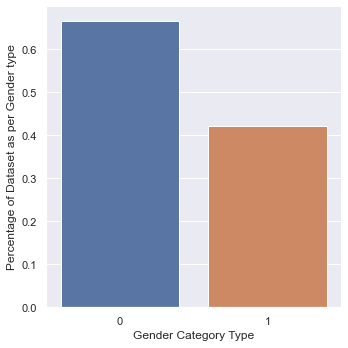

In [69]:
# Set Variable Types
Liver['Gender'] = Liver['Gender'].astype('category')
Liver['Dataset'] = to_numeric(Liver['Dataset'])

factorplot(x="Gender", y="Dataset", data=Liver, kind="bar", ci=None)
xlabel('Gender Category Type')
ylabel('Percentage of Dataset as per Gender type')

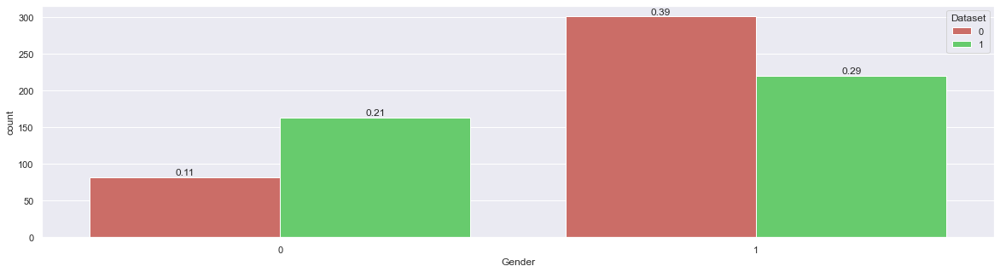

In [70]:
# % of Survived & Not Survived as per each factor of "Gender" Categorical feature
set(style="darkgrid")
set_palette("hls",3) #3 is no of Colours
fig, ax = subplots(figsize=(20,5))
ax = countplot(x="Gender", hue="Dataset", data=Liver)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., # 2 indicates centre % placement on bar top
            height + 3, # 3 indicates % placement distance from the Bar Top
            '{:1.2f}'.format(height/Liver.shape[0]),
            ha="center")

In [71]:
# Adjusted Bonferroni P-Value=0.05/3, 3 is number of Pairs
# The goal is to examine the P-Value for each of the Paired Comparisons and to use the Adjusted Bonferroni P-Value=0.017
# To evaluate significance
# Chi-square Post-hoc is best applicable when Chi-square table is Larger than 2x2
ObsTable=crosstab(Liver['Dataset'],Liver['Gender'])
chiVal, pVal, df, ExpTable = chi2_contingency(ObsTable)
colTotals = ObsTable.sum()
nCols = len(colTotals)
print(nCols, colTotals)

rowTotals = ObsTable.sum(axis=1)
nRows = len(rowTotals)
print(nRows, rowTotals)

n = sum(rowTotals)

phRes = DataFrame(columns=['Dataset', 'Gender', 'Adj. Res.'])
for i in range(nRows):
    for j in range(nCols):
        AdjRes = (ObsTable.iloc[i,j] - ExpTable[i,j]) / (ExpTable[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
        phRes = phRes.append({'Dataset':ObsTable.index[i], 'Gender':ObsTable.columns[j], 'Adj. Res.':AdjRes}, ignore_index=True)
phRes
#These adjusted residuals are so-called z-values. So we can convert them to corresponding probabilities (p-values / sig.) using the standard normal distribution.
#For this we can use the 'norm.cdf' function from scipy.stats, so lets import that:
#The significance can then be added using:
phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
phRes
#However, since we are doing multiple testing, we would have to adjust our found p-values.
#I'll use the Bonferroni correction, which simply multiplies the found p-value by the number of tests performed:
phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
phRes
#Ai, it worked but now some of our adj. sig. are above 1, which is in theory impossible.
#So lets replace those with a 1:
phRes.loc[phRes['Adj. Sig.']> 1, 'Adj. Sig.'] = 1
phRes

2 Gender
0    245
1    521
dtype: int64
2 Dataset
0    383
1    383
dtype: int64


,Dataset,Gender,Adj. Res.,Sig.,Adj. Sig.
0,0.0,0.0,-6.274765,3.501617e-10,1.400647e-09
1,0.0,1.0,6.274765,3.501617e-10,1.400647e-09
2,1.0,0.0,6.274765,3.501617e-10,1.400647e-09
3,1.0,1.0,-6.274765,3.501617e-10,1.400647e-09


Adjusted Bonferroni P-Value=0.05/4=0.0125, Check for Adj. Sig. < 0.0125

# Exploratory Data Analysis (EDA)

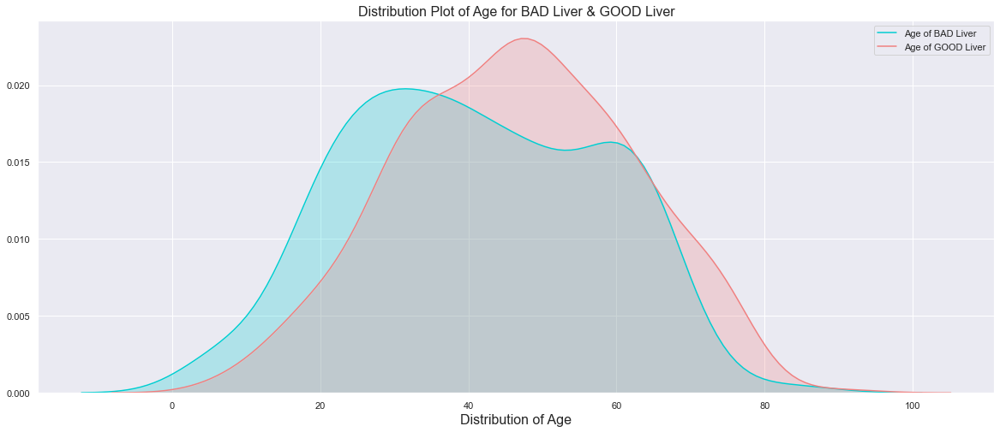

In [72]:
# See the Distribution of "Age" as per the two factors of "Dataset" categorical feature
# kdeplot means kernel density plot
fig, ax = subplots(figsize=(20,8))
ax = kdeplot(Liver["Age"][Liver.Dataset == 1], color="darkturquoise", shade=True)
kdeplot(Liver["Age"][Liver.Dataset == 0], color="lightcoral", shade=True)
legend(['Age of BAD Liver', 'Age of GOOD Liver'])
title('Distribution Plot of Age for BAD Liver & GOOD Liver', fontsize=16)
ax.set_xlabel('Distribution of Age', fontsize=16)
show()

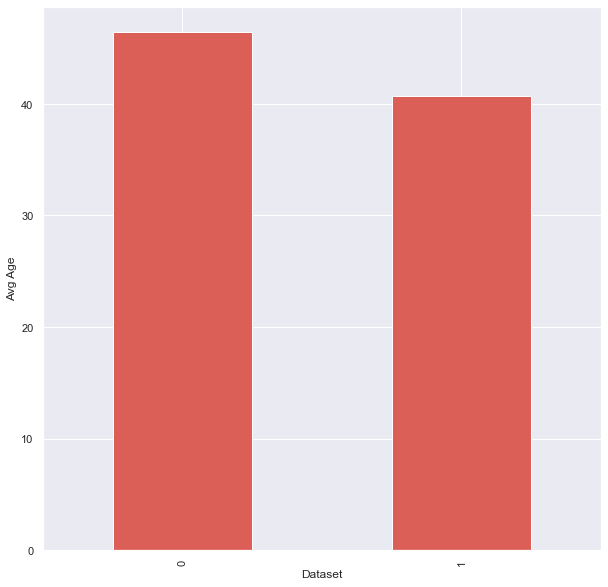

In [73]:
#Measures of Association between Liver "Age" & Liver "Dataset"
#Let's see the average Age of Patients in each category of "dataset" Target Variable
#groupby() will be applied to "Dataset" & mean() will be applied to "Age" as per gropby() of "Dataset"
Liver[['Dataset','Age']].groupby("Dataset").mean().plot(kind='bar',legend = False).set(xlabel='Dataset', ylabel='Avg Age')
xticks(rotation = 90) # 90 degree Vertical alignment of "Dataset" category names
show()
#There is No significant impact of Liver "Dataset" change with respect to Liver "Age" feature
#So Liver "Dataset" is not Liver "Age" feature sensitive

<AxesSubplot:title={'center':'Age'}, xlabel='Dataset'>

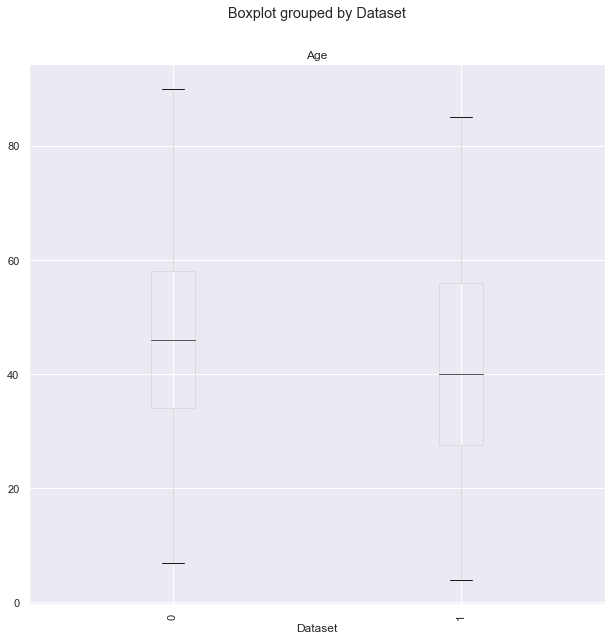

In [74]:
#Lets see the Boxplot of Liver "Age" grouped by Liver "Dataset" target variable
Liver.boxplot("Age",by="Dataset",rot=90)

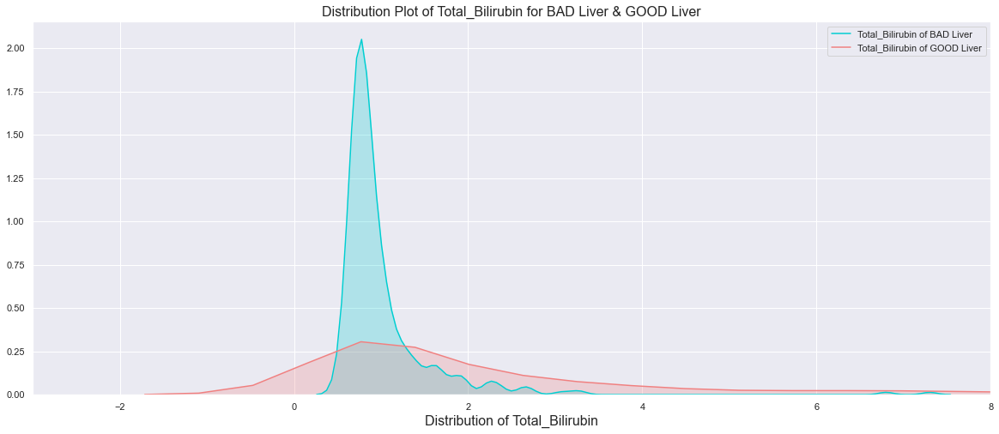

In [75]:
# See the Distribution of "Total_Bilirubin" as per the two factors of "Dataset" categorical feature
# kdeplot means kernel density plot
fig, ax = subplots(figsize=(20,8))
ax = kdeplot(Liver["Total_Bilirubin"][Liver.Dataset == 1], color="darkturquoise", shade=True)
kdeplot(Liver["Total_Bilirubin"][Liver.Dataset == 0], color="lightcoral", shade=True)
legend(['Total_Bilirubin of BAD Liver', 'Total_Bilirubin of GOOD Liver'])
title('Distribution Plot of Total_Bilirubin for BAD Liver & GOOD Liver', fontsize=16)
ax.set_xlabel('Distribution of Total_Bilirubin', fontsize=16)
xlim(-3,8)
show()

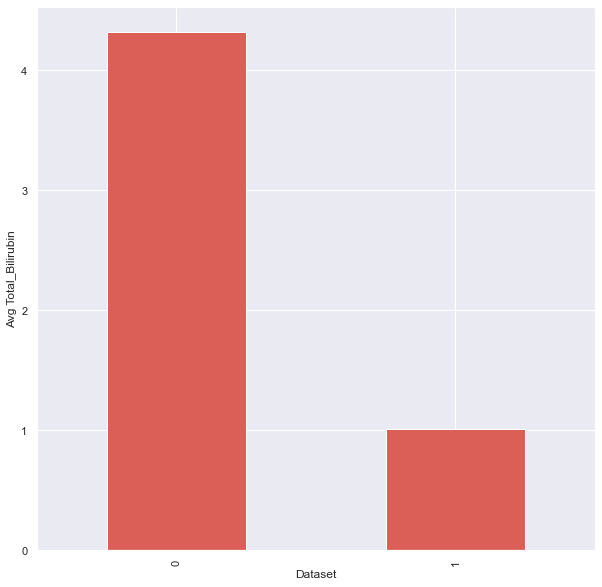

In [76]:
#Measures of Association between Liver "Total_Bilirubin" & Liver "Dataset"
#Let's see the average Total_Bilirubin of Patients in each category of "Dataset" feature
#groupby() will be applied to "Dataset" & mean() will be applied to "Total_Bilirubin" as per gropby() of "Dataset"
Liver[['Dataset','Total_Bilirubin']].groupby("Dataset").mean().plot(kind='bar',legend = False).set(xlabel='Dataset', ylabel='Avg Total_Bilirubin')
xticks(rotation = 90) # 90 degree Vertical alignment of "Dataset" category names
show()
#There is significant impact of Liver "Dataset" changed with respect to Liver "Total_Bilirubin" feature
#So Liver "Dataset" is Liver "Total_Bilirubin" feature sensitive

<AxesSubplot:title={'center':'Total_Bilirubin'}, xlabel='Dataset'>

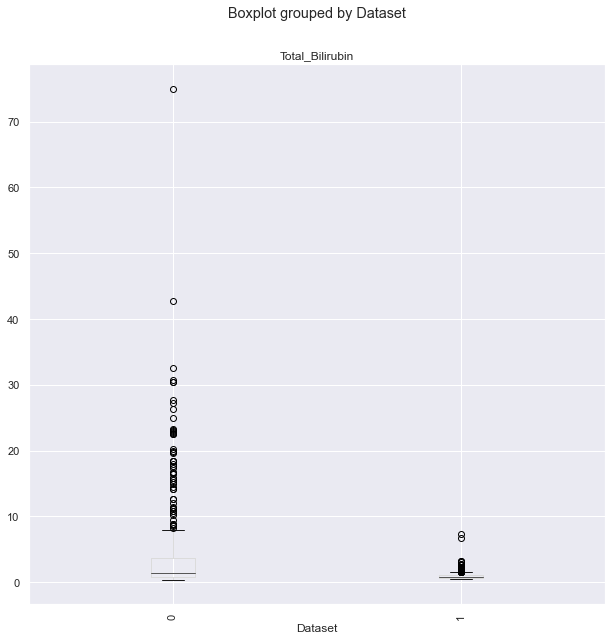

In [77]:
#Lets see the Boxplot of Liver "Total_Bilirubin" grouped by "Dataset" feature
Liver.boxplot("Total_Bilirubin",by="Dataset",rot=90)

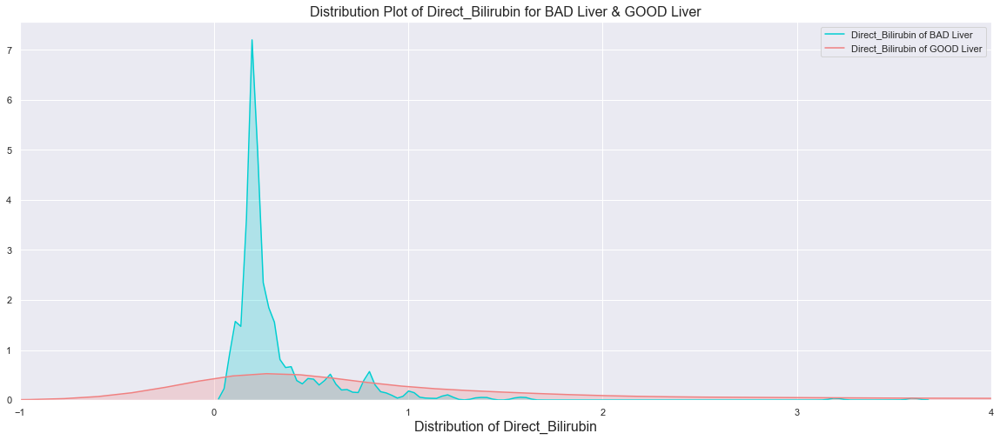

In [78]:
# See the Distribution of "Direct_Bilirubin" as per the two factors of "Dataset" categorical feature
# kdeplot means kernel density plot
fig, ax = subplots(figsize=(20,8))
ax = kdeplot(Liver["Direct_Bilirubin"][Liver.Dataset == 1], color="darkturquoise", shade=True)
kdeplot(Liver["Direct_Bilirubin"][Liver.Dataset == 0], color="lightcoral", shade=True)
legend(['Direct_Bilirubin of BAD Liver', 'Direct_Bilirubin of GOOD Liver'])
title('Distribution Plot of Direct_Bilirubin for BAD Liver & GOOD Liver', fontsize=16)
ax.set_xlabel('Distribution of Direct_Bilirubin', fontsize=16)
xlim(-1,4)
show()

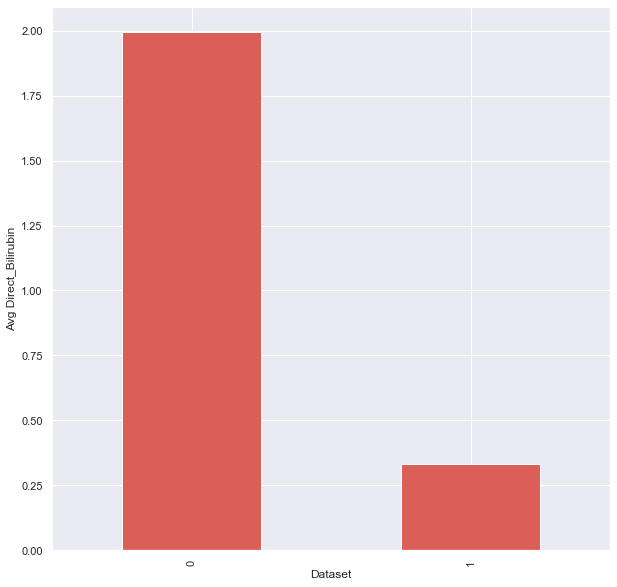

In [79]:
#Measures of Association between Liver "Direct_Bilirubin" & Liver "Dataset"
#Let's see the average Age of Passengers in each category of "Dataset" feature
#groupby() will be applied to "Dataset" & mean() will be applied to "Direct_Bilirubin" as per gropby() of "Dataset"
Liver[['Dataset','Direct_Bilirubin']].groupby("Dataset").mean().plot(kind='bar',legend = False).set(xlabel='Dataset', ylabel='Avg Direct_Bilirubin')
xticks(rotation = 90) # 90 degree Vertical alignment of "Dataset" category names
show()
#There is significant impact of Liver "Dataset" change with respect to Liver "Direct_Bilirubin" feature
#So Liver "Dataset" is Liver "Direct_Bilirubin" feature sensitive

<AxesSubplot:title={'center':'Direct_Bilirubin'}, xlabel='Dataset'>

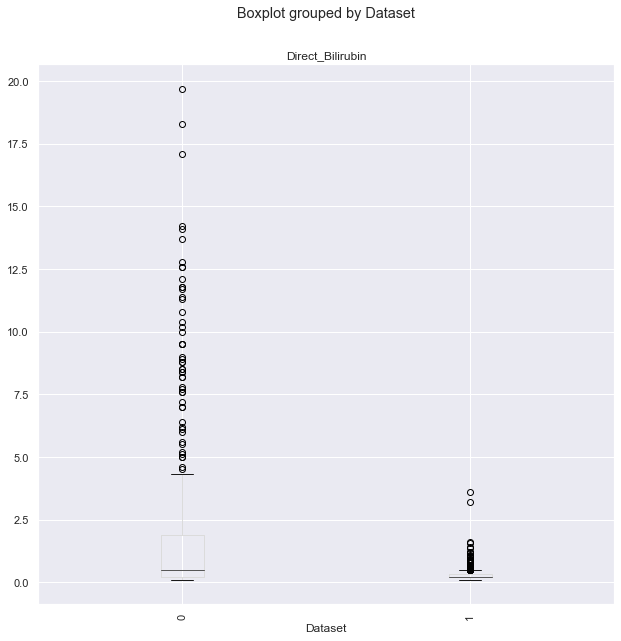

In [80]:
#Lets see the Boxplot of Liver "Direct_Bilirubin" grouped by Liver "Dataset" Target Variable
Liver.boxplot("Direct_Bilirubin",by="Dataset",rot=90)

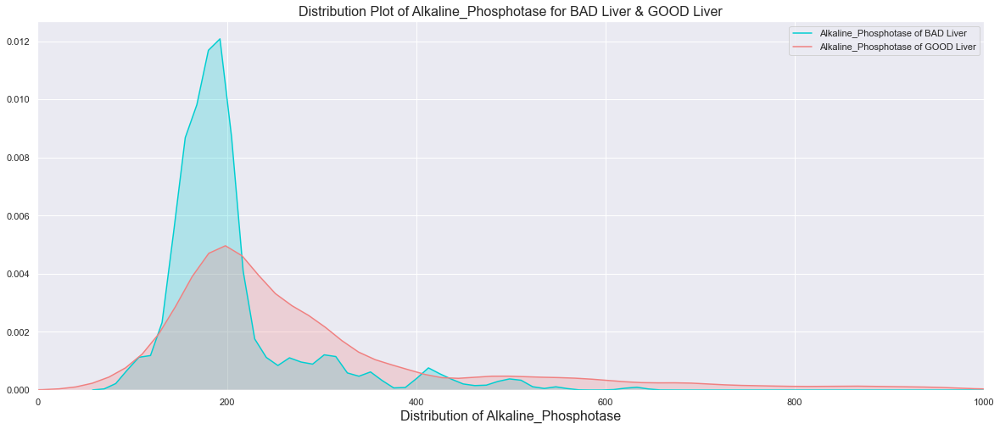

In [81]:
# See the Distribution of "Alkaline_Phosphotase" as per the two factors of "Dataset" categorical feature
# kdeplot means kernel density plot
fig, ax = subplots(figsize=(20,8))
ax = kdeplot(Liver["Alkaline_Phosphotase"][Liver.Dataset == 1], color="darkturquoise", shade=True)
kdeplot(Liver["Alkaline_Phosphotase"][Liver.Dataset == 0], color="lightcoral", shade=True)
legend(['Alkaline_Phosphotase of BAD Liver', 'Alkaline_Phosphotase of GOOD Liver'])
title('Distribution Plot of Alkaline_Phosphotase for BAD Liver & GOOD Liver', fontsize=16)
ax.set_xlabel('Distribution of Alkaline_Phosphotase', fontsize=16)
xlim(0,1000)
show()

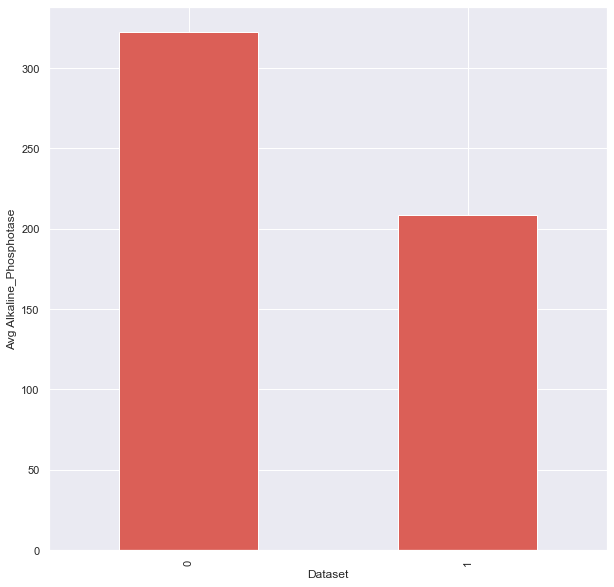

In [82]:
#Measures of Association between Liver "Alkaline_Phosphotase" & Liver "Dataset"
#Let's see the average Alkaline_Phosphotase of Patients in each category of "Dataset" Target Variable
#groupby() will be applied to "Dataset" & mean() will be applied to "Alkaline_Phosphotase" as per gropby() of "Dataset"
Liver[['Dataset','Alkaline_Phosphotase']].groupby("Dataset").mean().plot(kind='bar',legend = False).set(xlabel='Dataset', ylabel='Avg Alkaline_Phosphotase')
xticks(rotation = 90) # 90 degree Vertical alignment of "Survived" category names
show()
#There is significant impact of Liver "Dataset" change with respect to Liver "Dataset" feature
#So Liver "Dataset" is Liver "Alkaline_Phosphotase" feature sensitive

<AxesSubplot:title={'center':'Alkaline_Phosphotase'}, xlabel='Dataset'>

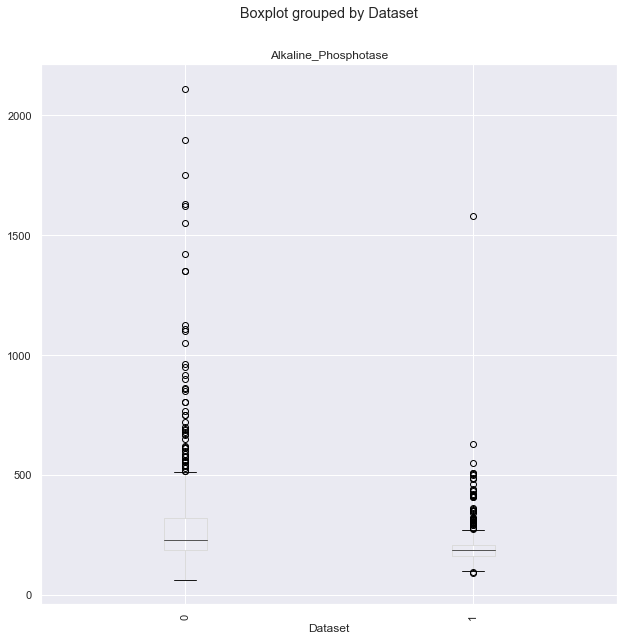

In [83]:
#Lets see the Boxplot of Liver "Alkaline_Phosphotase" grouped by "Dataset" Target Variable
Liver.boxplot("Alkaline_Phosphotase",by="Dataset",rot=90)

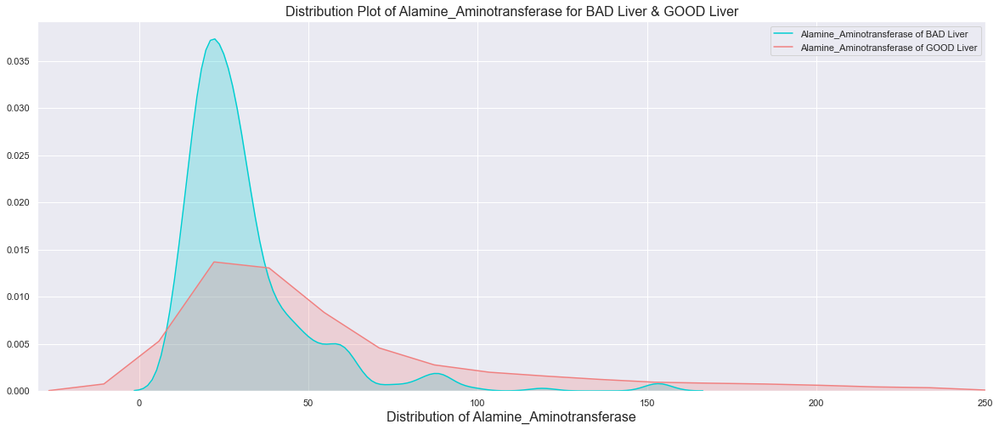

In [84]:
# See the Distribution of "Alamine_Aminotransferase" as per the two factors of "Dataset" categorical feature
# kdeplot means kernel density plot
fig, ax = subplots(figsize=(20,8))
ax = kdeplot(Liver["Alamine_Aminotransferase"][Liver.Dataset == 1], color="darkturquoise", shade=True)
kdeplot(Liver["Alamine_Aminotransferase"][Liver.Dataset == 0], color="lightcoral", shade=True)
legend(['Alamine_Aminotransferase of BAD Liver', 'Alamine_Aminotransferase of GOOD Liver'])
title('Distribution Plot of Alamine_Aminotransferase for BAD Liver & GOOD Liver', fontsize=16)
ax.set_xlabel('Distribution of Alamine_Aminotransferase', fontsize=16)
xlim(-30,250)
show()

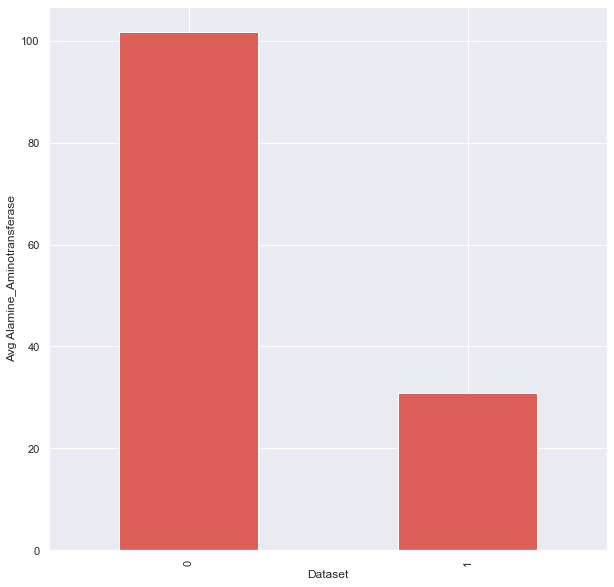

In [85]:
#Measures of Association between Liver "Alamine_Aminotransferase" & Liver "Dataset" Target Variable
#Let's see the average Alamine_Aminotransferase of Patients in each category of "Dataset" feature
#groupby() will be applied to "Dataset" & mean() will be applied to "Alamine_Aminotransferase" as per gropby() of "Dataset"
Liver[['Dataset','Alamine_Aminotransferase']].groupby("Dataset").mean().plot(kind='bar',legend = False).set(xlabel='Dataset', ylabel='Avg Alamine_Aminotransferase')
xticks(rotation = 90) # 90 degree Vertical alignment of "Dataset" category names
show()
#There is significant impact of Liver "Dataset" change with respect to Liver "Alamine_Aminotransferase" feature
#So Liver "Dataset" is Liver "Alamine_Aminotransferase" feature sensitive

<AxesSubplot:title={'center':'Alamine_Aminotransferase'}, xlabel='Dataset'>

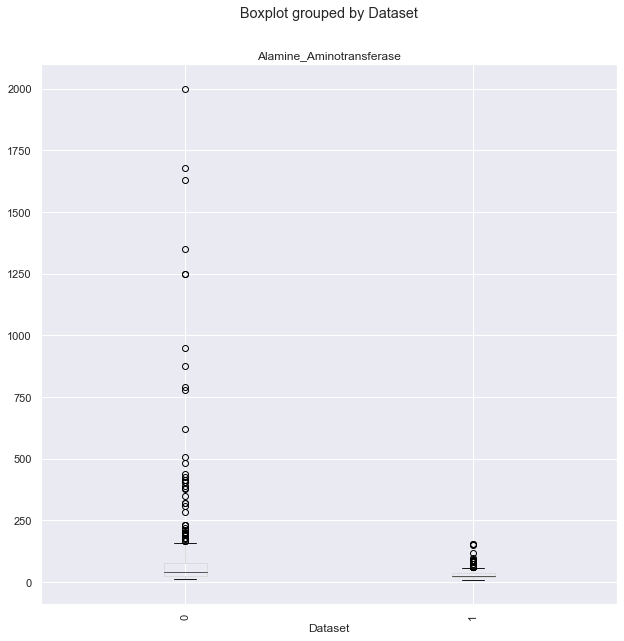

In [86]:
#Lets see the Boxplot of Liver "Alamine_Aminotransferase" grouped by "Dataset" feature
Liver.boxplot("Alamine_Aminotransferase",by="Dataset",rot=90)

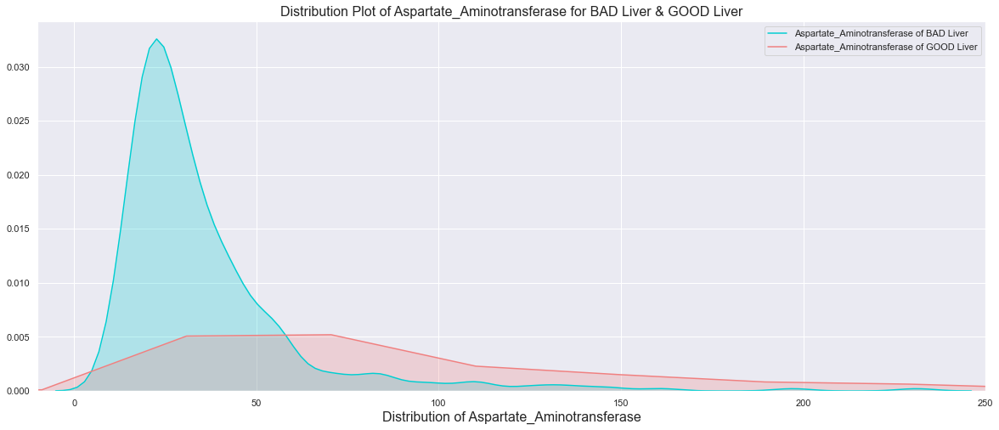

In [87]:
# See the Distribution of "Aspartate_Aminotransferase" as per the two factors of "Dataset" categorical feature
# kdeplot means kernel density plot
fig, ax = subplots(figsize=(20,8))
ax = kdeplot(Liver["Aspartate_Aminotransferase"][Liver.Dataset == 1], color="darkturquoise", shade=True)
kdeplot(Liver["Aspartate_Aminotransferase"][Liver.Dataset == 0], color="lightcoral", shade=True)
legend(['Aspartate_Aminotransferase of BAD Liver', 'Aspartate_Aminotransferase of GOOD Liver'])
title('Distribution Plot of Aspartate_Aminotransferase for BAD Liver & GOOD Liver', fontsize=16)
ax.set_xlabel('Distribution of Aspartate_Aminotransferase', fontsize=16)
xlim(-10,250)
show()

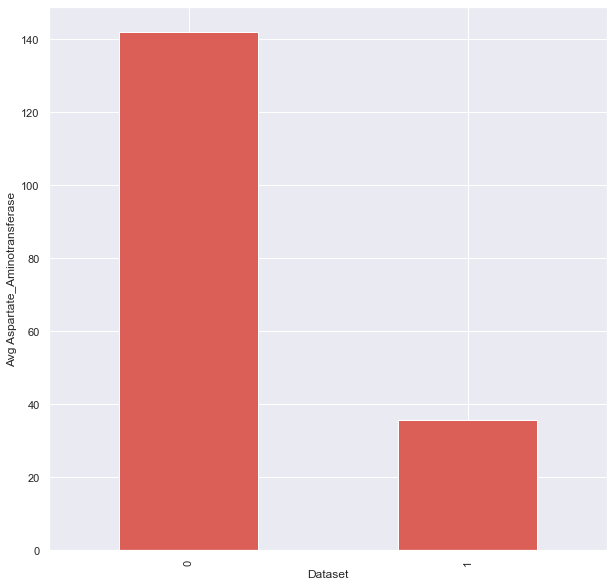

In [88]:
#Measures of Association between Liver "Aspartate_Aminotransferase" & Liver "Dataset"
#Let's see the average Aspartate_Aminotransferase of Patients in each category of "Dataset" feature
#groupby() will be applied to "Dataset" & mean() will be applied to "Aspartate_Aminotransferase" as per gropby() of "Dataset"
Liver[['Dataset','Aspartate_Aminotransferase']].groupby("Dataset").mean().plot(kind='bar',legend = False).set(xlabel='Dataset', ylabel='Avg Aspartate_Aminotransferase')
xticks(rotation = 90) # 90 degree Vertical alignment of "Dataset" category names
show()
#There is significant impact of Liver "Aspartate_Aminotransferase" change with respect to Liver "Dataset" Target Variable
#So Liver "Dataset" is Liver "Aspartate_Aminotransferase" feature sensitive

<AxesSubplot:title={'center':'Aspartate_Aminotransferase'}, xlabel='Dataset'>

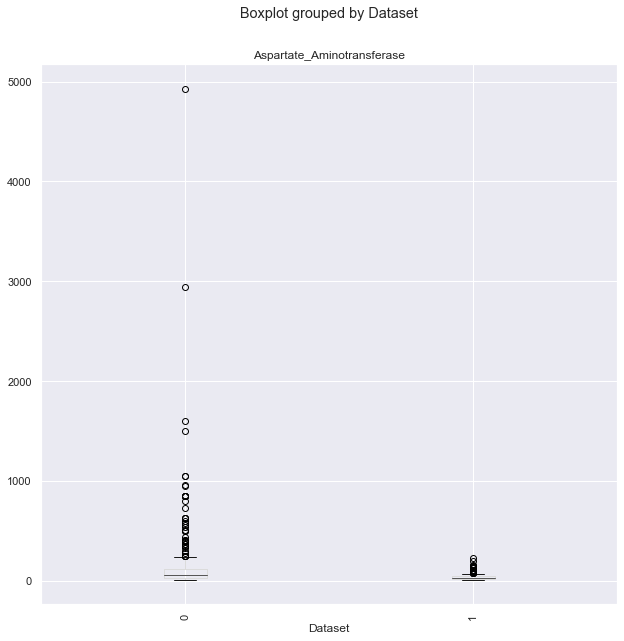

In [89]:
#Lets see the Boxplot of Liver "Aspartate_Aminotransferase" grouped by "Dataset" feature
Liver.boxplot("Aspartate_Aminotransferase",by="Dataset",rot=90)

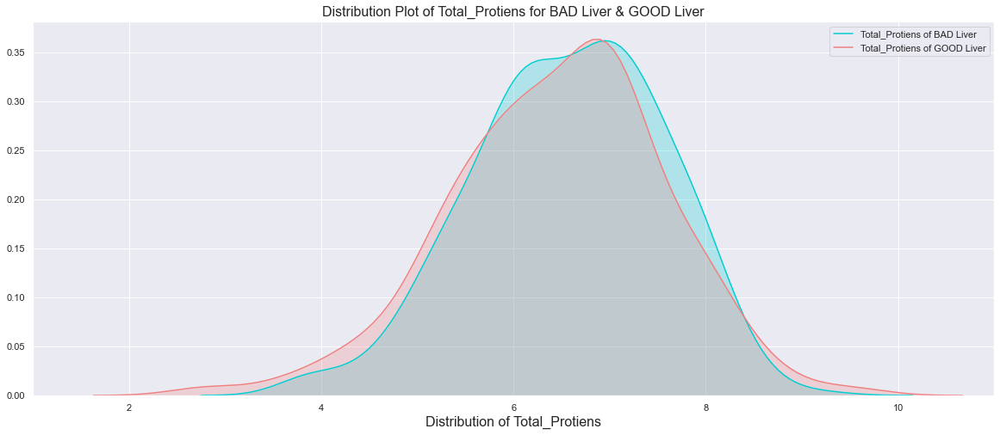

In [90]:
# See the Distribution of "Total_Protiens" as per the two factors of "Dataset" categorical feature
# kdeplot means kernel density plot
fig, ax = subplots(figsize=(20,8))
ax = kdeplot(Liver["Total_Protiens"][Liver.Dataset == 1], color="darkturquoise", shade=True)
kdeplot(Liver["Total_Protiens"][Liver.Dataset == 0], color="lightcoral", shade=True)
legend(['Total_Protiens of BAD Liver', 'Total_Protiens of GOOD Liver'])
title('Distribution Plot of Total_Protiens for BAD Liver & GOOD Liver', fontsize=16)
ax.set_xlabel('Distribution of Total_Protiens', fontsize=16)
xlim(1,11)
show()

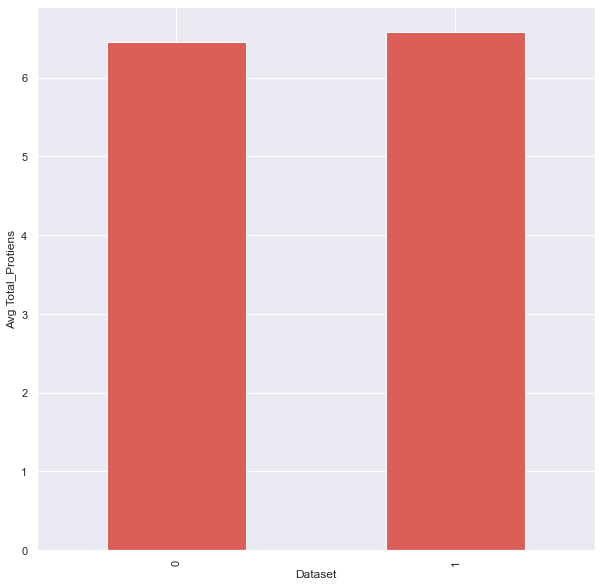

In [91]:
#Measures of Association between Liver "Total_Protiens" & Liver "Dataset"
#Let's see the average 'Total_Protiens' of Patients in each category of "Dataset" feature
#groupby() will be applied to "Dataset" & mean() will be applied to "Total_Protiens" as per gropby() of "Dataset"
Liver[['Dataset','Total_Protiens']].groupby("Dataset").mean().plot(kind='bar',legend = False).set(xlabel='Dataset', ylabel='Avg Total_Protiens')
xticks(rotation = 90) # 90 degree Vertical alignment of "Dataset" category names
show()
#There is No significant impact of Liver "Total_Protiens" change with respect to Liver "Dataset" feature
#So Liver "Dataset" is not Liver "Total_Protiens" feature sensitive

We will Remove 'Total_Protiens' Feature from the Liver Data

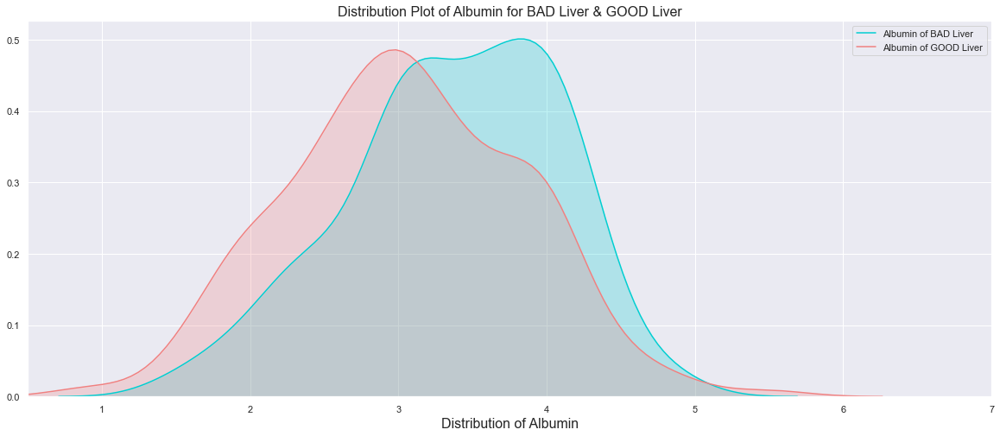

In [92]:
# See the Distribution of "Albumin" as per the two factors of "Dataset" categorical feature
# kdeplot means kernel density plot
fig, ax = subplots(figsize=(20,8))
ax = kdeplot(Liver["Albumin"][Liver.Dataset == 1], color="darkturquoise", shade=True)
kdeplot(Liver["Albumin"][Liver.Dataset == 0], color="lightcoral", shade=True)
legend(['Albumin of BAD Liver', 'Albumin of GOOD Liver'])
title('Distribution Plot of Albumin for BAD Liver & GOOD Liver', fontsize=16)
ax.set_xlabel('Distribution of Albumin', fontsize=16)
xlim(0.5,7)
show()

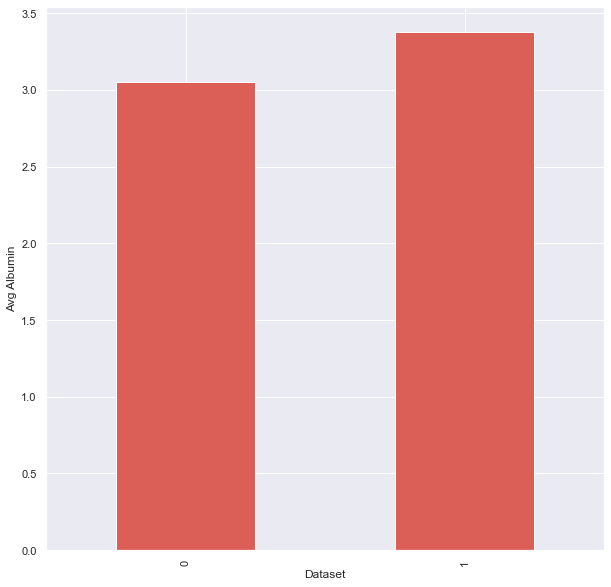

In [93]:
#Measures of Association between Liver "Albumin" & Liver "Dataset"
#Let's see the average 'Albumin' of Patients in each category of "Dataset" feature
#groupby() will be applied to "Dataset" & mean() will be applied to "Albumin" as per gropby() of "Dataset"
Liver[['Dataset','Albumin']].groupby("Dataset").mean().plot(kind='bar',legend = False).set(xlabel='Dataset', ylabel='Avg Albumin')
xticks(rotation = 90) # 90 degree Vertical alignment of "Survived" category names
show()
#There is No significant impact of Liver "Albumin" change with respect to Liver "Dataset" feature
#So Liver "Dataset" is not Liver "Albumin" feature sensitive

<AxesSubplot:title={'center':'Albumin'}, xlabel='Dataset'>

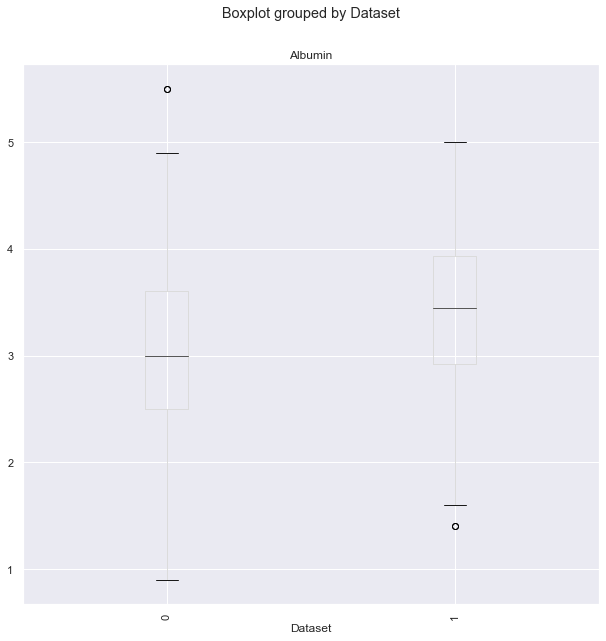

In [94]:
#Lets see the Boxplot of Liver "Albumin" grouped by "Dataset" feature
Liver.boxplot("Albumin",by="Dataset",rot=90)

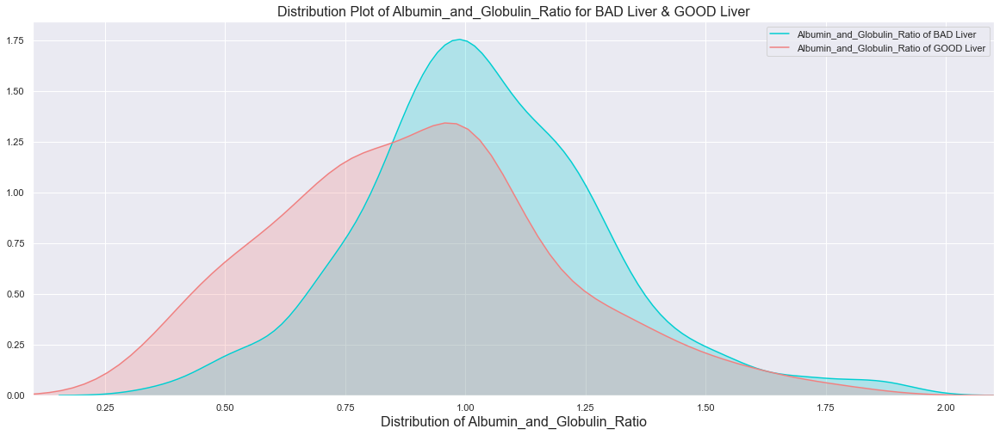

In [95]:
# See the Distribution of "Albumin_and_Globulin_Ratio" as per the two factors of "Dataset" categorical feature
# kdeplot means kernel density plot
fig, ax = subplots(figsize=(20,8))
ax = kdeplot(Liver["Albumin_and_Globulin_Ratio"][Liver.Dataset == 1], color="darkturquoise", shade=True)
kdeplot(Liver["Albumin_and_Globulin_Ratio"][Liver.Dataset == 0], color="lightcoral", shade=True)
legend(['Albumin_and_Globulin_Ratio of BAD Liver', 'Albumin_and_Globulin_Ratio of GOOD Liver'])
title('Distribution Plot of Albumin_and_Globulin_Ratio for BAD Liver & GOOD Liver', fontsize=16)
ax.set_xlabel('Distribution of Albumin_and_Globulin_Ratio', fontsize=16)
xlim(0.10,2.1)
show()

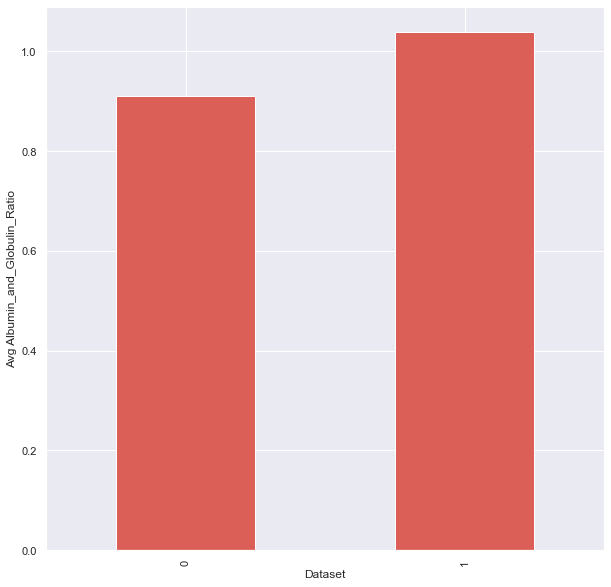

In [96]:
#Measures of Association between Liver "Albumin_and_Globulin_Ratio" & Liver "Dataset"
#Let's see the average Albumin_and_Globulin_Ratio of Patients in each category of "Dataset" feature
#groupby() will be applied to "Dataset" & mean() will be applied to "Albumin_and_Globulin_Ratio" as per gropby() of "Dataset"
Liver[['Dataset','Albumin_and_Globulin_Ratio']].groupby("Dataset").mean().plot(kind='bar',legend = False).set(xlabel='Dataset', ylabel='Avg Albumin_and_Globulin_Ratio')
xticks(rotation = 90) # 90 degree Vertical alignment of "Dataset" category names
show()
#There is No significant impact of Liver "Dataset" change with respect to Liver "Albumin_and_Globulin_Ratio" feature
#So Liver "Albumin_and_Globulin_Ratio" is not Liver "Dataset" feature sensitive

<AxesSubplot:title={'center':'Albumin_and_Globulin_Ratio'}, xlabel='Dataset'>

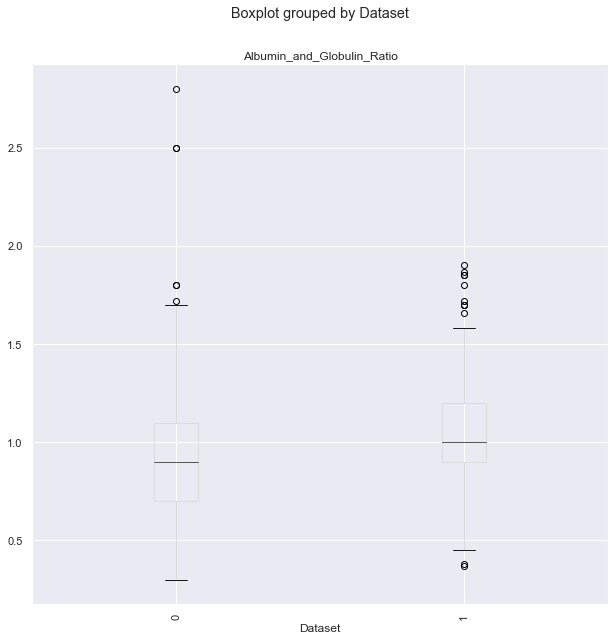

In [97]:
#Lets see the Boxplot of Liver "Albumin_and_Globulin_Ratio" grouped by "Dataset" feature
Liver.boxplot("Albumin_and_Globulin_Ratio",by="Dataset",rot=90)

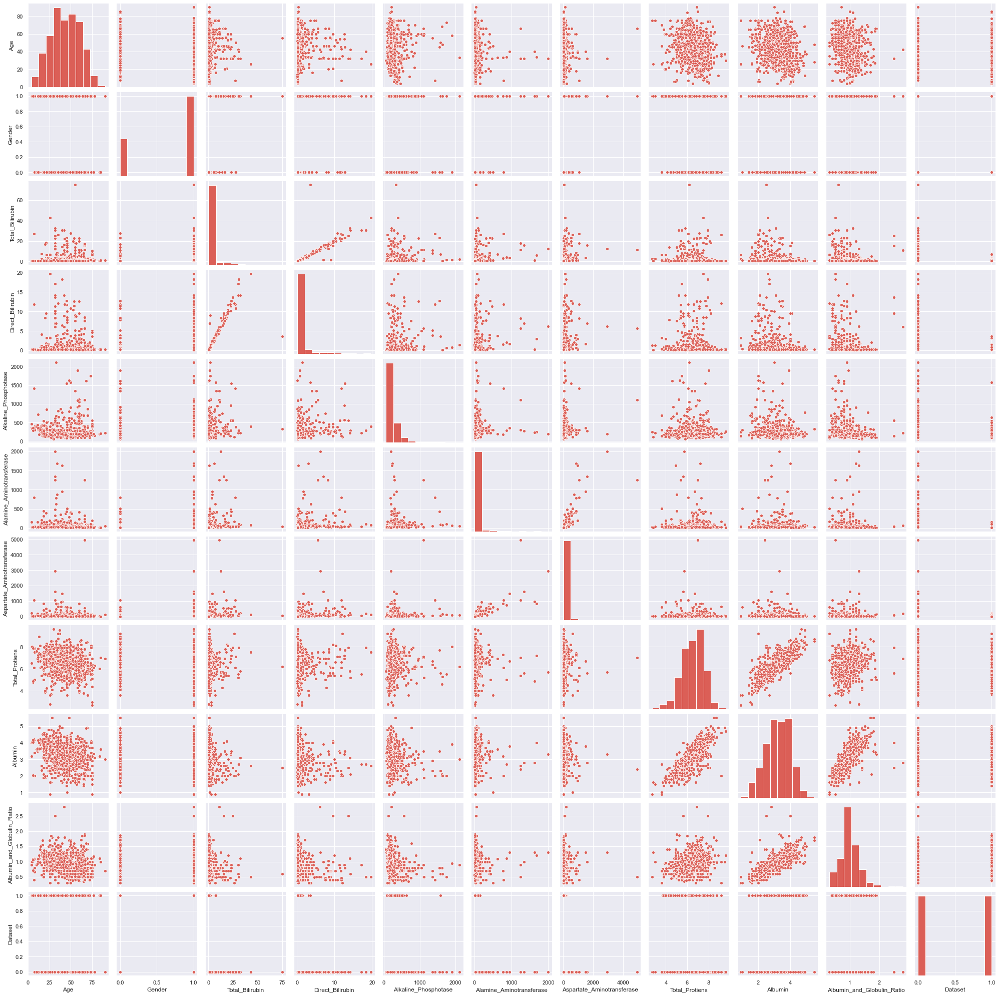

In [98]:
# See the pair plot of Liver DataFrame
# To plot multiple pairwise bivariate distributions in a dataset, you can use the pairplot() function.
# This creates a matrix of axes and shows the relationship for each pair of columns in a DataFrame.
# By default, it also draws the univariate distribution of each variable on the diagonal Axes:
pairplot(Liver)
show()

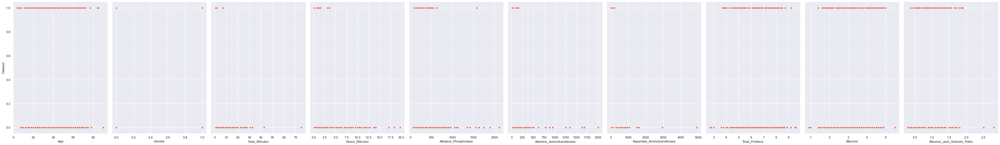

In [99]:
# Visualise the relationship between Each Feature & Label Combination Using Scatterplots
pairplot(Liver, x_vars=['Age','Gender','Total_Bilirubin','Direct_Bilirubin','Alkaline_Phosphotase','Alamine_Aminotransferase','Aspartate_Aminotransferase','Total_Protiens','Albumin','Albumin_and_Globulin_Ratio'], y_vars='Dataset',height=7, aspect=0.7, kind='scatter')
show()

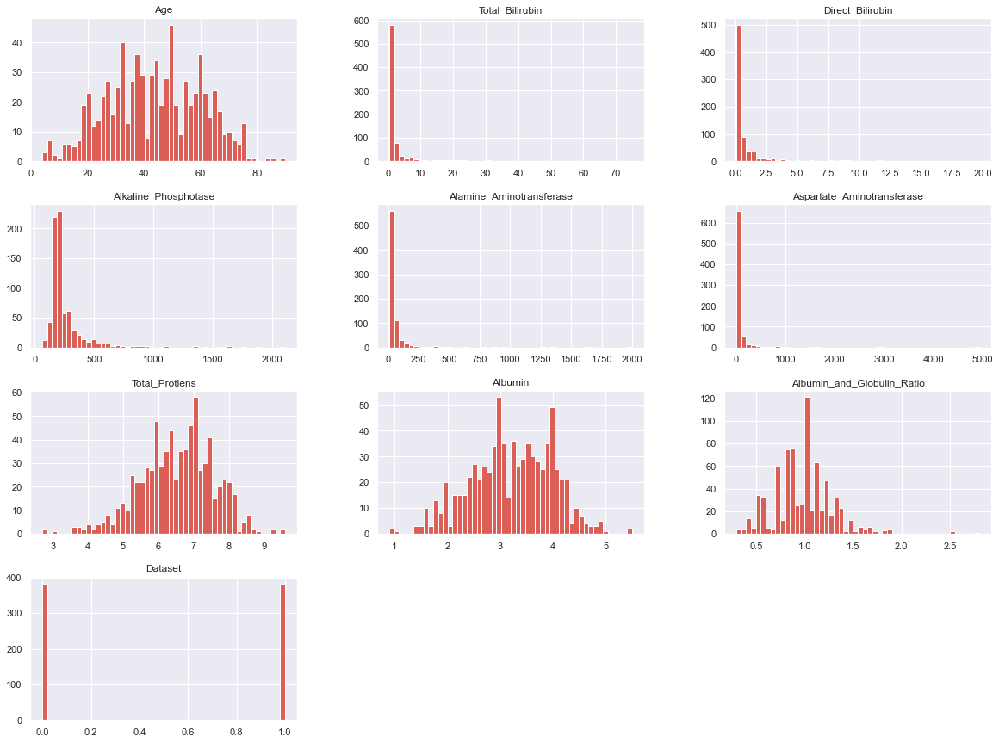

In [100]:
# See the histogram plot of Liver DataFrame
# Univariate Distribution of Each Variable
Liver.hist(bins=50, figsize=(20, 15))
show()

D:\D Program Files\Anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


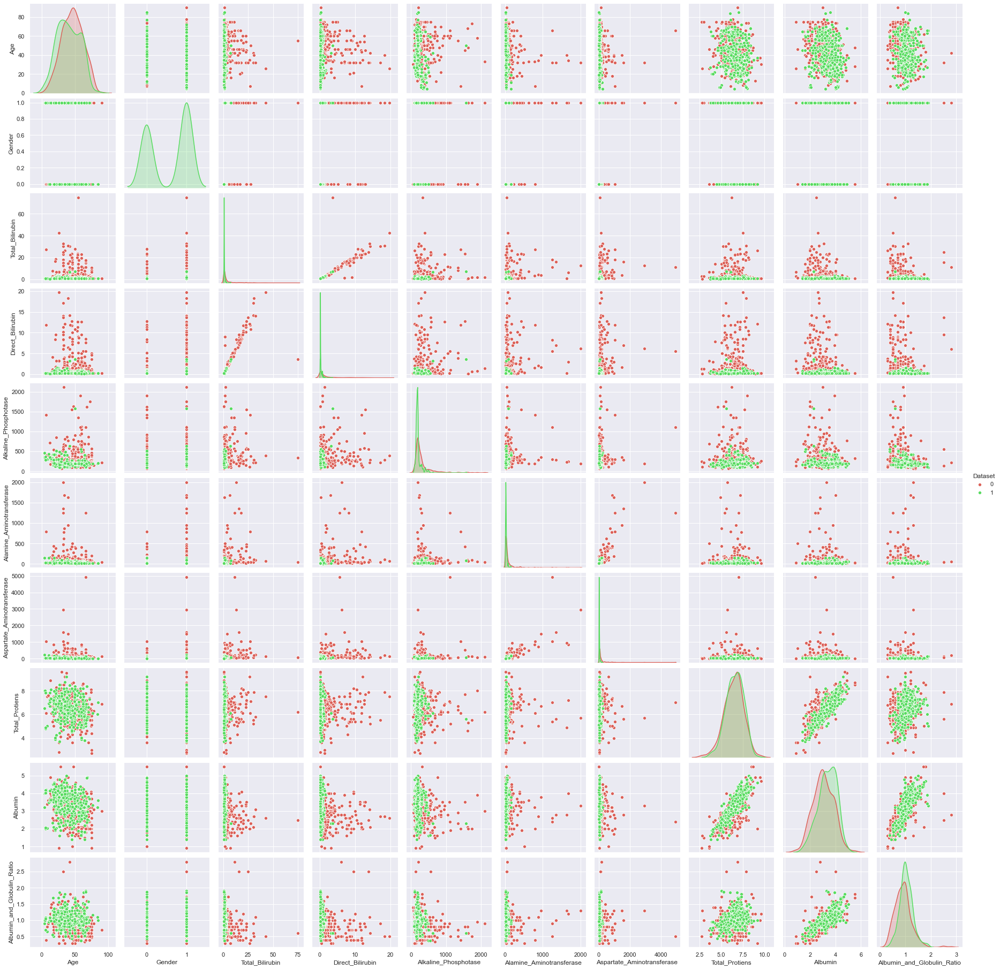

In [101]:
pairplot(Liver,hue='Dataset');
show()

In [102]:
# Phi_K is a new and practical correlation coefficient based on several refinements to Pearson’s hypothesis test of independence of two variables.
# The combined features of Phi_K form an advantage over existing coefficients. First, it works consistently between
# categorical, ordinal and interval variables. Second, it captures non-linear dependency. Third, it reverts to the Pearson
# correlation coefficient in case of a bi-variate normal input distribution. These are useful features when studying the
# correlation matrix of variables with mixed types.
# Phi-Correlation plot by using Heatmap
# All Categorical Columns
import phik
from phik import report
# get the phi-K correlation matrix between all variables
Liver.phik_matrix(interval_cols=['Age','Total_Bilirubin','Direct_Bilirubin','Alkaline_Phosphotase','Alamine_Aminotransferase','Aspartate_Aminotransferase','Total_Protiens','Albumin','Albumin_and_Globulin_Ratio'])

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
Age,1.000000,0.204914,0.000000,0.000000,0.381793,0.000000,0.074735,0.357698,0.323393,0.195570,0.316711
Gender,0.204914,1.000000,0.085368,0.163304,0.148203,0.000000,0.000000,0.140415,0.017500,0.091780,0.340404
Total_Bilirubin,0.000000,0.085368,1.000000,0.897009,0.346292,0.346401,0.319249,0.000000,0.106646,0.336233,0.250029
Direct_Bilirubin,0.000000,0.163304,0.897009,1.000000,0.463233,0.382617,0.450104,0.134323,0.153573,0.411807,0.450425
Alkaline_Phosphotase,0.381793,0.148203,0.346292,0.463233,1.000000,0.383024,0.528689,0.000000,0.152625,0.189422,0.390637
Alamine_Aminotransferase,0.000000,0.000000,0.346401,0.382617,0.383024,1.000000,0.864297,0.000000,0.123599,0.000000,0.248443
Aspartate_Aminotransferase,0.074735,0.000000,0.319249,0.450104,0.528689,0.864297,1.000000,0.000000,0.000000,0.030585,0.218002
Total_Protiens,0.357698,0.140415,0.000000,0.134323,0.000000,0.000000,0.000000,1.000000,0.837878,0.209916,0.034989
Albumin,0.323393,0.017500,0.106646,0.153573,0.152625,0.123599,0.000000,0.837878,1.000000,0.614837,0.285603
Albumin_and_Globulin_Ratio,0.195570,0.091780,0.336233,0.411807,0.189422,0.000000,0.030585,0.209916,0.614837,1.000000,0.267470


In [103]:
# get global correlations based on phi_K correlation matrix
Liver.global_phik(interval_cols=['Age','Total_Bilirubin','Direct_Bilirubin','Alkaline_Phosphotase','Alamine_Aminotransferase','Aspartate_Aminotransferase','Total_Protiens','Albumin','Albumin_and_Globulin_Ratio'])

D:\D Program Files\Anaconda\lib\site-packages\phik\phik.py:248: RuntimeWarning: invalid value encountered in sqrt
  global_correlations = np.array([[np.sqrt(1 - 1/(V[i][i] * Vinv[i][i]))] for i in range(V.shape[0])])


(array([[0.50753145],
        [0.24021133],
        [0.91239021],
        [0.88488223],
        [0.59539082],
        [0.92300265],
        [0.93749835],
        [1.13905437],
        [1.12748838],
        [       nan],
        [       nan]]),
 array(['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
        'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
        'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
        'Albumin_and_Globulin_Ratio', 'Dataset'], dtype=object))

In [104]:
# get the significance matrix (expressed as one-sided Z)
# of the hypothesis test of each variable-pair dependency
Liver.significance_matrix(interval_cols=['Age','Total_Bilirubin','Direct_Bilirubin','Alkaline_Phosphotase','Alamine_Aminotransferase','Aspartate_Aminotransferase','Total_Protiens','Albumin','Albumin_and_Globulin_Ratio'])

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
Age,52.646518,2.935776,0.901601,1.701614,5.908370,0.346852,1.012064,4.046046,5.422925,3.850943,5.747608
Gender,2.935776,30.731578,2.157049,2.719723,2.046273,0.538339,0.334470,1.766723,0.048437,1.625263,6.122883
Total_Bilirubin,0.901601,2.157049,22.215718,19.255139,6.557425,5.472475,5.203050,0.765542,3.112940,6.170990,7.876185
Direct_Bilirubin,1.701614,2.719723,19.255139,27.692178,6.774197,6.151804,6.048592,1.037166,2.271742,6.193686,9.785275
Alkaline_Phosphotase,5.908370,2.046273,6.557425,6.774197,34.422790,5.435039,4.242605,-0.198933,2.543936,4.473179,7.646125
Alamine_Aminotransferase,0.346852,0.538339,5.472475,6.151804,5.435039,18.198144,11.875697,1.108073,1.341780,0.875740,5.018452
Aspartate_Aminotransferase,1.012064,0.334470,5.203050,6.048592,4.242605,11.875697,15.349957,1.629733,1.115452,1.216857,4.407763
Total_Protiens,4.046046,1.766723,0.765542,1.037166,-0.198933,1.108073,1.629733,49.254278,23.511648,4.971263,0.394784
Albumin,5.422925,0.048437,3.112940,2.271742,2.543936,1.341780,1.115452,23.511648,50.799979,20.881334,4.942248
Albumin_and_Globulin_Ratio,3.850943,1.625263,6.170990,6.193686,4.473179,0.875740,1.216857,4.971263,20.881334,46.208890,6.476211


D:\D Program Files\Anaconda\lib\site-packages\phik\phik.py:248: RuntimeWarning: invalid value encountered in sqrt
  global_correlations = np.array([[np.sqrt(1 - 1/(V[i][i] * Vinv[i][i]))] for i in range(V.shape[0])])
D:\D Program Files\Anaconda\lib\site-packages\phik\outliers.py:198: RuntimeWarning: invalid value encountered in double_scalars
  logmidp = np.log(0.5) + lp + np.log( 1 + np.exp(lp1-lp) )
D:\D Program Files\Anaconda\lib\site-packages\scipy\stats\_distn_infrastructure.py:2017: RuntimeWarning: invalid value encountered in greater
  cond1 = (0 < q) & (q < 1)
D:\D Program Files\Anaconda\lib\site-packages\scipy\stats\_distn_infrastructure.py:2017: RuntimeWarning: invalid value encountered in less
  cond1 = (0 < q) & (q < 1)


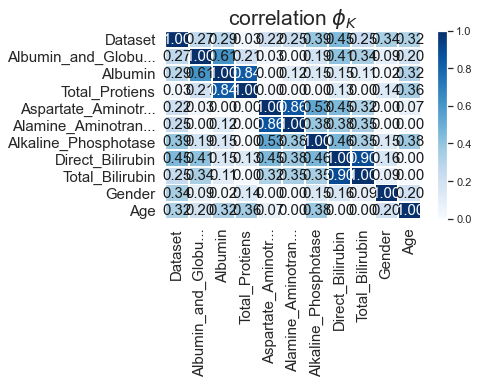

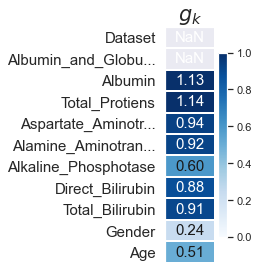

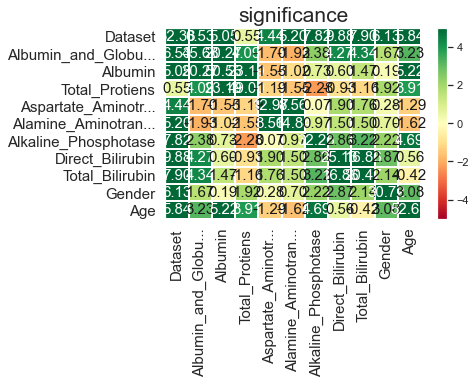

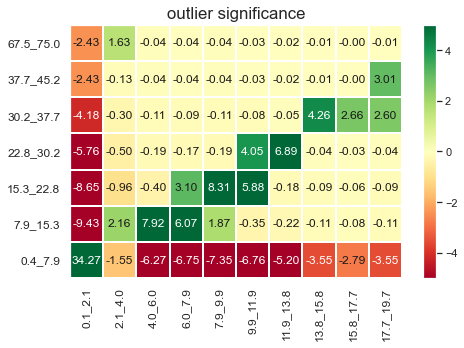

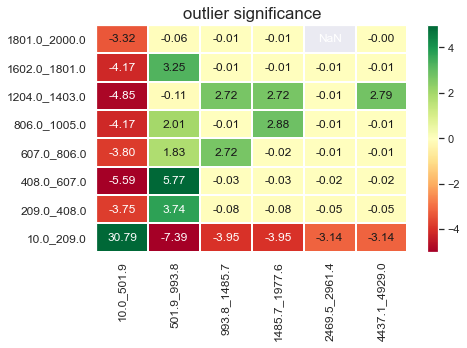

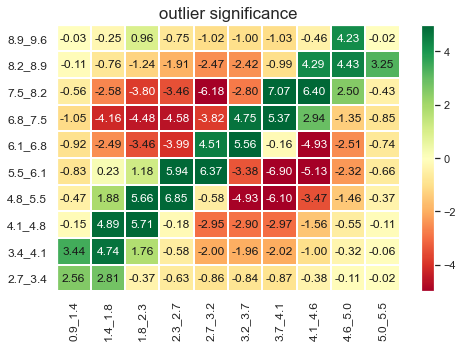

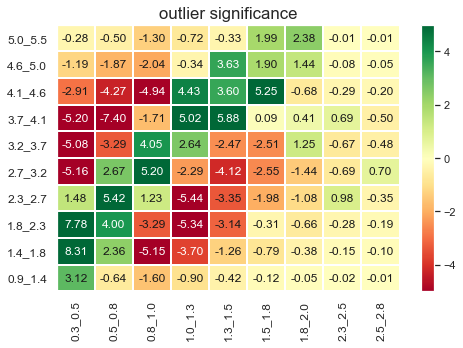

In [105]:
# generate a phik correlation report and save as test.pdf
report.correlation_report(data=Liver,interval_cols=['Age','Total_Bilirubin','Direct_Bilirubin','Alkaline_Phosphotase','Alamine_Aminotransferase','Aspartate_Aminotransferase','Total_Protiens','Albumin','Albumin_and_Globulin_Ratio'])
show()

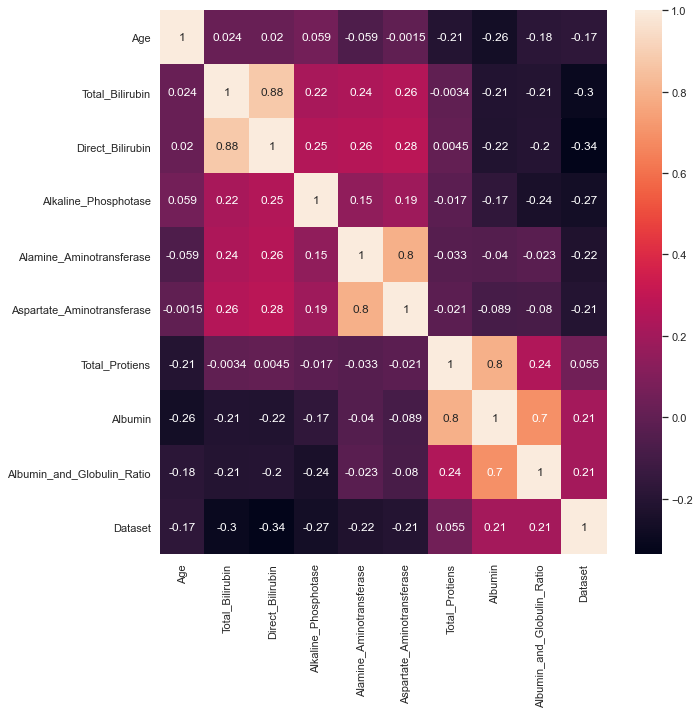

In [106]:
# Correlation plot by using heatmap
figure(figsize=(10,10)) # Assign the Plotting Figure Size of 10 by 10
heatmap(Liver.corr(), annot=True)
show()

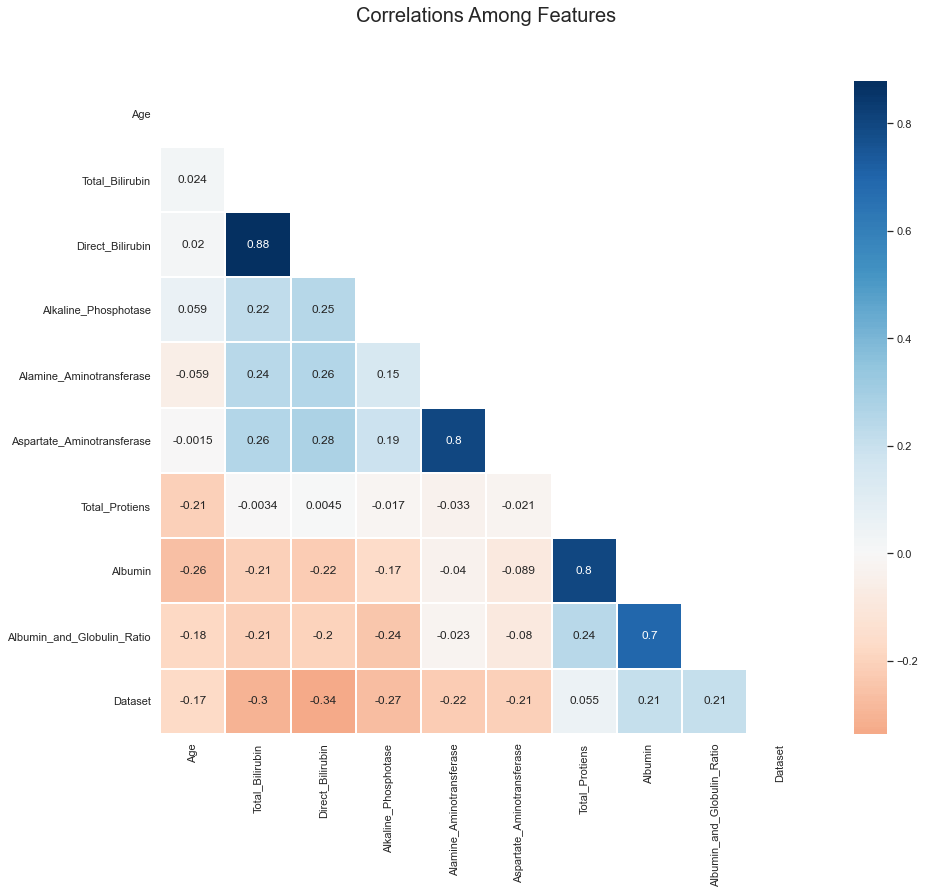

In [107]:
## heatmeap to see the correlation between features.
# Generate a mask for the upper triangle (taken from seaborn example gallery)
mask = zeros_like(Liver.corr(), dtype=bool)
mask[triu_indices_from(mask)] = True
set_style('whitegrid')
subplots(figsize = (15,12))
heatmap(Liver.corr(), 
            annot=True,
            mask = mask,
            cmap = 'RdBu', ## in order to reverse the bar replace "RdBu" with "RdBu_r"
            linewidths=.9, 
            linecolor='white',
            fmt='.2g',
            center = 0,
            square=True)
title("Correlations Among Features", y = 1.03,fontsize = 20, pad = 40);

In [108]:
# Each Pair Combination of Feature & Label Correlation List
Liver.corr().Dataset.sort_values(ascending=False)

Dataset                       1.000000
Albumin_and_Globulin_Ratio    0.211015
Albumin                       0.208695
Total_Protiens                0.054874
Age                          -0.172525
Aspartate_Aminotransferase   -0.209708
Alamine_Aminotransferase     -0.223566
Alkaline_Phosphotase         -0.265023
Total_Bilirubin              -0.301490
Direct_Bilirubin             -0.335369
Name: Dataset, dtype: float64

In [109]:
#Displaying correlation among all the columns
Liver.corr()

,Age,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
Age,1.000000,0.024491,0.020093,0.058749,-0.059456,-0.001544,-0.207747,-0.263198,-0.180284,-0.172525
Total_Bilirubin,0.024491,1.000000,0.877954,0.221740,0.238257,0.256773,-0.003416,-0.211199,-0.205817,-0.301490
Direct_Bilirubin,0.020093,0.877954,1.000000,0.248938,0.260490,0.279078,0.004472,-0.217707,-0.201617,-0.335369
Alkaline_Phosphotase,0.058749,0.221740,0.248938,1.000000,0.149435,0.186577,-0.017452,-0.167369,-0.244255,-0.265023
Alamine_Aminotransferase,-0.059456,0.238257,0.260490,0.149435,1.000000,0.795627,-0.033080,-0.039965,-0.022941,-0.223566
Aspartate_Aminotransferase,-0.001544,0.256773,0.279078,0.186577,0.795627,1.000000,-0.020651,-0.088819,-0.080161,-0.209708
Total_Protiens,-0.207747,-0.003416,0.004472,-0.017452,-0.033080,-0.020651,1.000000,0.795379,0.244934,0.054874
Albumin,-0.263198,-0.211199,-0.217707,-0.167369,-0.039965,-0.088819,0.795379,1.000000,0.695807,0.208695
Albumin_and_Globulin_Ratio,-0.180284,-0.205817,-0.201617,-0.244255,-0.022941,-0.080161,0.244934,0.695807,1.000000,0.211015
Dataset,-0.172525,-0.301490,-0.335369,-0.265023,-0.223566,-0.209708,0.054874,0.208695,0.211015,1.000000


In [110]:
# Each Pair Combination of Feature & Label Correlation List
DataFrame(abs(Liver.corr()['Dataset']).sort_values(ascending = False))

,Dataset
Dataset,1.000000
Direct_Bilirubin,0.335369
Total_Bilirubin,0.301490
Alkaline_Phosphotase,0.265023
Alamine_Aminotransferase,0.223566
Albumin_and_Globulin_Ratio,0.211015
Aspartate_Aminotransferase,0.209708
Albumin,0.208695
Age,0.172525
Total_Protiens,0.054874


In [111]:
Liver.Dataset = Liver.Dataset.astype('category')
Liver.Gender = Liver.Gender.astype('category')

In [112]:
# drop the duplicate rows (inplace=False by default)
Liver.drop_duplicates(keep='first', inplace=True)
Liver.shape

(766, 11)

In [113]:
# Now we will remove these Rows filled with NaN
# If any cell of a Row/Rows having a NaN value then remove that Row/Rows
# Removal will be not original
# .shape will show the remaining no of rows after dropping the NaN rows
Liver.dropna(how="any",inplace=True)
Liver.shape

(766, 11)

In [114]:
#Saving This CAR DataFrame into DataFile folder as Liver_Clean_Balanced.csv file
Liver.to_csv(r'D:\Python Data\Anwesh Python\DataFile\Liver_Clean_Balanced.csv', index=False)

In [3]:
Liver=read_csv("DataFile\\Liver_Clean_Balanced.csv",sep=',',header='infer',na_values=None,keep_default_na=True,na_filter=True,index_col=None) #Write the file path & name inside ("")
Liver

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
0,65,0,0.700000,0.100000,187,16,18,6.800000,3.300000,0.900000,0
1,62,1,10.900000,5.500000,699,64,100,7.500000,3.200000,0.740000,0
2,62,1,7.300000,4.100000,490,60,68,7.000000,3.300000,0.890000,0
3,58,1,1.000000,0.400000,182,14,20,6.800000,3.400000,1.000000,0
4,72,1,3.900000,2.000000,195,27,59,7.300000,2.400000,0.400000,0
5,46,1,1.800000,0.700000,208,19,14,7.600000,4.400000,1.300000,0
6,26,0,0.900000,0.200000,154,16,12,7.000000,3.500000,1.000000,0
7,29,0,0.900000,0.300000,202,14,11,6.700000,3.600000,1.100000,0
8,17,1,0.900000,0.300000,202,22,19,7.400000,4.100000,1.200000,1
9,55,1,0.700000,0.200000,290,53,58,6.800000,3.400000,1.000000,0


In [4]:
#DataFrame Separation for Encoding
#label will be in 1D Series
#Continuous & Nominal will remain in 2D DataFrame only
Label=Liver['Dataset']
Continuous=Liver[['Age','Total_Bilirubin','Direct_Bilirubin','Alkaline_Phosphotase','Alamine_Aminotransferase','Aspartate_Aminotransferase','Albumin','Albumin_and_Globulin_Ratio']]
Nominal=Liver[['Gender']]

In [5]:
Label.shape

(766,)

In [6]:
Continuous.shape

(766, 8)

In [7]:
Nominal.shape

(766, 1)

In [8]:
# Continuous Feature Scaling(Scaling of features)
# Continuous Features will be in 2D Array
from sklearn.preprocessing import StandardScaler
StandardScaler = StandardScaler()
Continuous=StandardScaler.fit_transform(Continuous) #Scaling of Features part for optimisation

# Check data type and dimention
# While Converting into DataFrame always provide columns name
Continuous=DataFrame(Continuous,columns=['Age','Total_Bilirubin','Direct_Bilirubin','Alkaline_Phosphotase','Alamine_Aminotransferase','Aspartate_Aminotransferase','Albumin','Albumin_and_Globulin_Ratio']) #Converting Features into 2D DataFrame
type(Continuous),ndim(Continuous),Continuous.shape

(pandas.core.frame.DataFrame, 2, (766, 8))

In [9]:
#Final ConCatination For Creating Features
#Features will be 2D DataFrame
Features=concat([Continuous,Nominal],axis=1)
Features

,Age,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Albumin,Albumin_and_Globulin_Ratio,Gender
0,1.300310,-0.358488,-0.428685,-0.364146,-0.318104,-0.279887,0.113164,-0.247019,0
1,1.118363,1.504558,1.750622,2.020559,-0.014523,0.044382,-0.016733,-0.778668,1
2,1.118363,0.847012,1.185617,1.047115,-0.039822,-0.082162,0.113164,-0.280247,1
3,0.875767,-0.303693,-0.307612,-0.387434,-0.330754,-0.271978,0.243060,0.085261,1
4,1.724853,0.225997,0.338108,-0.326885,-0.248534,-0.117752,-1.055906,-1.908421,1
5,0.147980,-0.157572,-0.186540,-0.266336,-0.299131,-0.295705,1.542026,1.082102,1
6,-1.064999,-0.321958,-0.388328,-0.517848,-0.318104,-0.303614,0.372957,0.085261,0
7,-0.883052,-0.321958,-0.347970,-0.294282,-0.330754,-0.307569,0.502853,0.417541,0
8,-1.610839,-0.321958,-0.347970,-0.294282,-0.280157,-0.275933,1.152336,0.749821,1
9,0.693821,-0.358488,-0.388328,0.115589,-0.084094,-0.121707,0.243060,0.085261,1


# Logistic Regression

In [10]:
# For loop to check ideal sample that will give generalized model
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
for i in range(1,5001):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    LiverModel=LogisticRegression(solver='liblinear', penalty='l1')
    
    LiverModel.fit(X_train,Y_train)
    
    train_score=LiverModel.score(X_train,Y_train)
    
    test_score=LiverModel.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.7792207792207793 Train: 0.75 RandomState: 2
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 3
Test: 0.7922077922077922 Train: 0.7450980392156863 RandomState: 5
Test: 0.7662337662337663 Train: 0.75 RandomState: 7
Test: 0.7857142857142857 Train: 0.7418300653594772 RandomState: 8
Test: 0.7662337662337663 Train: 0.75 RandomState: 9
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 13
Test: 0.7662337662337663 Train: 0.75 RandomState: 15
Test: 0.7792207792207793 Train: 0.7418300653594772 RandomState: 17
Test: 0.7857142857142857 Train: 0.7434640522875817 RandomState: 18
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 19
Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 26
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 28
Test: 0.7727272727272727 Train: 0.7516339869281046 RandomState: 31
Test: 0.8051948051948052 Train: 0.7336601307189542 RandomState: 35
Test: 0.7792207792207793 Train: 0.7450980392156863 Random

Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 296
Test: 0.7792207792207793 Train: 0.7483660130718954 RandomState: 299
Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 300
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 301
Test: 0.7662337662337663 Train: 0.7467320261437909 RandomState: 302
Test: 0.7662337662337663 Train: 0.7467320261437909 RandomState: 304
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 306
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 308
Test: 0.7857142857142857 Train: 0.7532679738562091 RandomState: 311
Test: 0.8051948051948052 Train: 0.7352941176470589 RandomState: 312
Test: 0.7792207792207793 Train: 0.75 RandomState: 314
Test: 0.7987012987012987 Train: 0.7467320261437909 RandomState: 318
Test: 0.7597402597402597 Train: 0.75 RandomState: 322
Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 323
Test: 0.7857142857142857 Train: 0.7434640522875817 RandomState: 324
Test: 0.

Test: 0.7792207792207793 Train: 0.7483660130718954 RandomState: 574
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 575
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 576
Test: 0.8051948051948052 Train: 0.7467320261437909 RandomState: 577
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 578
Test: 0.7922077922077922 Train: 0.7450980392156863 RandomState: 587
Test: 0.7857142857142857 Train: 0.7467320261437909 RandomState: 588
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 590
Test: 0.7792207792207793 Train: 0.7483660130718954 RandomState: 593
Test: 0.7727272727272727 Train: 0.7516339869281046 RandomState: 594
Test: 0.7922077922077922 Train: 0.75 RandomState: 597
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 602
Test: 0.7922077922077922 Train: 0.7450980392156863 RandomState: 604
Test: 0.7792207792207793 Train: 0.7418300653594772 RandomState: 605
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState

Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 873
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 874
Test: 0.7857142857142857 Train: 0.7450980392156863 RandomState: 876
Test: 0.7727272727272727 Train: 0.7450980392156863 RandomState: 880
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 881
Test: 0.7727272727272727 Train: 0.75 RandomState: 883
Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 887
Test: 0.7467532467532467 Train: 0.7401960784313726 RandomState: 889
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 891
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 892
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 893
Test: 0.7727272727272727 Train: 0.75 RandomState: 894
Test: 0.8051948051948052 Train: 0.7418300653594772 RandomState: 895
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 896
Test: 0.7662337662337663 Train: 0.75 RandomState: 898
Test: 0.75974025974025

Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 1133
Test: 0.7857142857142857 Train: 0.7418300653594772 RandomState: 1137
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 1141
Test: 0.7857142857142857 Train: 0.7450980392156863 RandomState: 1143
Test: 0.7987012987012987 Train: 0.738562091503268 RandomState: 1145
Test: 0.7727272727272727 Train: 0.7565359477124183 RandomState: 1147
Test: 0.7857142857142857 Train: 0.7434640522875817 RandomState: 1149
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 1151
Test: 0.7987012987012987 Train: 0.7352941176470589 RandomState: 1154
Test: 0.7532467532467533 Train: 0.75 RandomState: 1155
Test: 0.7597402597402597 Train: 0.7549019607843137 RandomState: 1156
Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 1158
Test: 0.7662337662337663 Train: 0.7581699346405228 RandomState: 1166
Test: 0.7597402597402597 Train: 0.7516339869281046 RandomState: 1167
Test: 0.7662337662337663 Train: 0.741830065359477

Test: 0.7792207792207793 Train: 0.7565359477124183 RandomState: 1430
Test: 0.7792207792207793 Train: 0.7549019607843137 RandomState: 1432
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 1433
Test: 0.8246753246753247 Train: 0.7369281045751634 RandomState: 1439
Test: 0.7597402597402597 Train: 0.75 RandomState: 1441
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 1442
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 1443
Test: 0.8116883116883117 Train: 0.7450980392156863 RandomState: 1445
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 1450
Test: 0.7597402597402597 Train: 0.75 RandomState: 1451
Test: 0.7597402597402597 Train: 0.7565359477124183 RandomState: 1452
Test: 0.7792207792207793 Train: 0.75 RandomState: 1457
Test: 0.7922077922077922 Train: 0.7450980392156863 RandomState: 1458
Test: 0.7662337662337663 Train: 0.7598039215686274 RandomState: 1459
Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 1461
Test: 0

Test: 0.7857142857142857 Train: 0.75 RandomState: 1706
Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 1708
Test: 0.7662337662337663 Train: 0.7565359477124183 RandomState: 1710
Test: 0.8116883116883117 Train: 0.7401960784313726 RandomState: 1713
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 1714
Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 1716
Test: 0.7922077922077922 Train: 0.7450980392156863 RandomState: 1717
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 1719
Test: 0.7792207792207793 Train: 0.7418300653594772 RandomState: 1720
Test: 0.7727272727272727 Train: 0.7450980392156863 RandomState: 1721
Test: 0.7727272727272727 Train: 0.75 RandomState: 1724
Test: 0.7662337662337663 Train: 0.7532679738562091 RandomState: 1727
Test: 0.7792207792207793 Train: 0.7532679738562091 RandomState: 1728
Test: 0.7922077922077922 Train: 0.7369281045751634 RandomState: 1730
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState

Test: 0.7792207792207793 Train: 0.7303921568627451 RandomState: 1984
Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 1987
Test: 0.8051948051948052 Train: 0.7401960784313726 RandomState: 1988
Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 1992
Test: 0.7727272727272727 Train: 0.7565359477124183 RandomState: 1993
Test: 0.7727272727272727 Train: 0.75 RandomState: 1994
Test: 0.7597402597402597 Train: 0.7532679738562091 RandomState: 1995
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 1997
Test: 0.7792207792207793 Train: 0.7532679738562091 RandomState: 1999
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 2000
Test: 0.7857142857142857 Train: 0.7532679738562091 RandomState: 2001
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 2003
Test: 0.7532467532467533 Train: 0.75 RandomState: 2004
Test: 0.7792207792207793 Train: 0.7532679738562091 RandomState: 2010
Test: 0.7662337662337663 Train: 0.7467320261437909 RandomState

Test: 0.7987012987012987 Train: 0.738562091503268 RandomState: 2247
Test: 0.7597402597402597 Train: 0.7516339869281046 RandomState: 2249
Test: 0.7792207792207793 Train: 0.7418300653594772 RandomState: 2251
Test: 0.7922077922077922 Train: 0.7401960784313726 RandomState: 2252
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 2253
Test: 0.7727272727272727 Train: 0.7516339869281046 RandomState: 2256
Test: 0.8051948051948052 Train: 0.7418300653594772 RandomState: 2260
Test: 0.7597402597402597 Train: 0.7565359477124183 RandomState: 2261
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 2262
Test: 0.7792207792207793 Train: 0.75 RandomState: 2263
Test: 0.7792207792207793 Train: 0.7450980392156863 RandomState: 2264
Test: 0.7922077922077922 Train: 0.738562091503268 RandomState: 2265
Test: 0.8116883116883117 Train: 0.7418300653594772 RandomState: 2268
Test: 0.7987012987012987 Train: 0.7401960784313726 RandomState: 2270
Test: 0.7792207792207793 Train: 0.7467320261437909

Test: 0.7922077922077922 Train: 0.7467320261437909 RandomState: 2496
Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 2498
Test: 0.8051948051948052 Train: 0.75 RandomState: 2499
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 2500
Test: 0.7792207792207793 Train: 0.7450980392156863 RandomState: 2502
Test: 0.7727272727272727 Train: 0.7516339869281046 RandomState: 2504
Test: 0.7597402597402597 Train: 0.7549019607843137 RandomState: 2510
Test: 0.7727272727272727 Train: 0.75 RandomState: 2512
Test: 0.7987012987012987 Train: 0.7467320261437909 RandomState: 2516
Test: 0.7662337662337663 Train: 0.7516339869281046 RandomState: 2520
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 2521
Test: 0.7792207792207793 Train: 0.7483660130718954 RandomState: 2523
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 2525
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 2526
Test: 0.7727272727272727 Train: 0.7450980392156863 RandomState: 

Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 2798
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 2801
Test: 0.7987012987012987 Train: 0.75 RandomState: 2802
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 2803
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 2806
Test: 0.7857142857142857 Train: 0.7467320261437909 RandomState: 2807
Test: 0.7792207792207793 Train: 0.7532679738562091 RandomState: 2810
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 2811
Test: 0.7922077922077922 Train: 0.7483660130718954 RandomState: 2814
Test: 0.7792207792207793 Train: 0.7418300653594772 RandomState: 2815
Test: 0.7792207792207793 Train: 0.7418300653594772 RandomState: 2817
Test: 0.7727272727272727 Train: 0.75 RandomState: 2818
Test: 0.7727272727272727 Train: 0.7450980392156863 RandomState: 2820
Test: 0.8116883116883117 Train: 0.7418300653594772 RandomState: 2821
Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState

Test: 0.7922077922077922 Train: 0.7418300653594772 RandomState: 3081
Test: 0.7857142857142857 Train: 0.7532679738562091 RandomState: 3082
Test: 0.7727272727272727 Train: 0.7467320261437909 RandomState: 3085
Test: 0.7922077922077922 Train: 0.7434640522875817 RandomState: 3087
Test: 0.7597402597402597 Train: 0.7549019607843137 RandomState: 3088
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 3090
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 3091
Test: 0.7857142857142857 Train: 0.7516339869281046 RandomState: 3093
Test: 0.7727272727272727 Train: 0.7467320261437909 RandomState: 3097
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 3099
Test: 0.7922077922077922 Train: 0.7434640522875817 RandomState: 3101
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 3102
Test: 0.7597402597402597 Train: 0.7516339869281046 RandomState: 3103
Test: 0.7597402597402597 Train: 0.7581699346405228 RandomState: 3108
Test: 0.7597402597402597 Train: 0.

Test: 0.7662337662337663 Train: 0.75 RandomState: 3347
Test: 0.7792207792207793 Train: 0.7450980392156863 RandomState: 3349
Test: 0.7597402597402597 Train: 0.7516339869281046 RandomState: 3350
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 3351
Test: 0.7857142857142857 Train: 0.7401960784313726 RandomState: 3352
Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 3354
Test: 0.8051948051948052 Train: 0.7450980392156863 RandomState: 3355
Test: 0.8181818181818182 Train: 0.7369281045751634 RandomState: 3357
Test: 0.7662337662337663 Train: 0.7467320261437909 RandomState: 3361
Test: 0.8051948051948052 Train: 0.7450980392156863 RandomState: 3362
Test: 0.7532467532467533 Train: 0.75 RandomState: 3363
Test: 0.7662337662337663 Train: 0.7532679738562091 RandomState: 3365
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 3370
Test: 0.7857142857142857 Train: 0.7467320261437909 RandomState: 3371
Test: 0.7922077922077922 Train: 0.7450980392156863 RandomState

Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 3628
Test: 0.7597402597402597 Train: 0.7549019607843137 RandomState: 3631
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 3636
Test: 0.7727272727272727 Train: 0.7549019607843137 RandomState: 3639
Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 3641
Test: 0.8116883116883117 Train: 0.7336601307189542 RandomState: 3646
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 3647
Test: 0.7727272727272727 Train: 0.7532679738562091 RandomState: 3657
Test: 0.7987012987012987 Train: 0.7352941176470589 RandomState: 3659
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 3660
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 3666
Test: 0.7857142857142857 Train: 0.7401960784313726 RandomState: 3671
Test: 0.8051948051948052 Train: 0.7336601307189542 RandomState: 3673
Test: 0.8376623376623377 Train: 0.7271241830065359 RandomState: 3677
Test: 0.7857142857142857 Train: 0.73

Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 3927
Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 3928
Test: 0.7792207792207793 Train: 0.7516339869281046 RandomState: 3929
Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 3930
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 3931
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 3941
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 3942
Test: 0.7662337662337663 Train: 0.7467320261437909 RandomState: 3943
Test: 0.7662337662337663 Train: 0.7549019607843137 RandomState: 3944
Test: 0.7987012987012987 Train: 0.7418300653594772 RandomState: 3945
Test: 0.8441558441558441 Train: 0.7320261437908496 RandomState: 3951
Test: 0.7662337662337663 Train: 0.7467320261437909 RandomState: 3953
Test: 0.7662337662337663 Train: 0.7549019607843137 RandomState: 3957
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 3960
Test: 0.7597402597402597 Train: 0.

Test: 0.7597402597402597 Train: 0.7549019607843137 RandomState: 4182
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 4184
Test: 0.8051948051948052 Train: 0.7532679738562091 RandomState: 4186
Test: 0.7727272727272727 Train: 0.7532679738562091 RandomState: 4189
Test: 0.7857142857142857 Train: 0.7450980392156863 RandomState: 4192
Test: 0.7597402597402597 Train: 0.7516339869281046 RandomState: 4193
Test: 0.7922077922077922 Train: 0.7483660130718954 RandomState: 4194
Test: 0.7792207792207793 Train: 0.7483660130718954 RandomState: 4195
Test: 0.8116883116883117 Train: 0.7418300653594772 RandomState: 4197
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 4198
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 4199
Test: 0.7727272727272727 Train: 0.7516339869281046 RandomState: 4201
Test: 0.7987012987012987 Train: 0.7450980392156863 RandomState: 4202
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 4205
Test: 0.7662337662337663 Train: 0.

Test: 0.7922077922077922 Train: 0.7434640522875817 RandomState: 4480
Test: 0.7662337662337663 Train: 0.7581699346405228 RandomState: 4482
Test: 0.7727272727272727 Train: 0.7516339869281046 RandomState: 4485
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 4487
Test: 0.7597402597402597 Train: 0.7532679738562091 RandomState: 4489
Test: 0.7792207792207793 Train: 0.7483660130718954 RandomState: 4490
Test: 0.7662337662337663 Train: 0.75 RandomState: 4492
Test: 0.7662337662337663 Train: 0.7516339869281046 RandomState: 4493
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 4494
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 4500
Test: 0.7662337662337663 Train: 0.75 RandomState: 4502
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 4510
Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 4511
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 4514
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState

Test: 0.7922077922077922 Train: 0.7434640522875817 RandomState: 4759
Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 4765
Test: 0.7857142857142857 Train: 0.7467320261437909 RandomState: 4766
Test: 0.7727272727272727 Train: 0.75 RandomState: 4767
Test: 0.8116883116883117 Train: 0.7401960784313726 RandomState: 4769
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 4772
Test: 0.8051948051948052 Train: 0.7418300653594772 RandomState: 4774
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 4777
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 4780
Test: 0.7727272727272727 Train: 0.75 RandomState: 4782
Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 4783
Test: 0.7662337662337663 Train: 0.75 RandomState: 4785
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 4786
Test: 0.7922077922077922 Train: 0.7434640522875817 RandomState: 4790
Test: 0.8051948051948052 Train: 0.7401960784313726 RandomState: 4795
Test: 0.

In [11]:
#Train Test Split, 80% Training Data & 20% Testing Data
from statsmodels.api import *
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=243)
# Statistical Implementation of Logistic Regression Model
# VIF & Multicolinearity finding
# Summary table from OLS Statsmodels of Logistic Regression
# In Python's OLS, it is used for variance inflation factor calculation, does not add an intercept by default.
Features_with_constant=add_constant(X_train)
LiverModel_Stat=Logit(Y_train,Features_with_constant)
# Here we will Check the Summary of LiverModel
# Many Features having P-value > 0.05
# Rest of the Features are Significant
Results=LiverModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.521600
         Iterations 10
                           Logit Regression Results                           
Dep. Variable:                Dataset   No. Observations:                  612
Model:                          Logit   Df Residuals:                      602
Method:                           MLE   Df Model:                            9
Date:                Wed, 23 Dec 2020   Pseudo R-squ.:                  0.2474
Time:                        12:42:11   Log-Likelihood:                -319.22
converged:                       True   LL-Null:                       -424.18
Covariance Type:            nonrobust   LLR p-value:                 2.754e-40
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                         -0.4103      0.268     -1.529      0.126     

In [12]:
Features.drop(columns=['Albumin'],axis=1,inplace=True)
Features.columns

Index(['Age', 'Total_Bilirubin', 'Direct_Bilirubin', 'Alkaline_Phosphotase',
       'Alamine_Aminotransferase', 'Aspartate_Aminotransferase',
       'Albumin_and_Globulin_Ratio', 'Gender'],
      dtype='object')

In [13]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=243)
# Statistical Implementation of Logistic Regression Model
# VIF & Multicolinearity finding
# Summary table from OLS Statsmodels of Logistic Regression
# In Python's OLS, it is used for variance inflation factor calculation, does not add an intercept by default.
Features_with_constant=add_constant(X_train)
LiverModel_Stat=Logit(Y_train,Features_with_constant)
# Here we will Check the Summary of LiverModel
# Many Features having P-value > 0.05
# Rest of the Features are Significant
Results=LiverModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.521603
         Iterations 10
                           Logit Regression Results                           
Dep. Variable:                Dataset   No. Observations:                  612
Model:                          Logit   Df Residuals:                      603
Method:                           MLE   Df Model:                            8
Date:                Wed, 23 Dec 2020   Pseudo R-squ.:                  0.2474
Time:                        12:42:39   Log-Likelihood:                -319.22
converged:                       True   LL-Null:                       -424.18
Covariance Type:            nonrobust   LLR p-value:                 5.195e-41
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                         -0.4096      0.268     -1.528      0.127     

In [14]:
Features.drop(columns=['Total_Bilirubin'],axis=1,inplace=True)
Features.columns

Index(['Age', 'Direct_Bilirubin', 'Alkaline_Phosphotase',
       'Alamine_Aminotransferase', 'Aspartate_Aminotransferase',
       'Albumin_and_Globulin_Ratio', 'Gender'],
      dtype='object')

In [15]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=243)
# Statistical Implementation of Logistic Regression Model
# VIF & Multicolinearity finding
# Summary table from OLS Statsmodels of Logistic Regression
# In Python's OLS, it is used for variance inflation factor calculation, does not add an intercept by default.
Features_with_constant=add_constant(X_train)
LiverModel_Stat=Logit(Y_train,Features_with_constant)
# Here we will Check the Summary of LiverModel
# Many Features having P-value > 0.05
# Rest of the Features are Significant
Results=LiverModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.521660
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                Dataset   No. Observations:                  612
Model:                          Logit   Df Residuals:                      604
Method:                           MLE   Df Model:                            7
Date:                Wed, 23 Dec 2020   Pseudo R-squ.:                  0.2474
Time:                        12:43:17   Log-Likelihood:                -319.26
converged:                       True   LL-Null:                       -424.18
Covariance Type:            nonrobust   LLR p-value:                 9.429e-42
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                         -0.4082      0.267     -1.529      0.126      

In [16]:
Features.drop(columns=['Aspartate_Aminotransferase'],axis=1,inplace=True)
Features.columns

Index(['Age', 'Direct_Bilirubin', 'Alkaline_Phosphotase',
       'Alamine_Aminotransferase', 'Albumin_and_Globulin_Ratio', 'Gender'],
      dtype='object')

In [17]:
# For loop to check ideal sample that will give generalized model
for i in range(1,800):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    LiverModel=LogisticRegression(solver='liblinear', penalty= 'l1')
    
    LiverModel.fit(X_train,Y_train)
    
    train_score=LiverModel.score(X_train,Y_train)
    
    test_score=LiverModel.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.7857142857142857 Train: 0.7581699346405228 RandomState: 2
Test: 0.7532467532467533 Train: 0.7320261437908496 RandomState: 3
Test: 0.7922077922077922 Train: 0.7450980392156863 RandomState: 5
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 7
Test: 0.7792207792207793 Train: 0.7418300653594772 RandomState: 8
Test: 0.7792207792207793 Train: 0.7581699346405228 RandomState: 11
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 13
Test: 0.7727272727272727 Train: 0.7516339869281046 RandomState: 15
Test: 0.7792207792207793 Train: 0.75 RandomState: 17
Test: 0.7922077922077922 Train: 0.7467320261437909 RandomState: 18
Test: 0.7727272727272727 Train: 0.7565359477124183 RandomState: 19
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 23
Test: 0.7792207792207793 Train: 0.7483660130718954 RandomState: 26
Test: 0.7727272727272727 Train: 0.75 RandomState: 28
Test: 0.7727272727272727 Train: 0.75 RandomState: 31
Test: 0.8051948051948052 Train: 0.74346405

Test: 0.8051948051948052 Train: 0.75 RandomState: 300
Test: 0.7857142857142857 Train: 0.7467320261437909 RandomState: 301
Test: 0.7597402597402597 Train: 0.75 RandomState: 302
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 304
Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 306
Test: 0.7597402597402597 Train: 0.7532679738562091 RandomState: 308
Test: 0.7662337662337663 Train: 0.7565359477124183 RandomState: 310
Test: 0.7922077922077922 Train: 0.7467320261437909 RandomState: 311
Test: 0.8051948051948052 Train: 0.7401960784313726 RandomState: 312
Test: 0.7727272727272727 Train: 0.7516339869281046 RandomState: 314
Test: 0.8181818181818182 Train: 0.738562091503268 RandomState: 318
Test: 0.7727272727272727 Train: 0.7549019607843137 RandomState: 322
Test: 0.7792207792207793 Train: 0.7483660130718954 RandomState: 323
Test: 0.7727272727272727 Train: 0.75 RandomState: 324
Test: 0.7987012987012987 Train: 0.75 RandomState: 325
Test: 0.8051948051948052 Train: 0.730

Test: 0.7597402597402597 Train: 0.75 RandomState: 569
Test: 0.7792207792207793 Train: 0.7581699346405228 RandomState: 571
Test: 0.7727272727272727 Train: 0.7647058823529411 RandomState: 573
Test: 0.7792207792207793 Train: 0.7565359477124183 RandomState: 574
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 575
Test: 0.8051948051948052 Train: 0.7401960784313726 RandomState: 576
Test: 0.8051948051948052 Train: 0.7303921568627451 RandomState: 577
Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 578
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 580
Test: 0.7597402597402597 Train: 0.7532679738562091 RandomState: 581
Test: 0.7922077922077922 Train: 0.75 RandomState: 587
Test: 0.7857142857142857 Train: 0.7467320261437909 RandomState: 588
Test: 0.7857142857142857 Train: 0.7516339869281046 RandomState: 590
Test: 0.7857142857142857 Train: 0.7434640522875817 RandomState: 593
Test: 0.7792207792207793 Train: 0.7532679738562091 RandomState: 594
Test: 0.

In [18]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=403)
# Statistical Implementation of Logistic Regression Model
# VIF & Multicolinearity finding
# Summary table from OLS Statsmodels of Logistic Regression
# In Python's OLS, it is used for variance inflation factor calculation, does not add an intercept by default.
Features_with_constant=add_constant(X_train)
LiverModel_Stat=Logit(Y_train,Features_with_constant)
# Here we will Check the Summary of LiverModel
# Many Features having P-value > 0.05
# Rest of the Features are Significant
Results=LiverModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.531998
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                Dataset   No. Observations:                  612
Model:                          Logit   Df Residuals:                      605
Method:                           MLE   Df Model:                            6
Date:                Wed, 23 Dec 2020   Pseudo R-squ.:                  0.2321
Time:                        12:44:03   Log-Likelihood:                -325.58
converged:                       True   LL-Null:                       -424.00
Covariance Type:            nonrobust   LLR p-value:                 8.978e-40
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                         -0.6040      0.265     -2.277      0.023      

In [19]:
Features.drop(columns=['Albumin_and_Globulin_Ratio'],axis=1,inplace=True)
Features.columns

Index(['Age', 'Direct_Bilirubin', 'Alkaline_Phosphotase',
       'Alamine_Aminotransferase', 'Gender'],
      dtype='object')

In [20]:
# For loop to check ideal sample that will give generalized model
for i in range(1,800):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    LiverModel=LogisticRegression(solver='liblinear', penalty= 'l1')
    
    LiverModel.fit(X_train,Y_train)
    
    train_score=LiverModel.score(X_train,Y_train)
    
    test_score=LiverModel.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 2
Test: 0.7597402597402597 Train: 0.7222222222222222 RandomState: 3
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 5
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 7
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 8
Test: 0.7467532467532467 Train: 0.7401960784313726 RandomState: 9
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 15
Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 17
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 18
Test: 0.7727272727272727 Train: 0.7450980392156863 RandomState: 19
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 23
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 24
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 26
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 28
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 31
Test

Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 263
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 265
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 266
Test: 0.8051948051948052 Train: 0.7271241830065359 RandomState: 267
Test: 0.7922077922077922 Train: 0.7401960784313726 RandomState: 268
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 270
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 271
Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 274
Test: 0.7727272727272727 Train: 0.7450980392156863 RandomState: 281
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 282
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 285
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 287
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 288
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 289
Test: 0.7532467532467533 Train: 0.7450980392156863 

Test: 0.7857142857142857 Train: 0.7450980392156863 RandomState: 520
Test: 0.8116883116883117 Train: 0.7401960784313726 RandomState: 521
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 523
Test: 0.7402597402597403 Train: 0.738562091503268 RandomState: 525
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 526
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 530
Test: 0.7727272727272727 Train: 0.75 RandomState: 532
Test: 0.7987012987012987 Train: 0.7320261437908496 RandomState: 533
Test: 0.7857142857142857 Train: 0.7418300653594772 RandomState: 535
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 537
Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 538
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 543
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 545
Test: 0.7402597402597403 Train: 0.738562091503268 RandomState: 546
Test: 0.7922077922077922 Train: 0.7401960784313726 RandomState: 

Test: 0.7467532467532467 Train: 0.7303921568627451 RandomState: 781
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 783
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 784
Test: 0.7922077922077922 Train: 0.7352941176470589 RandomState: 788
Test: 0.7792207792207793 Train: 0.7303921568627451 RandomState: 790
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 793
Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 794
Test: 0.7597402597402597 Train: 0.7369281045751634 RandomState: 798


In [21]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=726)
# Statistical Implementation of Logistic Regression Model
# VIF & Multicolinearity finding
# Summary table from OLS Statsmodels of Logistic Regression
# In Python's OLS, it is used for variance inflation factor calculation, does not add an intercept by default.
Features_with_constant=add_constant(X_train)
LiverModel_Stat=Logit(Y_train,Features_with_constant)
# Here we will Check the Summary of LiverModel
# Many Features having P-value > 0.05
# Rest of the Features are Significant
Results=LiverModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.537053
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                Dataset   No. Observations:                  612
Model:                          Logit   Df Residuals:                      606
Method:                           MLE   Df Model:                            5
Date:                Wed, 23 Dec 2020   Pseudo R-squ.:                  0.2251
Time:                        12:44:21   Log-Likelihood:                -328.68
converged:                       True   LL-Null:                       -424.18
Covariance Type:            nonrobust   LLR p-value:                 2.387e-39
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -0.4656      0.268     -1.736      0.083      -0.991

In [22]:
# Multi-Colinearity
# All Features having VIF < 5
vif=[variance_inflation_factor(Features_with_constant.values,i) for i in range (Features_with_constant.shape[1])]
DataFrame({"vif":vif[0:]},index=Features_with_constant.columns).T

,const,Age,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Gender
vif,3.311595,1.016031,1.120755,1.0635,1.079527,1.031553


#Z values of LiverModel Features are called Wald's Test
Age -> -3.735
Direct_Bilirubin -> -4.039
Alkaline_Phosphotase -> -2.276
Alamine_Aminotransferase -> -3.760
Gender -> -3.000

In [36]:
#Final Implmentation of LiverModel Logistic Regression
LiverModel = LogisticRegression(solver='liblinear', penalty= 'l2', class_weight='balanced') #Assign Logistic Regression model name
LiverModel.fit(X_train,Y_train) #Used to create equation of line #LogitModel generation by feeding Training Data

LogisticRegression(class_weight='balanced', solver='liblinear')

In [37]:
LiverModel.score(X_train,Y_train) #RegModel Accuracy check upon Training Data
                                  #Accuracy is 72.87 % (It May change next time)

0.7287581699346405

In [38]:
LiverModel.score(X_test,Y_test) #RegModel Accuracy check upon Testing Data
                                  #Accuracy is 83.76 % (It May change next time)

0.8376623376623377

In [39]:
# Coefficient of Features
coef = LiverModel.coef_[0]
DataFrame(coef, X_train.columns, columns=['coef'])

,coef
Age,-0.341764
Direct_Bilirubin,-1.743339
Alkaline_Phosphotase,-0.439103
Alamine_Aminotransferase,-1.830888
Gender,-0.647207


In [40]:
from sklearn.metrics import confusion_matrix
DataFrame(confusion_matrix(Y_test,LiverModel.predict(X_test)),\
            columns=["Predicted GOOD Liver", "Predicted BAD Liver"],\
            index=["GOOD Liver","BAD Liver"] )

,Predicted GOOD Liver,Predicted BAD Liver
GOOD Liver,60,14
BAD Liver,11,69


In [41]:
from sklearn.metrics import recall_score
recall_score(Y_test,LiverModel.predict(X_test))

0.8625

In [42]:
from sklearn.metrics import precision_score
precision_score(Y_test,LiverModel.predict(X_test))

0.8313253012048193

In [43]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,LiverModel.predict(X_test)))

              precision    recall  f1-score   support

           0       0.85      0.81      0.83        74
           1       0.83      0.86      0.85        80

    accuracy                           0.84       154
   macro avg       0.84      0.84      0.84       154
weighted avg       0.84      0.84      0.84       154



Confusion matrix, without normalization
[[60 14]
 [11 69]]
Normalized confusion matrix
[[0.81 0.19]
 [0.14 0.86]]


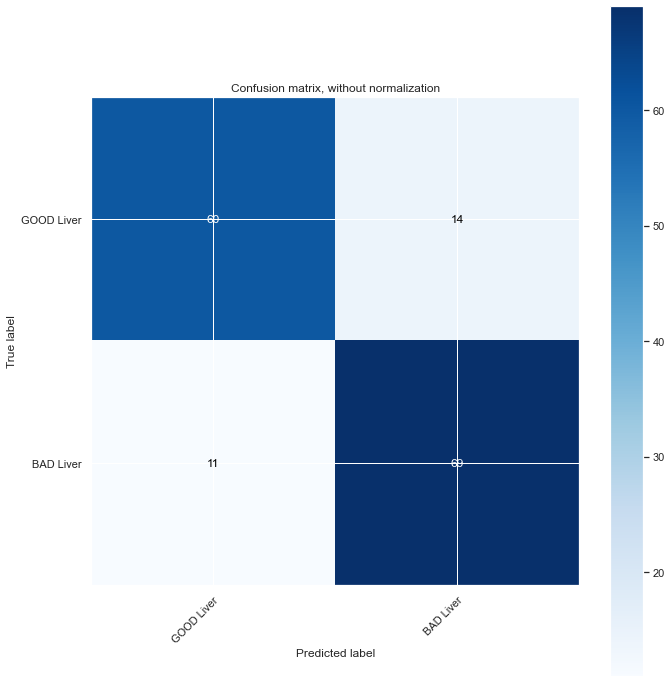

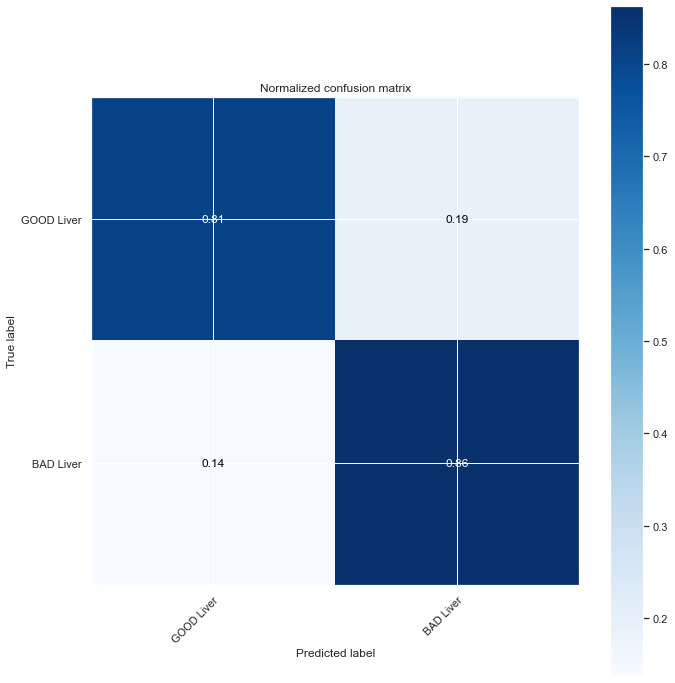

In [44]:
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import confusion_matrix
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
Y_pred=LiverModel.predict(X_test)
def plot_confusion_matrix(Y_test,Y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(Y_test,Y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(Y_test,Y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


np.set_printoptions(precision=2)

class_names = np.array(['GOOD Liver','BAD Liver'])

# Plot non-normalized confusion matrix
plot_confusion_matrix(Y_test,Y_pred, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(Y_test,Y_pred, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

0.883614864864865


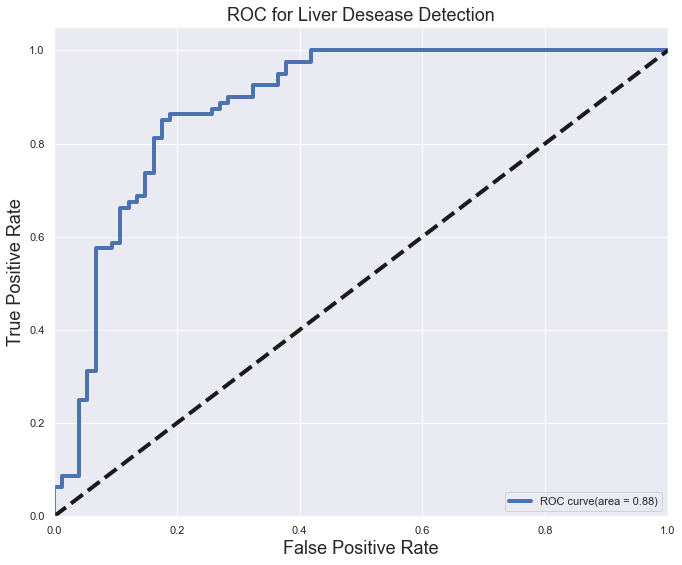

In [45]:
from sklearn.metrics import roc_curve, auc
#plt.style.use('seaborn-pastel')
Y_score = LiverModel.decision_function(X_test)

FPR, TPR, _ = roc_curve(Y_test, Y_score)
ROC_AUC = auc(FPR, TPR)
print (ROC_AUC)

plt.figure(figsize =[11,9])
plt.plot(FPR, TPR, label= 'ROC curve(area = %0.2f)'%ROC_AUC, linewidth= 4)
plt.plot([0,1],[0,1], 'k--', linewidth = 4)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate', fontsize = 18)
plt.ylabel('True Positive Rate', fontsize = 18)
plt.title('ROC for Liver Desease Detection', fontsize= 18)
plt.legend(loc="lower right")
plt.show()

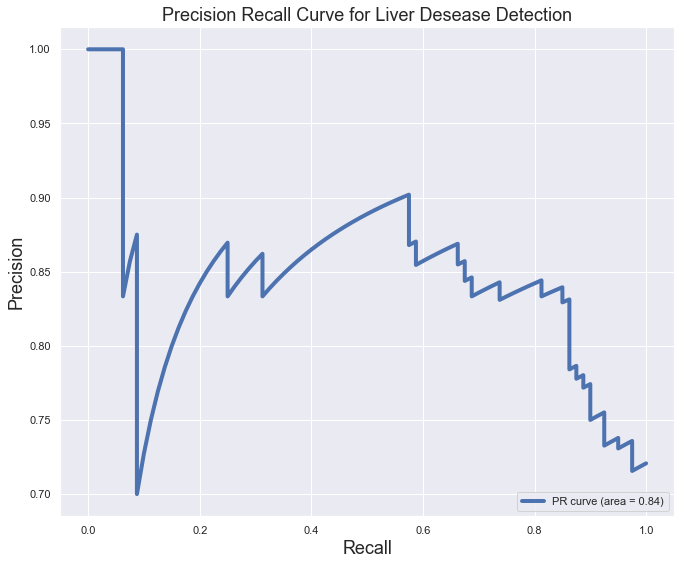

In [46]:
from sklearn.metrics import precision_recall_curve

Y_score = LiverModel.decision_function(X_test)

precision, recall, _ = precision_recall_curve(Y_test, Y_score)
PR_AUC = auc(recall, precision)

plt.figure(figsize=[11,9])
plt.plot(recall, precision, label='PR curve (area = %0.2f)' % PR_AUC, linewidth=4)
plt.xlabel('Recall', fontsize=18)
plt.ylabel('Precision', fontsize=18)
plt.title('Precision Recall Curve for Liver Desease Detection', fontsize=18)
plt.legend(loc="lower right")
plt.show()

In [47]:
from sklearn.metrics import log_loss
# Running Logarithmic Loss-or Log Loss-or Cross Entropy Loss on training Data
#Predicted_Proba_Y = TitanicModel.predict(X_train)
Predicted_Proba_Y = LiverModel.predict_proba(X_train)
print("The Log Loss on Training is: ", log_loss(Y_train, Predicted_Proba_Y))

# Running Logarithmic Loss-or Log Loss-or Cross Entropy Loss on testing Data
Predicted_Proba_Y = LiverModel.predict_proba(X_test)
print("The Log Loss on Testing is: ", log_loss(Y_test, Predicted_Proba_Y)) # Log-Loss has been Down
                                                                           # so our prediction is very good

The Log Loss on Training is:  0.5383935305116873
The Log Loss on Testing is:  0.4292615635722528


## Logistic Regression Tuning

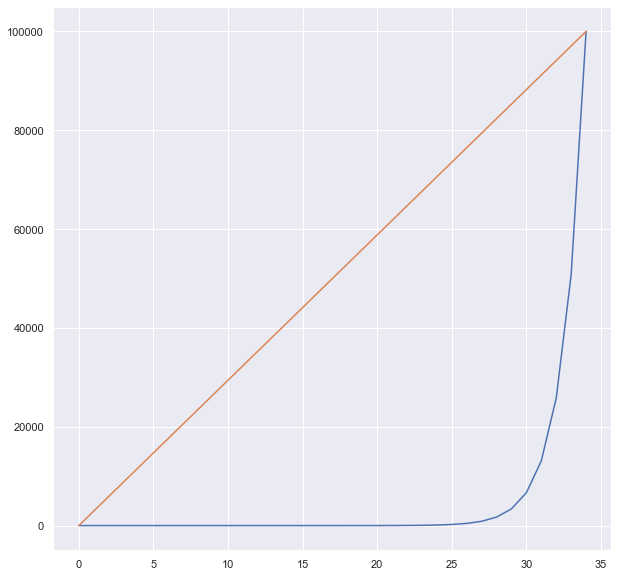

In [48]:
# Creating a Range for C values
# Plotting C values geomspace vs linspace
plot(geomspace(1e-5,1e5,num=35)) # Uniformly distributed in log space
plot(linspace(1e-5,1e5,num=35)) # Uniformly distributed in linear space, instead of geom space
show()

In [49]:
# Solver Selection
from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
solver_list = ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
params = dict(solver=solver_list)
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=726)

Liver_Solver_Select = LogisticRegression(C=1, n_jobs=-1, random_state=726, class_weight='balanced', penalty='l1')
Solver_Type = GridSearchCV(Liver_Solver_Select, params, cv=cv)
Solver_Type.fit(X_train, Y_train)
scores = Solver_Type.cv_results_['mean_test_score']

for score, solver in zip(scores, solver_list):
    print(f"  {solver} {score:.3f}" )

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\

  liblinear 0.728
  newton-cg nan
  lbfgs nan
  sag nan
  saga 0.724


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))


In [50]:
# Solver Selection
from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
solver_list = ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
params = dict(solver=solver_list)
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=726)

Liver_Solver_Select = LogisticRegression(C=1, n_jobs=-1, random_state=726, class_weight='balanced', penalty='l2')
Solver_Type = GridSearchCV(Liver_Solver_Select, params, cv=cv)
Solver_Type.fit(X_train, Y_train)
scores = Solver_Type.cv_results_['mean_test_score']

for score, solver in zip(scores, solver_list):
    print(f"  {solver} {score:.3f}" )

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\

  liblinear 0.730
  newton-cg 0.730
  lbfgs 0.730
  sag 0.730
  saga 0.732


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


In [51]:
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit
## C_vals is the alpla value of lasso and ridge regression(as alpha increases the model complexity decreases,)
## remember effective alpha scores are 0<alpha<infinity
solver_list = ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
## Choosing penalties(Lasso(l1) or Ridge(l2))
penalties = ['l1','l2']
## Choose a cross validation strategy. 
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=726)

## setting param for param_grid in GridSearchCV. 
param = {'penalty':penalties, 'solver':solver_list}

# logreg = LogisticRegression(solver='liblinear', class_weight='balanced')
## Calling on GridSearchCV object. 
LiverModel = GridSearchCV(estimator=LogisticRegression(class_weight='balanced'), 
                           param_grid = param,
                           scoring = 'accuracy',
                            n_jobs =-1,
                           cv = cv
                          )
## Fitting the model
LiverModel.fit(X_train, Y_train)

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=726, test_size=0.2,
            train_size=None),
             estimator=LogisticRegression(class_weight='balanced'), n_jobs=-1,
             param_grid={'penalty': ['l1', 'l2'],
                         'solver': ['liblinear', 'newton-cg', 'lbfgs', 'sag',
                                    'saga']},
             scoring='accuracy')

In [53]:
## Getting the best of everything.
print(LiverModel.best_score_)
print(LiverModel.best_params_)
print(LiverModel.best_estimator_)

0.7317073170731707
{'penalty': 'l2', 'solver': 'saga'}
LogisticRegression(class_weight='balanced', solver='saga')


In [54]:
# Looping Over The Parametres
# Here we have selected geomspace range for C value because it is probably best for finding Global Minimum Loss
C_List = np.geomspace(1e-5,1e5,num=35)
Accuracy = []
Log_Loss = []
for c in C_List:
    LiverModel2=LogisticRegression(solver='saga', class_weight='balanced', C=c, penalty='l2')
    LiverModel2.fit(X_train,Y_train)
    Score=LiverModel2.score(X_test,Y_test)
    Accuracy.append(Score)
    print("The Accuracy of C parameter {} is {}:".format(c,Score))
    Predicted_Proba_Y = LiverModel2.predict_proba(X_test)
    Log_Loss2 = log_loss(Y_test,Predicted_Proba_Y)
    Log_Loss.append(Log_Loss2)
    print("The Log Loss of C parameter {} is {}:".format(c, Log_Loss2))
    print("")

The Accuracy of C parameter 1e-05 is 0.8311688311688312:
The Log Loss of C parameter 1e-05 is 0.6926670694807426:

The Accuracy of C parameter 1.968419447286611e-05 is 0.8181818181818182:
The Log Loss of C parameter 1.968419447286611e-05 is 0.692200336371978:

The Accuracy of C parameter 3.874675120456128e-05 is 0.8246753246753247:
The Log Loss of C parameter 3.874675120456128e-05 is 0.6912924764753002:

The Accuracy of C parameter 7.626985859023451e-05 is 0.8246753246753247:
The Log Loss of C parameter 7.626985859023451e-05 is 0.6895335906840108:

The Accuracy of C parameter 0.00015013107289081742 is 0.8246753246753247:
The Log Loss of C parameter 0.00015013107289081742 is 0.6861797291716208:

The Accuracy of C parameter 0.0002955209235202888 is 0.8246753246753247:
The Log Loss of C parameter 0.0002955209235202888 is 0.6799671632943548:

The Accuracy of C parameter 0.0005817091329374358 is 0.8181818181818182:
The Log Loss of C parameter 0.0005817091329374358 is 0.6690396750591888:

Th

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

The Accuracy of C parameter 29.55209235202888 is 0.8376623376623377:
The Log Loss of C parameter 29.55209235202888 is 0.42180386782433377:

The Accuracy of C parameter 58.170913293743574 is 0.8376623376623377:
The Log Loss of C parameter 58.170913293743574 is 0.4217129259009425:

The Accuracy of C parameter 114.50475699382812 is 0.8376623376623377:
The Log Loss of C parameter 114.50475699382812 is 0.42165157594273533:

The Accuracy of C parameter 225.39339047347934 is 0.8376623376623377:
The Log Loss of C parameter 225.39339047347934 is 0.42161976471775825:

The Accuracy of C parameter 443.66873309786155 is 0.8376623376623377:
The Log Loss of C parameter 443.66873309786155 is 0.4215667472654183:

The Accuracy of C parameter 873.3261623828438 is 0.8376623376623377:
The Log Loss of C parameter 873.3261623828438 is 0.4215898531898532:

The Accuracy of C parameter 1719.0722018585782 is 0.8376623376623377:
The Log Loss of C parameter 1719.0722018585782 is 0.42157796582565815:

The Accuracy 

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


The Log Loss of C parameter 6660.846290809168 is 0.4215666099176188:

The Accuracy of C parameter 13111.33937421563 is 0.8376623376623377:
The Log Loss of C parameter 13111.33937421563 is 0.4215753798575597:

The Accuracy of C parameter 25808.615404180768 is 0.8376623376623377:
The Log Loss of C parameter 25808.615404180768 is 0.42159058221191875:

The Accuracy of C parameter 50802.18046913033 is 0.8376623376623377:
The Log Loss of C parameter 50802.18046913033 is 0.42158306860912587:

The Accuracy of C parameter 100000.0 is 0.8376623376623377:
The Log Loss of C parameter 100000.0 is 0.42157292554075937:



D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


In [55]:
# Putting the Outcomes in A Table & Reshaping
accuracy = array(Accuracy).reshape(35,)
LoG_LoSs = array(Log_Loss).reshape(35,)
# Zip
Outcomes = zip(C_List,accuracy,LoG_LoSs)
# DataFrame
DF_Outcomes = DataFrame(Outcomes, columns=["C_List","accuracy","LoG_LoSs"])
# Print DF_Outcomes
DF_Outcomes
# Re-Ordering the DF_Outcomes
DF_Outcomes.sort_values("LoG_LoSs", ascending=True).reset_index()

,index,C_List,accuracy,LoG_LoSs
0,30,6660.846291,0.837662,0.421567
1,26,443.668733,0.837662,0.421567
2,29,3383.855153,0.837662,0.421568
3,34,100000.000000,0.837662,0.421573
4,31,13111.339374,0.837662,0.421575
5,28,1719.072202,0.837662,0.421578
6,33,50802.180469,0.837662,0.421583
7,27,873.326162,0.837662,0.421590
8,32,25808.615404,0.837662,0.421591
9,25,225.393390,0.837662,0.421620


In [56]:
# For loop to check ideal sample that will give generalized model
#Test1
for i in range(1,3500):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    LiverModel2=LogisticRegression(solver='saga', penalty='l2', class_weight='balanced', C=6660.846291)
    
    LiverModel2.fit(X_train,Y_train)
    
    train_score=LiverModel2.score(X_train,Y_train)
    
    test_score=LiverModel2.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 1
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 2
Test: 0.7597402597402597 Train: 0.7287581699346405 RandomState: 3
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 5
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 7
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 8


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 9
Test: 0.7597402597402597 Train: 0.7369281045751634 RandomState: 15
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 17
Test: 0.7792207792207793 Train: 0.7336601307189542 RandomState: 18
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 19
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 23
Test: 0.7597402597402597 Train: 0.7352941176470589 RandomState: 24


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 28
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 31
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 32
Test: 0.7857142857142857 Train: 0.7303921568627451 RandomState: 35
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 36

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 37
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 41
Test: 0.7402597402597403 Train: 0.7369281045751634 RandomState: 45


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 48
Test: 0.7532467532467533 Train: 0.75 RandomState: 50
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 52
Test: 0.7402597402597403 Train: 0.7369281045751634 RandomState: 53
Test: 0.7922077922077922 Train: 0.738562091503268 RandomState: 54


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7352941176470589 RandomState: 57
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 58
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 61
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 62
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 63
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 64


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7369281045751634 RandomState: 65
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 68
Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 69
Test: 0.7597402597402597 Train: 0.7352941176470589 RandomState: 72
Test: 0.7792207792207793 Train: 0.7418300653594772 RandomState: 74


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7450980392156863 RandomState: 79
Test: 0.7597402597402597 Train: 0.7369281045751634 RandomState: 81
Test: 0.7987012987012987 Train: 0.7287581699346405 RandomState: 82
Test: 0.7662337662337663 Train: 0.7287581699346405 RandomState: 83
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 86
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 87


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 88
Test: 0.7857142857142857 Train: 0.7287581699346405 RandomState: 89
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 90
Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 91
Test: 0.8181818181818182 Train: 0.7254901960784313 RandomState: 93


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 97
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 98
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 99
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 101
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 102


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 107
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 109
Test: 0.7467532467532467 Train: 0.7369281045751634 RandomState: 112
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 115
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 116
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 121


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 124
Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 125
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 130


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 133
Test: 0.8051948051948052 Train: 0.7320261437908496 RandomState: 134
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 135
Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 137
Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 138
Test: 0.7532467532467533 Train: 0.75 RandomState: 139
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 140


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 144
Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 145
Test: 0.7792207792207793 Train: 0.7287581699346405 RandomState: 146
Test: 0.7662337662337663 Train: 0.7516339869281046 RandomState: 147
Test: 0.7922077922077922 Train: 0.7320261437908496 RandomState: 148
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 150


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7337662337662337 Train: 0.7336601307189542 RandomState: 153
Test: 0.7857142857142857 Train: 0.7418300653594772 RandomState: 157
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 159
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 160
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 161


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8051948051948052 Train: 0.7369281045751634 RandomState: 162
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 163
Test: 0.7922077922077922 Train: 0.7352941176470589 RandomState: 164
Test: 0.7532467532467533 Train: 0.7352941176470589 RandomState: 166
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 167
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 170


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 173
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 174
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 181


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 183
Test: 0.7922077922077922 Train: 0.7401960784313726 RandomState: 191

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 193
Test: 0.7467532467532467 Train: 0.7336601307189542 RandomState: 199


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 202
Test: 0.7792207792207793 Train: 0.7418300653594772 RandomState: 203
Test: 0.7532467532467533 Train: 0.7369281045751634 RandomState: 208
Test: 0.7792207792207793 Train: 0.7320261437908496 RandomState: 210


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 211
Test: 0.7857142857142857 Train: 0.7450980392156863 RandomState: 212
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 214
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 217
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 219


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 222
Test: 0.7857142857142857 Train: 0.7303921568627451 RandomState: 224
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 225
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 226
Test: 0.7987012987012987 Train: 0.7418300653594772 RandomState: 228
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 229
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 230


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 232
Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 235
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 236
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 237
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 239


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7303921568627451 RandomState: 241
Test: 0.7987012987012987 Train: 0.7238562091503268 RandomState: 242
Test: 0.8181818181818182 Train: 0.7287581699346405 RandomState: 243
Test: 0.7857142857142857 Train: 0.7271241830065359 RandomState: 245
Test: 0.7922077922077922 Train: 0.7336601307189542 RandomState: 247
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 249


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7352941176470589 RandomState: 251
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 252
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 258


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7303921568627451 RandomState: 265
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 266
Test: 0.8051948051948052 Train: 0.7287581699346405 RandomState: 267
Test: 0.7987012987012987 Train: 0.738562091503268 RandomState: 268
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 270
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 271
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 272


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 274
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 281
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 282


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 285
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 287
Test: 0.7857142857142857 Train: 0.7418300653594772 RandomState: 288
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 289
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 290
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 292


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 294
Test: 0.7922077922077922 Train: 0.7401960784313726 RandomState: 296
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 299
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 300
Test: 0.7857142857142857 Train: 0.7254901960784313 RandomState: 301
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 302


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7369281045751634 RandomState: 304
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 306
Test: 0.7532467532467533 Train: 0.7369281045751634 RandomState: 308
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 310
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 311
Test: 0.7922077922077922 Train: 0.7287581699346405 RandomState: 312


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 314
Test: 0.7922077922077922 Train: 0.7352941176470589 RandomState: 318
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 322
Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 323

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 324
Test: 0.7922077922077922 Train: 0.7238562091503268 RandomState: 325
Test: 0.8116883116883117 Train: 0.7205882352941176 RandomState: 327
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 328


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 334
Test: 0.7532467532467533 Train: 0.7352941176470589 RandomState: 335
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 336
Test: 0.7727272727272727 Train: 0.7352941176470589 RandomState: 339


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 344
Test: 0.7727272727272727 Train: 0.7352941176470589 RandomState: 345
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 350
Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 351


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 353
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 354
Test: 0.7922077922077922 Train: 0.7352941176470589 RandomState: 359


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7450980392156863 RandomState: 362
Test: 0.7662337662337663 Train: 0.7336601307189542 RandomState: 363
Test: 0.7597402597402597 Train: 0.75 RandomState: 366
Test: 0.7727272727272727 Train: 0.7303921568627451 RandomState: 368


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 370
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 372
Test: 0.7987012987012987 Train: 0.7352941176470589 RandomState: 373
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 375
Test: 0.7792207792207793 Train: 0.7336601307189542 RandomState: 376
Test: 0.7402597402597403 Train: 0.7369281045751634 RandomState: 378


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 379
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 381
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 384
Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 385
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 387


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 388
Test: 0.7597402597402597 Train: 0.7369281045751634 RandomState: 389
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 390
Test: 0.7402597402597403 Train: 0.738562091503268 RandomState: 391
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 395


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 397
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 398
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 400
Test: 0.8441558441558441 Train: 0.7205882352941176 RandomState: 403
Test: 0.7597402597402597 Train: 0.7565359477124183 RandomState: 404


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 409
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 413
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 415
Test: 0.7792207792207793 Train: 0.7320261437908496 RandomState: 417


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.738562091503268 RandomState: 418
Test: 0.7727272727272727 Train: 0.7352941176470589 RandomState: 422


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7205882352941176 RandomState: 426
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 427
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 429
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 430
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 432
Test: 0.7987012987012987 Train: 0.7336601307189542 RandomState: 434


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 435
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 438
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 442


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 444
Test: 0.8051948051948052 Train: 0.7320261437908496 RandomState: 446
Test: 0.7922077922077922 Train: 0.7336601307189542 RandomState: 447
Test: 0.7532467532467533 Train: 0.7352941176470589 RandomState: 449
Test: 0.7792207792207793 Train: 0.7336601307189542 RandomState: 451
Test: 0.8311688311688312 Train: 0.7303921568627451 RandomState: 453


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8116883116883117 Train: 0.7271241830065359 RandomState: 457
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 458
Test: 0.7597402597402597 Train: 0.7320261437908496 RandomState: 459
Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 463
Test: 0.7922077922077922 Train: 0.7450980392156863 RandomState: 465


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 467
Test: 0.7922077922077922 Train: 0.7352941176470589 RandomState: 469
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 470
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 471
Test: 0.7597402597402597 Train: 0.75 RandomState: 473
Test: 0.7987012987012987 Train: 0.7271241830065359 RandomState: 476


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8051948051948052 Train: 0.7287581699346405 RandomState: 478
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 479
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 480
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 481
Test: 0.7857142857142857 Train: 0.7401960784313726 RandomState: 483
Test: 0.7857142857142857 Train: 0.738562091503268 RandomState: 484
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 486


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 487
Test: 0.7792207792207793 Train: 0.7418300653594772 RandomState: 488
Test: 0.7922077922077922 Train: 0.7320261437908496 RandomState: 490
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 491
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 492
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 494


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 498
Test: 0.8051948051948052 Train: 0.7189542483660131 RandomState: 499
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 500
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 502
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 503
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 504
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 505
Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 506


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 507
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 509
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 512
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 514


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 516
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 517
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 518
Test: 0.7857142857142857 Train: 0.7401960784313726 RandomState: 520
Test: 0.8181818181818182 Train: 0.7303921568627451 RandomState: 521
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 523


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 526
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 530
Test: 0.7727272727272727 Train: 0.7467320261437909 RandomState: 532
Test: 0.7987012987012987 Train: 0.7303921568627451 RandomState: 533


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 535
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 537
Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 538
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 539
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 543


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 545
Test: 0.7987012987012987 Train: 0.7303921568627451 RandomState: 548
Test: 0.7922077922077922 Train: 0.7352941176470589 RandomState: 549
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 552


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 554
Test: 0.7727272727272727 Train: 0.7516339869281046 RandomState: 555
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 556
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 557


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7303921568627451 RandomState: 564
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 568
Test: 0.7597402597402597 Train: 0.7549019607843137 RandomState: 569
Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 571
Test: 0.7922077922077922 Train: 0.7352941176470589 RandomState: 573


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 574
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 575
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 576
Test: 0.7987012987012987 Train: 0.7287581699346405 RandomState: 577
Test: 0.7597402597402597 Train: 0.7303921568627451 RandomState: 578
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 579
Test: 0.7727272727272727 Train: 0.75 RandomState: 581


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 587
Test: 0.7857142857142857 Train: 0.7401960784313726 RandomState: 588
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 590
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 593
Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 594
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 595
Test: 0.7857142857142857 Train: 0.7401960784313726 RandomState: 597
Test: 0.7597402597402597 Train: 0.7352941176470589 RandomState: 602
Test: 0.7987012987012987 Train: 0.7450980392156863 RandomState: 604
Test: 0.8116883116883117 Train: 0.7271241830065359 RandomState: 605


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 606
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 608
Test: 0.8051948051948052 Train: 0.7287581699346405 RandomState: 609
Test: 0.7922077922077922 Train: 0.7303921568627451 RandomState: 611
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 612
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 613


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.738562091503268 RandomState: 617
Test: 0.8181818181818182 Train: 0.7156862745098039 RandomState: 618
Test: 0.7662337662337663 Train: 0.7467320261437909 RandomState: 619
Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 621
Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 623
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 624
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 625


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 628
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 629
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 630
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 631
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 632
Test: 0.8311688311688312 Train: 0.7189542483660131 RandomState: 634


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 639
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 640
Test: 0.7532467532467533 Train: 0.7303921568627451 RandomState: 645
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 646


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7402597402597403 Train: 0.738562091503268 RandomState: 647
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 650
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 651
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 654
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 656


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 658
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 660
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 661
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 663
Test: 0.7597402597402597 Train: 0.7565359477124183 RandomState: 666


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 669
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 671
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 676


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 678
Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 682
Test: 0.7727272727272727 Train: 0.7303921568627451 RandomState: 683
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 684


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 685
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 686
Test: 0.8051948051948052 Train: 0.7271241830065359 RandomState: 688
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 690
Test: 0.7662337662337663 Train: 0.7271241830065359 RandomState: 694
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 696
Test: 0.7662337662337663 Train: 0.7336601307189542 RandomState: 698
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 699
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 700
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 701


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8051948051948052 Train: 0.7336601307189542 RandomState: 703
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 705
Test: 0.7597402597402597 Train: 0.7352941176470589 RandomState: 711


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 712
Test: 0.7857142857142857 Train: 0.7418300653594772 RandomState: 718
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 719
Test: 0.7987012987012987 Train: 0.738562091503268 RandomState: 720
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 722
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 724
Test: 0.8376623376623377 Train: 0.7254901960784313 RandomState: 726


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 729
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 730
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 732
Test: 0.7857142857142857 Train: 0.7271241830065359 RandomState: 733
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 735


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7287581699346405 RandomState: 740
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 741
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 742
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 745


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7401960784313726 RandomState: 750
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 755
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 756


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7287581699346405 RandomState: 761
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 762
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 763
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 764
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 765
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 767
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 768


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7336601307189542 RandomState: 772
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 774
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 775
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 778
Test: 0.7922077922077922 Train: 0.7369281045751634 RandomState: 780

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7467532467532467 Train: 0.7336601307189542 RandomState: 781
Test: 0.7727272727272727 Train: 0.7565359477124183 RandomState: 783
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 784


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7352941176470589 RandomState: 788
Test: 0.7792207792207793 Train: 0.7303921568627451 RandomState: 790
Test: 0.7532467532467533 Train: 0.75 RandomState: 791
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 793
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 794


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 798
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 800
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 804
Test: 0.7727272727272727 Train: 0.7450980392156863 RandomState: 805


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 810
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 815


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7336601307189542 RandomState: 818
Test: 0.7922077922077922 Train: 0.7401960784313726 RandomState: 819
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 821
Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 822
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 823
Test: 0.7727272727272727 Train: 0.7320261437908496 RandomState: 824
Test: 0.8051948051948052 Train: 0.7287581699346405 RandomState: 825


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 831
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 834
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 836


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 838
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 839
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 842
Test: 0.7467532467532467 Train: 0.7352941176470589 RandomState: 845


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7402597402597403 Train: 0.738562091503268 RandomState: 846
Test: 0.7922077922077922 Train: 0.7434640522875817 RandomState: 850
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 853
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 854


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7516339869281046 RandomState: 857
Test: 0.7922077922077922 Train: 0.7303921568627451 RandomState: 862
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 863
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 864


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7271241830065359 RandomState: 867
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 868
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 871
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 873


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 874
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 875
Test: 0.7987012987012987 Train: 0.7369281045751634 RandomState: 876
Test: 0.7597402597402597 Train: 0.7303921568627451 RandomState: 880
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 881


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 883
Test: 0.7337662337662337 Train: 0.7336601307189542 RandomState: 884
Test: 0.7337662337662337 Train: 0.7336601307189542 RandomState: 887


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7401960784313726 RandomState: 891
Test: 0.7467532467532467 Train: 0.7401960784313726 RandomState: 893
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 894
Test: 0.7922077922077922 Train: 0.7320261437908496 RandomState: 895
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 896
Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 897
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 898


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7402597402597403 Train: 0.7352941176470589 RandomState: 900
Test: 0.7532467532467533 Train: 0.7287581699346405 RandomState: 901
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 906
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 907


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 911
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 912
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 913
Test: 0.7532467532467533 Train: 0.7352941176470589 RandomState: 916
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 917


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 919
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 922
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 923
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 925
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 926
Test: 0.7922077922077922 Train: 0.7336601307189542 RandomState: 927


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7418300653594772 RandomState: 930
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 931
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 932
Test: 0.7857142857142857 Train: 0.7450980392156863 RandomState: 933
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 935
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 937
Test: 0.7857142857142857 Train: 0.7254901960784313 RandomState: 938
Test: 0.7987012987012987 Train: 0.7418300653594772 RandomState: 939

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 941
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 942
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 944
Test: 0.7597402597402597 Train: 0.7303921568627451 RandomState: 946


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.75 RandomState: 947
Test: 0.7402597402597403 Train: 0.738562091503268 RandomState: 951
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 954


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 955
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 956
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 958
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 960
Test: 0.8051948051948052 Train: 0.7238562091503268 RandomState: 962


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 964
Test: 0.7922077922077922 Train: 0.7336601307189542 RandomState: 968
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 969
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 970


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8181818181818182 Train: 0.7336601307189542 RandomState: 971
Test: 0.7857142857142857 Train: 0.738562091503268 RandomState: 972
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 973
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 975
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 977


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 980
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 981
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 985
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 987


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8181818181818182 Train: 0.7287581699346405 RandomState: 988
Test: 0.8116883116883117 Train: 0.738562091503268 RandomState: 989
Test: 0.7987012987012987 Train: 0.7369281045751634 RandomState: 990
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 991
Test: 0.7922077922077922 Train: 0.7369281045751634 RandomState: 995


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7336601307189542 RandomState: 996
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 997
Test: 0.7857142857142857 Train: 0.738562091503268 RandomState: 998
Test: 0.7792207792207793 Train: 0.7450980392156863 RandomState: 1001
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 1002


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 1006
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 1007
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 1008
Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 1012
Test: 0.7922077922077922 Train: 0.7418300653594772 RandomState: 1013


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 1015
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 1016
Test: 0.7792207792207793 Train: 0.7418300653594772 RandomState: 1018
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 1021


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7271241830065359 RandomState: 1023
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 1025
Test: 0.7727272727272727 Train: 0.7352941176470589 RandomState: 1026
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 1029
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 1030


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 1032
Test: 0.8181818181818182 Train: 0.7238562091503268 RandomState: 1033
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 1034
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 1037
Test: 0.7467532467532467 Train: 0.7336601307189542 RandomState: 1039


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 1040
Test: 0.7467532467532467 Train: 0.7401960784313726 RandomState: 1041
Test: 0.8051948051948052 Train: 0.7238562091503268 RandomState: 1044
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 1045
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 1047


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 1049
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 1052
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 1055


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 1056
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 1057
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 1058


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 1066
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 1071


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 1077
Test: 0.7857142857142857 Train: 0.7401960784313726 RandomState: 1081
Test: 0.7987012987012987 Train: 0.7271241830065359 RandomState: 1082
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 1084


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 1087
Test: 0.7922077922077922 Train: 0.7303921568627451 RandomState: 1090
Test: 0.7922077922077922 Train: 0.7271241830065359 RandomState: 1091
Test: 0.7597402597402597 Train: 0.7516339869281046 RandomState: 1092
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 1093
Test: 0.7597402597402597 Train: 0.7369281045751634 RandomState: 1094
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 1095


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8116883116883117 Train: 0.7303921568627451 RandomState: 1096
Test: 0.7662337662337663 Train: 0.7303921568627451 RandomState: 1098
Test: 0.7662337662337663 Train: 0.7467320261437909 RandomState: 1099
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 1102
Test: 0.7922077922077922 Train: 0.7320261437908496 RandomState: 1103


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 1109
Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 1113
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 1116


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7450980392156863 RandomState: 1117
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 1118
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 1120
Test: 0.7532467532467533 Train: 0.7336601307189542 RandomState: 1121
Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 1122
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 1123


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7987012987012987 Train: 0.7352941176470589 RandomState: 1125
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 1127
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 1129
Test: 0.7597402597402597 Train: 0.75 RandomState: 1131
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 1132


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 1133
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 1137


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 1141
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 1143
Test: 0.7792207792207793 Train: 0.7303921568627451 RandomState: 1145
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 1147
Test: 0.7922077922077922 Train: 0.7271241830065359 RandomState: 1149


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 1154
Test: 0.7532467532467533 Train: 0.75 RandomState: 1156
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 1158


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 1168
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 1169
Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 1170
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 1172
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 1174


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 1178
Test: 0.7597402597402597 Train: 0.7352941176470589 RandomState: 1179
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 1181
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 1182
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 1183
Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 1185
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 1186


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7401960784313726 RandomState: 1187
Test: 0.7662337662337663 Train: 0.7516339869281046 RandomState: 1191
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 1193
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 1194


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8051948051948052 Train: 0.7271241830065359 RandomState: 1195
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 1196
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 1197
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 1198
Test: 0.7857142857142857 Train: 0.738562091503268 RandomState: 1199
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 1200
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 1202


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 1203
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 1204
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 1206
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 1207
Test: 0.7857142857142857 Train: 0.7418300653594772 RandomState: 1208
Test: 0.7662337662337663 Train: 0.7336601307189542 RandomState: 1209


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 1211
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 1212
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 1213
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 1214
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 1215
Test: 0.7727272727272727 Train: 0.7352941176470589 RandomState: 1218


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7402597402597403 Train: 0.7352941176470589 RandomState: 1222
Test: 0.7662337662337663 Train: 0.7320261437908496 RandomState: 1226
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 1227


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 1232
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 1236
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 1238


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 1239
Test: 0.7922077922077922 Train: 0.7369281045751634 RandomState: 1241


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 1248
Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 1249
Test: 0.7597402597402597 Train: 0.7369281045751634 RandomState: 1251
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 1252


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 1262
Test: 0.7467532467532467 Train: 0.7401960784313726 RandomState: 1267
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 1268


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 1270
Test: 0.7467532467532467 Train: 0.7287581699346405 RandomState: 1272
Test: 0.7597402597402597 Train: 0.7565359477124183 RandomState: 1275
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 1277
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 1278


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8051948051948052 Train: 0.7401960784313726 RandomState: 1281
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 1282
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 1283
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 1284
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 1287


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7467320261437909 RandomState: 1289
Test: 0.7597402597402597 Train: 0.75 RandomState: 1290
Test: 0.7922077922077922 Train: 0.7320261437908496 RandomState: 1294
Test: 0.7597402597402597 Train: 0.7369281045751634 RandomState: 1295


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 1298
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 1301
Test: 0.7597402597402597 Train: 0.7369281045751634 RandomState: 1303
Test: 0.7532467532467533 Train: 0.75 RandomState: 1304


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7450980392156863 RandomState: 1312
Test: 0.7662337662337663 Train: 0.7287581699346405 RandomState: 1313
Test: 0.8181818181818182 Train: 0.7222222222222222 RandomState: 1317
Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 1319

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 1323
Test: 0.7597402597402597 Train: 0.75 RandomState: 1326
Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 1329
Test: 0.7467532467532467 Train: 0.7369281045751634 RandomState: 1330


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 1333
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 1335
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 1336
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 1338
Test: 0.7532467532467533 Train: 0.75 RandomState: 1339
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 1340


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7254901960784313 RandomState: 1342
Test: 0.7662337662337663 Train: 0.7532679738562091 RandomState: 1344
Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 1346
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 1347
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 1350


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 1351
Test: 0.7922077922077922 Train: 0.7303921568627451 RandomState: 1352
Test: 0.7857142857142857 Train: 0.7434640522875817 RandomState: 1354
Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 1357
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 1359


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8116883116883117 Train: 0.7303921568627451 RandomState: 1361
Test: 0.7532467532467533 Train: 0.7352941176470589 RandomState: 1363
Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 1365
Test: 0.7662337662337663 Train: 0.7581699346405228 RandomState: 1367


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7402597402597403 Train: 0.7369281045751634 RandomState: 1371
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 1372
Test: 0.7987012987012987 Train: 0.7352941176470589 RandomState: 1373
Test: 0.7662337662337663 Train: 0.7336601307189542 RandomState: 1376
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 1379


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7320261437908496 RandomState: 1382
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 1383
Test: 0.7662337662337663 Train: 0.7303921568627451 RandomState: 1384
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 1387
Test: 0.7857142857142857 Train: 0.738562091503268 RandomState: 1389
Test: 0.7987012987012987 Train: 0.7336601307189542 RandomState: 1391


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 1398
Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 1399
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 1400
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 1402
Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 1403
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 1404
Test: 0.7597402597402597 Train: 0.7516339869281046 RandomState: 1405


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7450980392156863 RandomState: 1408
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 1410
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 1411
Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 1415
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 1417


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.738562091503268 RandomState: 1418
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 1419
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 1421


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 1427
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 1429
Test: 0.7922077922077922 Train: 0.7418300653594772 RandomState: 1430
Test: 0.7857142857142857 Train: 0.7450980392156863 RandomState: 1432
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 1435


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8051948051948052 Train: 0.7320261437908496 RandomState: 1439
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 1440
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 1441
Test: 0.7597402597402597 Train: 0.7320261437908496 RandomState: 1442
Test: 0.7857142857142857 Train: 0.738562091503268 RandomState: 1443
Test: 0.8181818181818182 Train: 0.7303921568627451 RandomState: 1445
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 1447


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 1448
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 1451
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 1452


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 1457
Test: 0.7922077922077922 Train: 0.7320261437908496 RandomState: 1458
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 1461
Test: 0.8051948051948052 Train: 0.7352941176470589 RandomState: 1462
Test: 0.7727272727272727 Train: 0.7320261437908496 RandomState: 1463
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 1464
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 1465
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 1466

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 1467
Test: 0.7532467532467533 Train: 0.75 RandomState: 1468


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 1474
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 1475
Test: 0.7597402597402597 Train: 0.7369281045751634 RandomState: 1477


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 1487
Test: 0.7987012987012987 Train: 0.7254901960784313 RandomState: 1490
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 1491
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 1492


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.738562091503268 RandomState: 1496
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 1501
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 1502
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 1503


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 1509
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 1510
Test: 0.7987012987012987 Train: 0.7336601307189542 RandomState: 1511
Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 1512
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 1513
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 1515


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 1516
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 1520
Test: 0.7532467532467533 Train: 0.75 RandomState: 1522
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 1524


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 1526
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 1527
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 1529
Test: 0.8116883116883117 Train: 0.7287581699346405 RandomState: 1530
Test: 0.7792207792207793 Train: 0.7418300653594772 RandomState: 1532
Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 1533


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 1534
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 1535
Test: 0.7532467532467533 Train: 0.7352941176470589 RandomState: 1536
Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 1537


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.75 RandomState: 1541
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 1543
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 1545
Test: 0.7857142857142857 Train: 0.7434640522875817 RandomState: 1547


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7434640522875817 RandomState: 1549
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 1550
Test: 0.7792207792207793 Train: 0.7287581699346405 RandomState: 1551
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 1552
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 1553
Test: 0.7857142857142857 Train: 0.7287581699346405 RandomState: 1557

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 1558
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 1559
Test: 0.7662337662337663 Train: 0.7271241830065359 RandomState: 1560
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 1562
Test: 0.8246753246753247 Train: 0.7238562091503268 RandomState: 1564


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7467320261437909 RandomState: 1566
Test: 0.7727272727272727 Train: 0.7450980392156863 RandomState: 1568
Test: 0.7792207792207793 Train: 0.7418300653594772 RandomState: 1569
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 1571


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 1573
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 1578


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 1581
Test: 0.8116883116883117 Train: 0.7352941176470589 RandomState: 1582
Test: 0.7467532467532467 Train: 0.7352941176470589 RandomState: 1583
Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 1584
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 1588


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 1591
Test: 0.8246753246753247 Train: 0.7189542483660131 RandomState: 1597


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 1600
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 1603
Test: 0.7402597402597403 Train: 0.738562091503268 RandomState: 1605


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 1610
Test: 0.7467532467532467 Train: 0.7336601307189542 RandomState: 1615
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 1616


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7303921568627451 RandomState: 1617
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 1619
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 1623
Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 1624


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.75 RandomState: 1627
Test: 0.7922077922077922 Train: 0.7271241830065359 RandomState: 1630
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 1634


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 1637
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 1638
Test: 0.7402597402597403 Train: 0.7320261437908496 RandomState: 1639
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 1642
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 1644


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 1646
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 1647
Test: 0.7987012987012987 Train: 0.738562091503268 RandomState: 1650
Test: 0.7662337662337663 Train: 0.7303921568627451 RandomState: 1652
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 1653


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 1654
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 1655
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 1656
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 1658
Test: 0.7467532467532467 Train: 0.7401960784313726 RandomState: 1659
Test: 0.7467532467532467 Train: 0.7352941176470589 RandomState: 1661
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 1662


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 1663
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 1665
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 1666
Test: 0.7922077922077922 Train: 0.7238562091503268 RandomState: 1668
Test: 0.7792207792207793 Train: 0.7336601307189542 RandomState: 1669


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 1674
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 1675
Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 1676
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 1678
Test: 0.7597402597402597 Train: 0.75 RandomState: 1679
Test: 0.8246753246753247 Train: 0.7352941176470589 RandomState: 1681


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 1683
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 1685
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 1686
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 1688


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 1694
Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 1695
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 1696
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 1697
Test: 0.8116883116883117 Train: 0.7287581699346405 RandomState: 1699
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 1700
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 1702


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8051948051948052 Train: 0.7336601307189542 RandomState: 1705
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 1706
Test: 0.7987012987012987 Train: 0.7401960784313726 RandomState: 1708
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 1710
Test: 0.7922077922077922 Train: 0.7287581699346405 RandomState: 1713


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 1714
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 1716
Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 1717
Test: 0.7597402597402597 Train: 0.7516339869281046 RandomState: 1719
Test: 0.7597402597402597 Train: 0.7352941176470589 RandomState: 1720
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 1721


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 1724
Test: 0.7662337662337663 Train: 0.75 RandomState: 1727
Test: 0.7857142857142857 Train: 0.75 RandomState: 1728
Test: 0.7987012987012987 Train: 0.7320261437908496 RandomState: 1730
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 1731


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 1734
Test: 0.7727272727272727 Train: 0.7320261437908496 RandomState: 1735
Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 1737
Test: 0.8051948051948052 Train: 0.7222222222222222 RandomState: 1738
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 1741


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 1744
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 1745
Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 1751


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 1756
Test: 0.7532467532467533 Train: 0.75 RandomState: 1759
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 1762
Test: 0.7727272727272727 Train: 0.7450980392156863 RandomState: 1764


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7271241830065359 RandomState: 1771
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 1773
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 1774
Test: 0.7727272727272727 Train: 0.7450980392156863 RandomState: 1775
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 1777
Test: 0.7792207792207793 Train: 0.7320261437908496 RandomState: 1779


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 1780
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 1783
Test: 0.7467532467532467 Train: 0.7401960784313726 RandomState: 1784
Test: 0.7857142857142857 Train: 0.7450980392156863 RandomState: 1785


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7320261437908496 RandomState: 1791
Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 1793
Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 1797
Test: 0.7597402597402597 Train: 0.7336601307189542 RandomState: 1799


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7287581699346405 RandomState: 1801
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 1802
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 1805
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 1807


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 1811
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 1814
Test: 0.7532467532467533 Train: 0.7254901960784313 RandomState: 1817
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 1818
Test: 0.7922077922077922 Train: 0.7271241830065359 RandomState: 1819


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 1820
Test: 0.7727272727272727 Train: 0.7352941176470589 RandomState: 1821
Test: 0.7597402597402597 Train: 0.75 RandomState: 1823
Test: 0.7467532467532467 Train: 0.7401960784313726 RandomState: 1824


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7352941176470589 RandomState: 1825
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 1827
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 1829


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8051948051948052 Train: 0.7173202614379085 RandomState: 1831
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 1832
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 1834
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 1837


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7303921568627451 RandomState: 1839
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 1840
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 1841


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7402597402597403 Train: 0.738562091503268 RandomState: 1846
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 1848
Test: 0.7597402597402597 Train: 0.7352941176470589 RandomState: 1849
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 1850


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.75 RandomState: 1853
Test: 0.7922077922077922 Train: 0.7336601307189542 RandomState: 1858
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 1859
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 1860
Test: 0.7987012987012987 Train: 0.7287581699346405 RandomState: 1861

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 1862
Test: 0.8116883116883117 Train: 0.7271241830065359 RandomState: 1863
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 1866


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 1870
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 1872


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7189542483660131 RandomState: 1877
Test: 0.7727272727272727 Train: 0.7352941176470589 RandomState: 1879
Test: 0.7727272727272727 Train: 0.7320261437908496 RandomState: 1880
Test: 0.7987012987012987 Train: 0.7320261437908496 RandomState: 1881


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 1887
Test: 0.7532467532467533 Train: 0.7369281045751634 RandomState: 1889
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 1890
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 1892


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 1897
Test: 0.7987012987012987 Train: 0.7303921568627451 RandomState: 1898
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 1900
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 1902
Test: 0.7727272727272727 Train: 0.7320261437908496 RandomState: 1904

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7662337662337663 Train: 0.7549019607843137 RandomState: 1905
Test: 0.7662337662337663 Train: 0.75 RandomState: 1906
Test: 0.8051948051948052 Train: 0.7303921568627451 RandomState: 1910
Test: 0.7792207792207793 Train: 0.7336601307189542 RandomState: 1911


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 1913
Test: 0.7792207792207793 Train: 0.7450980392156863 RandomState: 1914
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 1915
Test: 0.8116883116883117 Train: 0.7320261437908496 RandomState: 1917
Test: 0.7402597402597403 Train: 0.738562091503268 RandomState: 1918
Test: 0.7402597402597403 Train: 0.738562091503268 RandomState: 1920

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 1921
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 1923


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7352941176470589 RandomState: 1927
Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 1930
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 1932


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 1935
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 1938
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 1941
Test: 0.7987012987012987 Train: 0.7418300653594772 RandomState: 1945
Test: 0.7987012987012987 Train: 0.7336601307189542 RandomState: 1948


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 1950
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 1952
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 1953
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 1954
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 1955
Test: 0.7792207792207793 Train: 0.7320261437908496 RandomState: 1956


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7320261437908496 RandomState: 1962
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 1963
Test: 0.8116883116883117 Train: 0.7287581699346405 RandomState: 1965
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 1966
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 1968


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8116883116883117 Train: 0.7303921568627451 RandomState: 1975
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 1978
Test: 0.7597402597402597 Train: 0.7352941176470589 RandomState: 1980


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7238562091503268 RandomState: 1984
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 1987
Test: 0.7987012987012987 Train: 0.7254901960784313 RandomState: 1988
Test: 0.7532467532467533 Train: 0.7369281045751634 RandomState: 1989


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 1992
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 1993
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 1994
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 1995
Test: 0.7402597402597403 Train: 0.738562091503268 RandomState: 1997


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 1999
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2001
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 2003


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 2013
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 2015
Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 2018
Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 2019
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2021


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 2023
Test: 0.7922077922077922 Train: 0.7320261437908496 RandomState: 2024
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2027
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 2029


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 2032
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 2033
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 2034
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 2035
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 2037
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 2038


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7467320261437909 RandomState: 2043
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 2044
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 2046


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7401960784313726 RandomState: 2051
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 2053
Test: 0.7857142857142857 Train: 0.738562091503268 RandomState: 2054


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2059
Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 2061
Test: 0.7662337662337663 Train: 0.7532679738562091 RandomState: 2064
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 2065


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 2067
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2069
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 2070
Test: 0.7987012987012987 Train: 0.7369281045751634 RandomState: 2071
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 2073


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2078
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 2079
Test: 0.8181818181818182 Train: 0.7271241830065359 RandomState: 2080
Test: 0.7987012987012987 Train: 0.7320261437908496 RandomState: 2083
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 2084

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7792207792207793 Train: 0.7320261437908496 RandomState: 2088
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 2089


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 2091
Test: 0.8051948051948052 Train: 0.7271241830065359 RandomState: 2093
Test: 0.8181818181818182 Train: 0.738562091503268 RandomState: 2097


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7271241830065359 RandomState: 2101
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2103
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 2104
Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 2105
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 2106
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 2107


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2108
Test: 0.7857142857142857 Train: 0.7238562091503268 RandomState: 2110


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7336601307189542 RandomState: 2116
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 2118
Test: 0.7922077922077922 Train: 0.7271241830065359 RandomState: 2119


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7352941176470589 RandomState: 2123
Test: 0.7922077922077922 Train: 0.7287581699346405 RandomState: 2125
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 2129


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7303921568627451 RandomState: 2130
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2131
Test: 0.7857142857142857 Train: 0.7418300653594772 RandomState: 2135


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7532679738562091 RandomState: 2139
Test: 0.7597402597402597 Train: 0.7336601307189542 RandomState: 2140
Test: 0.7402597402597403 Train: 0.738562091503268 RandomState: 2143
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 2144
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 2145


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 2146
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 2148
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 2149
Test: 0.8376623376623377 Train: 0.7205882352941176 RandomState: 2152

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2153
Test: 0.7857142857142857 Train: 0.738562091503268 RandomState: 2157


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2161
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 2163
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 2165


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 2170
Test: 0.7987012987012987 Train: 0.7418300653594772 RandomState: 2171
Test: 0.7857142857142857 Train: 0.7303921568627451 RandomState: 2173
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 2174
Test: 0.7727272727272727 Train: 0.7352941176470589 RandomState: 2177


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 2180
Test: 0.7922077922077922 Train: 0.738562091503268 RandomState: 2181
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2184
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 2186


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 2189
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 2190
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2192
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 2193
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 2194
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 2195
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 2196
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 2197


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2198
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 2200
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 2201
Test: 0.7987012987012987 Train: 0.7320261437908496 RandomState: 2204
Test: 0.8116883116883117 Train: 0.7352941176470589 RandomState: 2205
Test: 0.7987012987012987 Train: 0.7401960784313726 RandomState: 2207


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7320261437908496 RandomState: 2209
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 2214


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7352941176470589 RandomState: 2220
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 2222
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2225
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 2226
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 2227


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 2231
Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 2234
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2235
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 2236
Test: 0.8116883116883117 Train: 0.7320261437908496 RandomState: 2239


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 2240
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2245
Test: 0.8051948051948052 Train: 0.7287581699346405 RandomState: 2246
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 2247


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 2249
Test: 0.7922077922077922 Train: 0.7238562091503268 RandomState: 2252
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 2253
Test: 0.7532467532467533 Train: 0.7369281045751634 RandomState: 2256


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 2257
Test: 0.7987012987012987 Train: 0.7369281045751634 RandomState: 2260
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 2261
Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 2262
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 2263
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 2264


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 2265
Test: 0.7922077922077922 Train: 0.7336601307189542 RandomState: 2268
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 2270
Test: 0.7792207792207793 Train: 0.7320261437908496 RandomState: 2271


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2273
Test: 0.7467532467532467 Train: 0.7352941176470589 RandomState: 2275
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2276
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2278
Test: 0.7337662337662337 Train: 0.7336601307189542 RandomState: 2279


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 2281
Test: 0.7922077922077922 Train: 0.7434640522875817 RandomState: 2282
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 2286


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 2289
Test: 0.7727272727272727 Train: 0.7287581699346405 RandomState: 2292


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 2297
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 2298
Test: 0.8116883116883117 Train: 0.7303921568627451 RandomState: 2299
Test: 0.7987012987012987 Train: 0.7401960784313726 RandomState: 2300
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 2301
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 2302


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 2306
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2309
Test: 0.7532467532467533 Train: 0.7336601307189542 RandomState: 2310
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2311
Test: 0.7857142857142857 Train: 0.7271241830065359 RandomState: 2312


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2316
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 2320
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2321
Test: 0.7597402597402597 Train: 0.75 RandomState: 2323
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2324
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 2325
Test: 0.7532467532467533 Train: 0.7369281045751634 RandomState: 2328
Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 2329


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 2332
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 2333
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2335
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2336
Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 2337
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 2338
Test: 0.7987012987012987 Train: 0.7287581699346405 RandomState: 2339


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 2343
Test: 0.7857142857142857 Train: 0.7303921568627451 RandomState: 2346
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 2349
Test: 0.7922077922077922 Train: 0.7303921568627451 RandomState: 2350
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 2351

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 2354
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2355
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 2357


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.738562091503268 RandomState: 2359
Test: 0.7597402597402597 Train: 0.7352941176470589 RandomState: 2360
Test: 0.7792207792207793 Train: 0.7336601307189542 RandomState: 2363
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 2364


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 2366
Test: 0.8051948051948052 Train: 0.7418300653594772 RandomState: 2367
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 2368
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 2369
Test: 0.7662337662337663 Train: 0.7467320261437909 RandomState: 2371
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2372


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 2375
Test: 0.7597402597402597 Train: 0.7516339869281046 RandomState: 2377
Test: 0.7727272727272727 Train: 0.7450980392156863 RandomState: 2379
Test: 0.7467532467532467 Train: 0.7336601307189542 RandomState: 2380
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 2381
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 2382


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 2383
Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 2384
Test: 0.7922077922077922 Train: 0.7369281045751634 RandomState: 2386
Test: 0.7597402597402597 Train: 0.7320261437908496 RandomState: 2387
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2388
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 2389
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2390
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2391


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 2393
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 2394
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 2395
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 2396
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 2398
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2399


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7320261437908496 RandomState: 2401
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 2403
Test: 0.7532467532467533 Train: 0.7336601307189542 RandomState: 2404
Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 2405
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 2406


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7336601307189542 RandomState: 2408
Test: 0.7467532467532467 Train: 0.7320261437908496 RandomState: 2410
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2411
Test: 0.7662337662337663 Train: 0.7336601307189542 RandomState: 2413


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 2417
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 2418
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 2422
Test: 0.8051948051948052 Train: 0.7287581699346405 RandomState: 2423
Test: 0.8181818181818182 Train: 0.7320261437908496 RandomState: 2424


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 2425
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 2428
Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 2430


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 2433
Test: 0.7727272727272727 Train: 0.7352941176470589 RandomState: 2434
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 2436
Test: 0.7402597402597403 Train: 0.7271241830065359 RandomState: 2439
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 2440


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2443
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 2444
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 2445
Test: 0.7922077922077922 Train: 0.7303921568627451 RandomState: 2447
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 2448
Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 2450


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2453
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 2456
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 2457
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2458
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 2459
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 2460


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7352941176470589 RandomState: 2467
Test: 0.7532467532467533 Train: 0.7369281045751634 RandomState: 2468
Test: 0.7727272727272727 Train: 0.7467320261437909 RandomState: 2469
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 2471
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 2473
Test: 0.7532467532467533 Train: 0.7336601307189542 RandomState: 2475


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 2476
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 2478
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 2479
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 2480


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 2482
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2485
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 2486
Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 2487


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 2489
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 2490
Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 2491
Test: 0.7662337662337663 Train: 0.7336601307189542 RandomState: 2492
Test: 0.7987012987012987 Train: 0.7401960784313726 RandomState: 2493
Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 2494


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7320261437908496 RandomState: 2496
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2498
Test: 0.8181818181818182 Train: 0.7336601307189542 RandomState: 2499
Test: 0.7727272727272727 Train: 0.7287581699346405 RandomState: 2500
Test: 0.8051948051948052 Train: 0.7320261437908496 RandomState: 2502
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 2504


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7369281045751634 RandomState: 2510
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 2512
Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 2516
Test: 0.7467532467532467 Train: 0.7352941176470589 RandomState: 2517


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 2519
Test: 0.7662337662337663 Train: 0.7532679738562091 RandomState: 2520
Test: 0.7727272727272727 Train: 0.7320261437908496 RandomState: 2521
Test: 0.7987012987012987 Train: 0.7369281045751634 RandomState: 2523
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2525
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 2526


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 2527
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 2529


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7303921568627451 RandomState: 2536
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 2539
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 2540
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 2541
Test: 0.7597402597402597 Train: 0.7352941176470589 RandomState: 2543


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7516339869281046 RandomState: 2544
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 2545
Test: 0.7467532467532467 Train: 0.7369281045751634 RandomState: 2546
Test: 0.7922077922077922 Train: 0.7401960784313726 RandomState: 2547
Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 2548
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 2549


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8181818181818182 Train: 0.7320261437908496 RandomState: 2552
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 2553
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 2555
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 2557


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 2561
Test: 0.7597402597402597 Train: 0.7369281045751634 RandomState: 2566
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2567
Test: 0.7597402597402597 Train: 0.7516339869281046 RandomState: 2568

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2569
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 2573
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2574
Test: 0.7922077922077922 Train: 0.7287581699346405 RandomState: 2576


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7369281045751634 RandomState: 2577
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 2578
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2579
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 2581
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2583
Test: 0.7792207792207793 Train: 0.7287581699346405 RandomState: 2584


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 2586
Test: 0.7857142857142857 Train: 0.7418300653594772 RandomState: 2592


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 2595
Test: 0.8246753246753247 Train: 0.7287581699346405 RandomState: 2598
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2600
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2601


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 2607
Test: 0.7532467532467533 Train: 0.7369281045751634 RandomState: 2608
Test: 0.7857142857142857 Train: 0.7532679738562091 RandomState: 2609
Test: 0.8051948051948052 Train: 0.7287581699346405 RandomState: 2611
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 2614


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 2616
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 2618
Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 2619
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 2620
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2622


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7303921568627451 RandomState: 2627
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 2628
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2630
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 2633
Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 2634


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 2635
Test: 0.7857142857142857 Train: 0.7238562091503268 RandomState: 2636
Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 2639
Test: 0.7792207792207793 Train: 0.7303921568627451 RandomState: 2640
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 2641
Test: 0.7857142857142857 Train: 0.7287581699346405 RandomState: 2642


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 2644
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2645
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2646
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 2648
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 2649
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 2651


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 2653
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 2655
Test: 0.7792207792207793 Train: 0.7303921568627451 RandomState: 2656
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 2657
Test: 0.7792207792207793 Train: 0.7401960784313726 RandomState: 2659
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2660
Test: 0.8181818181818182 Train: 0.7352941176470589 RandomState: 2661


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7987012987012987 Train: 0.7336601307189542 RandomState: 2662
Test: 0.7662337662337663 Train: 0.7303921568627451 RandomState: 2663
Test: 0.7597402597402597 Train: 0.7369281045751634 RandomState: 2664
Test: 0.7727272727272727 Train: 0.7320261437908496 RandomState: 2668
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 2669


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 2674
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 2675
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 2676
Test: 0.7922077922077922 Train: 0.7303921568627451 RandomState: 2678
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 2680


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2684
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 2688


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 2696
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 2697
Test: 0.8116883116883117 Train: 0.7271241830065359 RandomState: 2700
Test: 0.8051948051948052 Train: 0.7418300653594772 RandomState: 2701


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2705
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 2706
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2707
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 2708
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 2709
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 2710


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 2713
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 2716
Test: 0.7922077922077922 Train: 0.7320261437908496 RandomState: 2717
Test: 0.7922077922077922 Train: 0.7222222222222222 RandomState: 2718
Test: 0.7467532467532467 Train: 0.7401960784313726 RandomState: 2720


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7352941176470589 RandomState: 2723
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 2727
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 2729


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 2733
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 2734
Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 2736


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 2741
Test: 0.7857142857142857 Train: 0.7450980392156863 RandomState: 2742
Test: 0.7467532467532467 Train: 0.7352941176470589 RandomState: 2745
Test: 0.7922077922077922 Train: 0.7352941176470589 RandomState: 2747
Test: 0.7532467532467533 Train: 0.75 RandomState: 2748


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7254901960784313 RandomState: 2751
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 2752
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 2754
Test: 0.7792207792207793 Train: 0.7336601307189542 RandomState: 2755
Test: 0.8181818181818182 Train: 0.7320261437908496 RandomState: 2756


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.75 RandomState: 2760
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2763
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 2766


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 2768
Test: 0.7532467532467533 Train: 0.7352941176470589 RandomState: 2769
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2774


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 2776
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2778
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 2779
Test: 0.7987012987012987 Train: 0.7336601307189542 RandomState: 2780
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 2781


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 2786
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 2787
Test: 0.8051948051948052 Train: 0.7271241830065359 RandomState: 2788
Test: 0.8116883116883117 Train: 0.7352941176470589 RandomState: 2791
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 2792


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2796
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2799
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 2801
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 2802
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 2803


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.75 RandomState: 2804
Test: 0.7532467532467533 Train: 0.7352941176470589 RandomState: 2806
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2809
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 2810
Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 2811


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 2814
Test: 0.7792207792207793 Train: 0.7320261437908496 RandomState: 2815
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 2817
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 2818
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 2820
Test: 0.8181818181818182 Train: 0.7336601307189542 RandomState: 2821
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 2822

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2826


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


Test: 0.7792207792207793 Train: 0.7483660130718954 RandomState: 2828
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 2829


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 2836
Test: 0.8116883116883117 Train: 0.7434640522875817 RandomState: 2837
Test: 0.7727272727272727 Train: 0.7467320261437909 RandomState: 2838
Test: 0.7597402597402597 Train: 0.75 RandomState: 2841
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 2842


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2844
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 2845


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 2851
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 2853
Test: 0.7987012987012987 Train: 0.7352941176470589 RandomState: 2856
Test: 0.7792207792207793 Train: 0.7450980392156863 RandomState: 2858


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 2859
Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 2861
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 2863
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 2865


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 2866
Test: 0.7662337662337663 Train: 0.7516339869281046 RandomState: 2867
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 2871
Test: 0.7402597402597403 Train: 0.7369281045751634 RandomState: 2874

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 2875
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 2878
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 2880


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 2882
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 2883
Test: 0.7467532467532467 Train: 0.7352941176470589 RandomState: 2884


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 2891
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 2894


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7271241830065359 RandomState: 2897
Test: 0.7467532467532467 Train: 0.7401960784313726 RandomState: 2898
Test: 0.7662337662337663 Train: 0.7303921568627451 RandomState: 2899
Test: 0.7597402597402597 Train: 0.7565359477124183 RandomState: 2900
Test: 0.7467532467532467 Train: 0.7401960784313726 RandomState: 2901
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 2904


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 2905
Test: 0.7987012987012987 Train: 0.7303921568627451 RandomState: 2910


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 2913
Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 2914
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 2915
Test: 0.7922077922077922 Train: 0.7320261437908496 RandomState: 2918
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 2920


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 2923
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 2925
Test: 0.7792207792207793 Train: 0.7336601307189542 RandomState: 2926
Test: 0.7727272727272727 Train: 0.7271241830065359 RandomState: 2927
Test: 0.8181818181818182 Train: 0.7287581699346405 RandomState: 2930
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 2931
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 2932
Test: 0.7792207792207793 Train: 0.7336601307189542 RandomState: 2933
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 2934
Test: 0.7857142857142857 Train: 0.7434640522875817 RandomState: 2935
Test: 0.7662337662337663 Train: 0.7483660130718954 RandomState: 2938
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 2939


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 2941
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 2942
Test: 0.7987012987012987 Train: 0.7271241830065359 RandomState: 2944
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 2946
Test: 0.7792207792207793 Train: 0.7303921568627451 RandomState: 2947
Test: 0.7857142857142857 Train: 0.7418300653594772 RandomState: 2948


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 2951
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 2954
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 2958
Test: 0.7987012987012987 Train: 0.7369281045751634 RandomState: 2959


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 2961
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 2963
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 2966
Test: 0.7857142857142857 Train: 0.7271241830065359 RandomState: 2967
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 2969


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 2971
Test: 0.7987012987012987 Train: 0.7336601307189542 RandomState: 2979


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7987012987012987 Train: 0.7287581699346405 RandomState: 2981
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 2983
Test: 0.7987012987012987 Train: 0.7303921568627451 RandomState: 2985
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 2986
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 2988


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 2990
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 2992
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 2993
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 2994


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 2999
Test: 0.7792207792207793 Train: 0.7418300653594772 RandomState: 3000
Test: 0.7467532467532467 Train: 0.7369281045751634 RandomState: 3001
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 3002
Test: 0.7597402597402597 Train: 0.7516339869281046 RandomState: 3004
Test: 0.7857142857142857 Train: 0.7418300653594772 RandomState: 3006


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7352941176470589 RandomState: 3008
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 3009
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 3011
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 3013
Test: 0.8181818181818182 Train: 0.7254901960784313 RandomState: 3014
Test: 0.7532467532467533 Train: 0.75 RandomState: 3015


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7352941176470589 RandomState: 3020
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 3021
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 3023
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 3025


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 3030
Test: 0.7857142857142857 Train: 0.738562091503268 RandomState: 3033
Test: 0.7922077922077922 Train: 0.7401960784313726 RandomState: 3035
Test: 0.7987012987012987 Train: 0.7369281045751634 RandomState: 3038


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 3039
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 3041
Test: 0.7792207792207793 Train: 0.7303921568627451 RandomState: 3042
Test: 0.7662337662337663 Train: 0.7336601307189542 RandomState: 3043
Test: 0.8116883116883117 Train: 0.7303921568627451 RandomState: 3044
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 3045
Test: 0.7727272727272727 Train: 0.7352941176470589 RandomState: 3046
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 3047


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 3054
Test: 0.7727272727272727 Train: 0.7450980392156863 RandomState: 3055
Test: 0.7597402597402597 Train: 0.7352941176470589 RandomState: 3057
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 3058
Test: 0.7792207792207793 Train: 0.7483660130718954 RandomState: 3059
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 3060
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 3061
Test: 0.7662337662337663 Train: 0.7336601307189542 RandomState: 3062


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 3063
Test: 0.7727272727272727 Train: 0.7303921568627451 RandomState: 3064
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 3072


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 3073
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 3074
Test: 0.7792207792207793 Train: 0.7303921568627451 RandomState: 3076
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 3081


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7369281045751634 RandomState: 3082
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 3086
Test: 0.7922077922077922 Train: 0.7271241830065359 RandomState: 3087
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 3088
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 3089
Test: 0.7467532467532467 Train: 0.7352941176470589 RandomState: 3090


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 3091
Test: 0.7857142857142857 Train: 0.738562091503268 RandomState: 3093
Test: 0.7597402597402597 Train: 0.7369281045751634 RandomState: 3097
Test: 0.7467532467532467 Train: 0.7401960784313726 RandomState: 3099


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 3101
Test: 0.7597402597402597 Train: 0.7369281045751634 RandomState: 3102
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 3103


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 3110
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 3112
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 3113
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 3116


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7402597402597403 Train: 0.7336601307189542 RandomState: 3120
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 3123
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 3126
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 3127


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 3133
Test: 0.7402597402597403 Train: 0.7369281045751634 RandomState: 3134
Test: 0.7792207792207793 Train: 0.7467320261437909 RandomState: 3135
Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 3136
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 3139
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 3141


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7352941176470589 RandomState: 3143
Test: 0.7727272727272727 Train: 0.7352941176470589 RandomState: 3144
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 3145
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 3146
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 3150


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 3152
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 3153
Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 3155
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 3157
Test: 0.8051948051948052 Train: 0.7287581699346405 RandomState: 3158
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 3159


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 3162
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 3163
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 3164
Test: 0.7922077922077922 Train: 0.7352941176470589 RandomState: 3167
Test: 0.7467532467532467 Train: 0.7303921568627451 RandomState: 3170


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7467320261437909 RandomState: 3175
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 3177
Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 3178
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 3181
Test: 0.7857142857142857 Train: 0.7336601307189542 RandomState: 3183

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means


Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 3185
Test: 0.7532467532467533 Train: 0.7450980392156863 RandomState: 3187
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 3189
Test: 0.7467532467532467 Train: 0.7467320261437909 RandomState: 3190
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 3191


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7337662337662337 Train: 0.7336601307189542 RandomState: 3192
Test: 0.7792207792207793 Train: 0.7320261437908496 RandomState: 3194
Test: 0.8311688311688312 Train: 0.7238562091503268 RandomState: 3196
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 3197
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 3198
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 3200


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7320261437908496 RandomState: 3201
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 3204
Test: 0.7792207792207793 Train: 0.7320261437908496 RandomState: 3206


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 3210
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 3213
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 3215
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 3216
Test: 0.7857142857142857 Train: 0.738562091503268 RandomState: 3217


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 3222
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 3224
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 3225
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 3229
Test: 0.7857142857142857 Train: 0.7434640522875817 RandomState: 3230


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 3231
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 3232
Test: 0.7597402597402597 Train: 0.7320261437908496 RandomState: 3234
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 3237
Test: 0.7792207792207793 Train: 0.7434640522875817 RandomState: 3238
Test: 0.8246753246753247 Train: 0.7222222222222222 RandomState: 3239


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 3242
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 3243
Test: 0.7467532467532467 Train: 0.738562091503268 RandomState: 3244
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 3245
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 3246


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7336601307189542 RandomState: 3251
Test: 0.7727272727272727 Train: 0.7320261437908496 RandomState: 3252
Test: 0.7987012987012987 Train: 0.7271241830065359 RandomState: 3254
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 3259


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7727272727272727 Train: 0.7483660130718954 RandomState: 3265
Test: 0.7597402597402597 Train: 0.7401960784313726 RandomState: 3267
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 3271
Test: 0.8116883116883117 Train: 0.7238562091503268 RandomState: 3272


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7369281045751634 RandomState: 3279
Test: 0.7662337662337663 Train: 0.7467320261437909 RandomState: 3285
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 3288
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 3289
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 3291
Test: 0.7597402597402597 Train: 0.7352941176470589 RandomState: 3295
Test: 0.7662337662337663 Train: 0.7336601307189542 RandomState: 3296
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 3297


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7922077922077922 Train: 0.7254901960784313 RandomState: 3300
Test: 0.7792207792207793 Train: 0.7352941176470589 RandomState: 3301
Test: 0.7727272727272727 Train: 0.7352941176470589 RandomState: 3304
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 3306


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7271241830065359 RandomState: 3309
Test: 0.7662337662337663 Train: 0.7336601307189542 RandomState: 3310
Test: 0.7727272727272727 Train: 0.7450980392156863 RandomState: 3311
Test: 0.7532467532467533 Train: 0.7352941176470589 RandomState: 3312
Test: 0.7922077922077922 Train: 0.7401960784313726 RandomState: 3317
Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 3318


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7369281045751634 RandomState: 3319
Test: 0.7662337662337663 Train: 0.7434640522875817 RandomState: 3320
Test: 0.7662337662337663 Train: 0.7450980392156863 RandomState: 3322
Test: 0.7792207792207793 Train: 0.7303921568627451 RandomState: 3327


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8246753246753247 Train: 0.7222222222222222 RandomState: 3328
Test: 0.7532467532467533 Train: 0.7336601307189542 RandomState: 3331
Test: 0.7597402597402597 Train: 0.7287581699346405 RandomState: 3333
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 3335
Test: 0.8051948051948052 Train: 0.7271241830065359 RandomState: 3337
Test: 0.7792207792207793 Train: 0.738562091503268 RandomState: 3338
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 3340
Test: 0.7857142857142857 Train: 0.738562091503268 RandomState: 3342
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 3343
Test: 0.7857142857142857 Train: 0.7287581699346405 RandomState: 3344
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 3345


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.75 RandomState: 3347
Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 3349
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 3350
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 3351
Test: 0.7662337662337663 Train: 0.7418300653594772 RandomState: 3352
Test: 0.7532467532467533 Train: 0.7434640522875817 RandomState: 3353
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 3354
Test: 0.8311688311688312 Train: 0.7303921568627451 RandomState: 3355


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 3356
Test: 0.8181818181818182 Train: 0.7352941176470589 RandomState: 3357
Test: 0.7857142857142857 Train: 0.7401960784313726 RandomState: 3361
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 3362
Test: 0.7597402597402597 Train: 0.7565359477124183 RandomState: 3365


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 3368
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 3370
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 3371
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 3372
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 3373
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 3375


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7857142857142857 Train: 0.7418300653594772 RandomState: 3384
Test: 0.7727272727272727 Train: 0.738562091503268 RandomState: 3388
Test: 0.7792207792207793 Train: 0.75 RandomState: 3392


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 3393
Test: 0.7467532467532467 Train: 0.7320261437908496 RandomState: 3396


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7987012987012987 Train: 0.7336601307189542 RandomState: 3402
Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 3406
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 3407


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7532679738562091 RandomState: 3412
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 3413
Test: 0.7597402597402597 Train: 0.7303921568627451 RandomState: 3417


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 3422
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 3423
Test: 0.7727272727272727 Train: 0.7434640522875817 RandomState: 3426
Test: 0.7792207792207793 Train: 0.7320261437908496 RandomState: 3427
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 3428
Test: 0.7597402597402597 Train: 0.738562091503268 RandomState: 3429
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 3430


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 3431
Test: 0.7662337662337663 Train: 0.738562091503268 RandomState: 3435
Test: 0.7857142857142857 Train: 0.7434640522875817 RandomState: 3436
Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 3437


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7369281045751634 RandomState: 3439
Test: 0.7857142857142857 Train: 0.7352941176470589 RandomState: 3442
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 3443
Test: 0.7727272727272727 Train: 0.7287581699346405 RandomState: 3444
Test: 0.7727272727272727 Train: 0.7320261437908496 RandomState: 3445


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8051948051948052 Train: 0.7352941176470589 RandomState: 3448
Test: 0.8051948051948052 Train: 0.7303921568627451 RandomState: 3450
Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 3452
Test: 0.7662337662337663 Train: 0.7369281045751634 RandomState: 3454
Test: 0.7597402597402597 Train: 0.7516339869281046 RandomState: 3456


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8116883116883117 Train: 0.7287581699346405 RandomState: 3457
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 3459
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 3460
Test: 0.7922077922077922 Train: 0.7352941176470589 RandomState: 3461
Test: 0.8051948051948052 Train: 0.7271241830065359 RandomState: 3462


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7662337662337663 Train: 0.7516339869281046 RandomState: 3466
Test: 0.7662337662337663 Train: 0.7467320261437909 RandomState: 3467
Test: 0.7727272727272727 Train: 0.7401960784313726 RandomState: 3468
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 3470
Test: 0.7532467532467533 Train: 0.7467320261437909 RandomState: 3471
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 3472
Test: 0.7662337662337663 Train: 0.7549019607843137 RandomState: 3473
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 3474


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 3475
Test: 0.8051948051948052 Train: 0.7434640522875817 RandomState: 3477
Test: 0.7532467532467533 Train: 0.7401960784313726 RandomState: 3479
Test: 0.7857142857142857 Train: 0.7369281045751634 RandomState: 3480


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.7792207792207793 Train: 0.7320261437908496 RandomState: 3485
Test: 0.7987012987012987 Train: 0.7401960784313726 RandomState: 3488
Test: 0.7597402597402597 Train: 0.7418300653594772 RandomState: 3490
Test: 0.7402597402597403 Train: 0.7401960784313726 RandomState: 3491
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 3492


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

Test: 0.8116883116883117 Train: 0.7287581699346405 RandomState: 3495
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 3496
Test: 0.7597402597402597 Train: 0.7532679738562091 RandomState: 3497
Test: 0.7792207792207793 Train: 0.7303921568627451 RandomState: 3498
Test: 0.7597402597402597 Train: 0.7320261437908496 RandomState: 3499


In [69]:
X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=403)
LiverModel2.fit(X_train,Y_train)

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


LogisticRegression(C=6660.846291, class_weight='balanced', solver='saga')

In [70]:
LiverModel2.score(X_train,Y_train) #Training Accuracy

0.7205882352941176

In [71]:
LiverModel2.score(X_test,Y_test) #Testing Accuracy

0.8441558441558441

In [72]:
# Coefficient of Features
coef = LiverModel2.coef_[0]
DataFrame(coef, X_train.columns, columns=['coef'])

,coef
Age,-0.373660
Direct_Bilirubin,-1.968139
Alkaline_Phosphotase,-0.448298
Alamine_Aminotransferase,-2.563046
Gender,-0.428911


In [73]:
DataFrame(confusion_matrix(Y_test,LiverModel2.predict(X_test)),\
            columns=["Predicted GOOD Liver", "Predicted BAD Liver"],\
            index=["GOOD Liver","BAD Liver"] )

,Predicted GOOD Liver,Predicted BAD Liver
GOOD Liver,52,17
BAD Liver,7,78


In [74]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,LiverModel2.predict(X_test))) #Recall 0.87 & 0.93

              precision    recall  f1-score   support

           0       0.88      0.75      0.81        69
           1       0.82      0.92      0.87        85

    accuracy                           0.84       154
   macro avg       0.85      0.84      0.84       154
weighted avg       0.85      0.84      0.84       154



In [75]:
from sklearn.metrics import log_loss
# Running Logarithmic Loss-or Log Loss-or Cross Entropy Loss on training Data
#Predicted_Proba_Y = LiverModel2.predict(X_train)
Predicted_Proba_Y = LiverModel2.predict_proba(X_train)
print("The Log Loss on Training is: ", log_loss(Y_train, Predicted_Proba_Y))

# Running Logarithmic Loss-or Log Loss-or Cross Entropy Loss on testing Data
Predicted_Proba_Y = LiverModel2.predict_proba(X_test)
print("The Log Loss on Testing is: ", log_loss(Y_test, Predicted_Proba_Y)) # Log-Loss has been Down
                                                                           # so our prediction is very good

The Log Loss on Training is:  0.5335750022824252
The Log Loss on Testing is:  0.43564725531380094


Confusion matrix, without normalization
[[52 17]
 [ 7 78]]
Normalized confusion matrix
[[0.75 0.25]
 [0.08 0.92]]


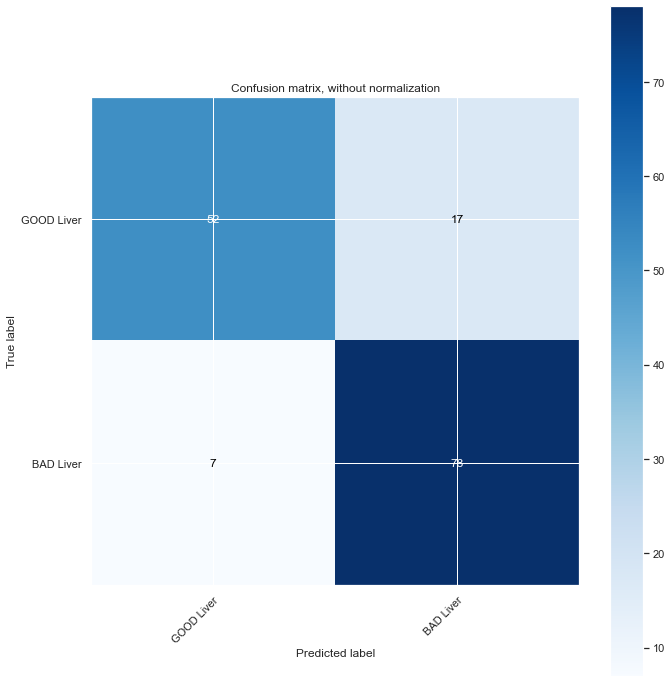

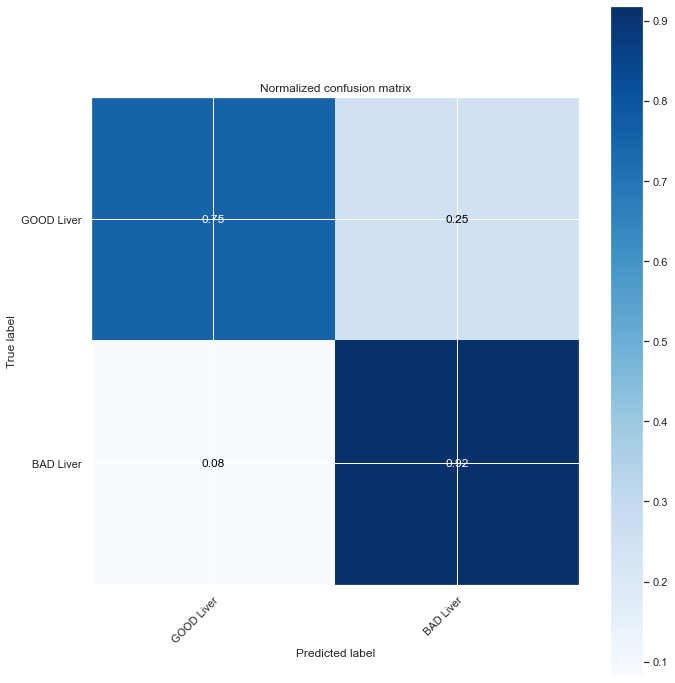

In [76]:
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import confusion_matrix
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
Y_pred=LiverModel2.predict(X_test)
def plot_confusion_matrix(Y_test,Y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(Y_test,Y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(Y_test,Y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


np.set_printoptions(precision=2)

class_names = np.array(['GOOD Liver','BAD Liver'])

# Plot non-normalized confusion matrix
plot_confusion_matrix(Y_test,Y_pred, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(Y_test,Y_pred, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

0.8896845694799659


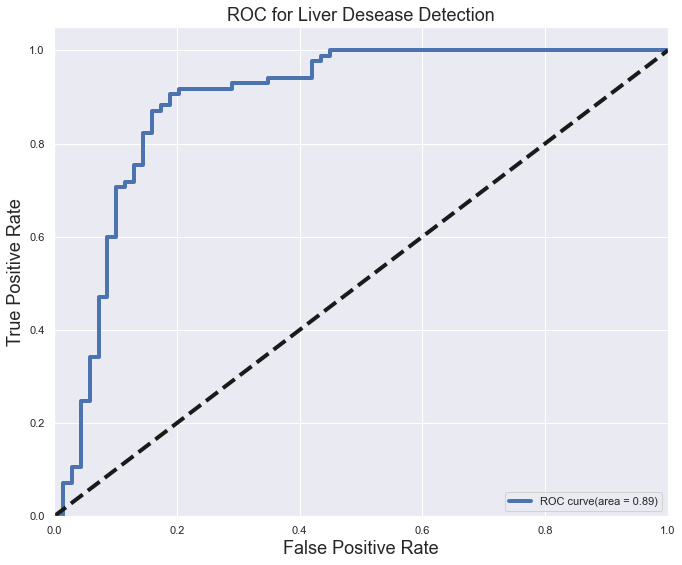

In [77]:
from sklearn.metrics import roc_curve, auc
#plt.style.use('seaborn-pastel')
Y_score = LiverModel2.decision_function(X_test)

FPR, TPR, _ = roc_curve(Y_test, Y_score)
ROC_AUC = auc(FPR, TPR)
print (ROC_AUC)

plt.figure(figsize =[11,9])
plt.plot(FPR, TPR, label= 'ROC curve(area = %0.2f)'%ROC_AUC, linewidth= 4)
plt.plot([0,1],[0,1], 'k--', linewidth = 4)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate', fontsize = 18)
plt.ylabel('True Positive Rate', fontsize = 18)
plt.title('ROC for Liver Desease Detection', fontsize= 18)
plt.legend(loc="lower right")
plt.show()

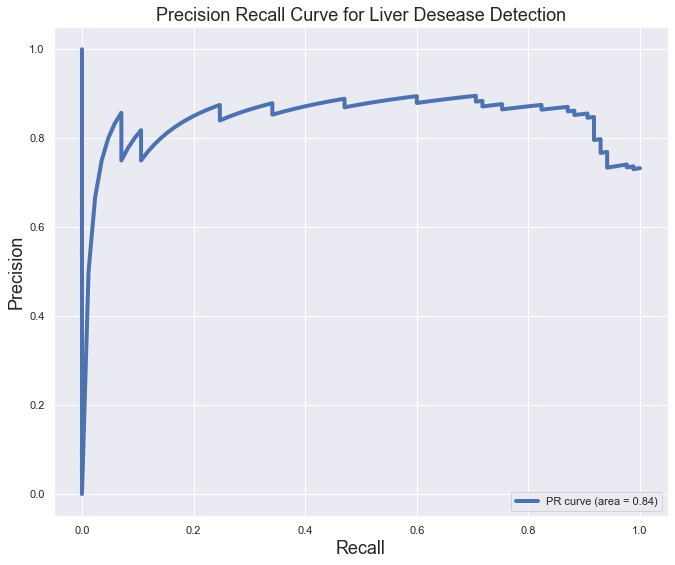

In [78]:
from sklearn.metrics import precision_recall_curve

Y_score = LiverModel2.decision_function(X_test)

precision, recall, _ = precision_recall_curve(Y_test, Y_score)
PR_AUC = auc(recall, precision)

plt.figure(figsize=[11,9])
plt.plot(recall, precision, label='PR curve (area = %0.2f)' % PR_AUC, linewidth=4)
plt.xlabel('Recall', fontsize=18)
plt.ylabel('Precision', fontsize=18)
plt.title('Precision Recall Curve for Liver Desease Detection', fontsize=18)
plt.legend(loc="lower right")
plt.show()

In [79]:
# Another Way of Doing Hypertuning
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import StratifiedShuffleSplit
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=403)
# Logistic Reg CV
LRCV1 = LogisticRegressionCV(cv=cv, random_state=403, Cs=C_List, solver='saga', penalty='l2',class_weight='balanced')
LRCV1.fit(X_train,Y_train)
print("The Accuracy is:",LRCV1.score(X_test,Y_test))
Pred_Proba_T=LRCV1.predict_proba(X_test)
Log_Loss_T=log_loss(Y_test,Pred_Proba_T)
print("The Log Loss is:",Log_Loss_T)
print("The Optimal C parameter is:",LRCV1.C_)

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

The Accuracy is: 0.8376623376623377
The Log Loss is: 0.44147797637237424
The Optimal C parameter is: [1.]


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


In [80]:
# For class_weight balanced
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,LRCV1.predict(X_test)))

              precision    recall  f1-score   support

           0       0.88      0.74      0.80        69
           1       0.81      0.92      0.86        85

    accuracy                           0.84       154
   macro avg       0.85      0.83      0.83       154
weighted avg       0.84      0.84      0.84       154



In [81]:
from sklearn.metrics import log_loss
# Running Logarithmic Loss-or Log Loss-or Cross Entropy Loss on training Data
#Predicted_Proba_Y = TitanicModel2.predict(X_train)
Predicted_Proba_Y = LRCV1.predict_proba(X_train)
print("The Log Loss on Training is: ", log_loss(Y_train, Predicted_Proba_Y))

# Running Logarithmic Loss-or Log Loss-or Cross Entropy Loss on testing Data
Predicted_Proba_Y = LRCV1.predict_proba(X_test)
print("The Log Loss on Testing is: ", log_loss(Y_test, Predicted_Proba_Y)) # Log-Loss has been Down
                                                                           # so our prediction is very good

The Log Loss on Training is:  0.5348207812374014
The Log Loss on Testing is:  0.44147797637237424


In [82]:
## Using StratifiedShuffleSplit No of Splits always should be 5 for 80% Train & 20% Test Split Pattern
## Always Provide test_size=.20
## We can use KFold, StratifiedShuffleSplit, StratiriedKFold or ShuffleSplit, They are all close cousins. look at sklearn userguide for more info.   
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score
cv = StratifiedShuffleSplit(n_splits = 5, test_size=.20, random_state=403) # run model 10x with 60/30 split intentionally leaving out 10%
accuracies = cross_val_score(LogisticRegression(solver='saga', class_weight='balanced', C=6660.846291, penalty='l2'), Features, Label, cv = cv)
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),5)))

Cross-Validation accuracy scores:[0.7  0.75 0.8  0.79 0.69]
Mean Cross-Validation accuracy score: 0.74675


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

In [83]:
## Using StratifiedShuffleSplit No of Splits always should be 5 for 80% Train & 20% Test Split Pattern
## Always Provide test_size=.20
## We can use KFold, StratifiedShuffleSplit, StratiriedKFold or ShuffleSplit, They are all close cousins. look at sklearn userguide for more info.   
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score
cv = StratifiedShuffleSplit(n_splits = 5, test_size=.20, random_state=403) # run model 10x with 60/30 split intentionally leaving out 10%
accuracies = cross_val_score(LogisticRegression(solver='saga', class_weight='balanced', C=443.668733, penalty='l2'), Features, Label, cv = cv)
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),5)))

Cross-Validation accuracy scores:[0.71 0.75 0.8  0.79 0.69]
Mean Cross-Validation accuracy score: 0.74805


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means

The Accuracy of C parameter 1e-05 is 0.8051948051948052:
The Log Loss of C parameter 1e-05 is 0.6926588388259851:



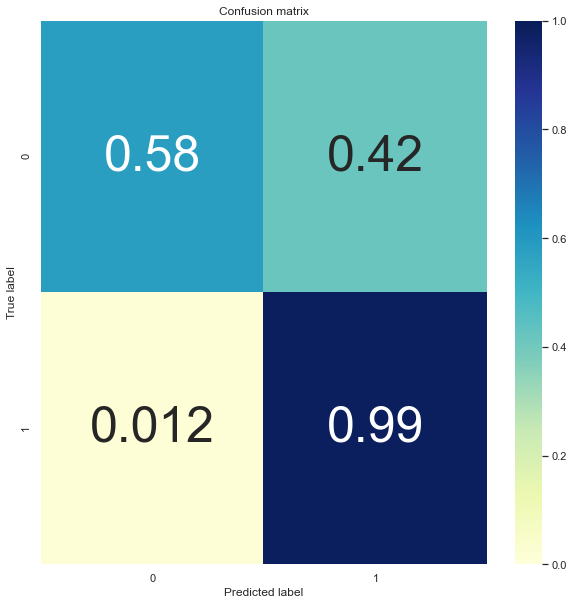

The Accuracy of C parameter 1.968419447286611e-05 is 0.8116883116883117:
The Log Loss of C parameter 1.968419447286611e-05 is 0.6921969703842291:



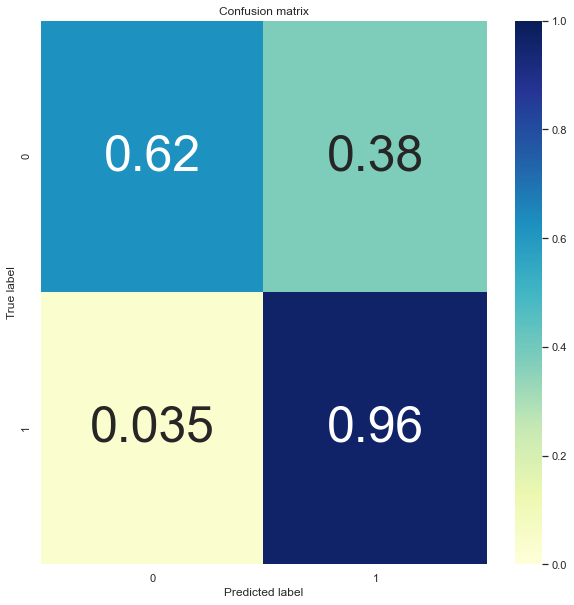

The Accuracy of C parameter 3.874675120456128e-05 is 0.8181818181818182:
The Log Loss of C parameter 3.874675120456128e-05 is 0.6912992526161471:



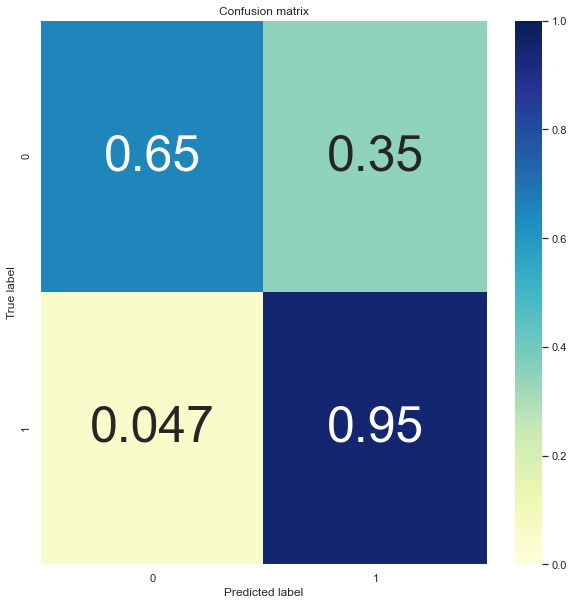

The Accuracy of C parameter 7.626985859023451e-05 is 0.8181818181818182:
The Log Loss of C parameter 7.626985859023451e-05 is 0.6895487488814275:



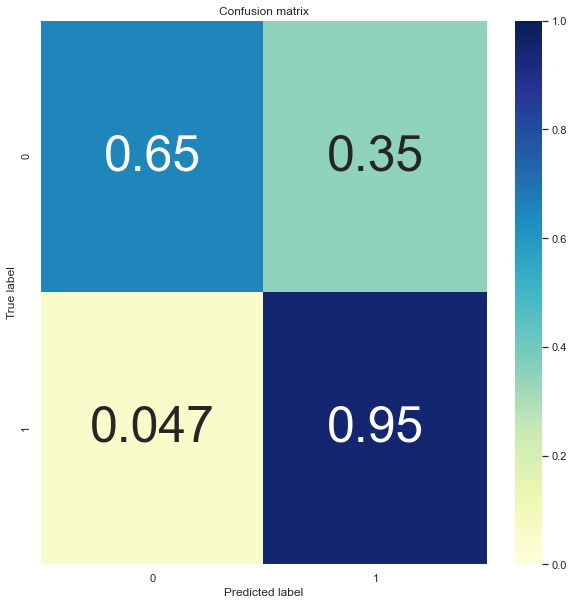

The Accuracy of C parameter 0.00015013107289081742 is 0.8246753246753247:
The Log Loss of C parameter 0.00015013107289081742 is 0.686210558882694:



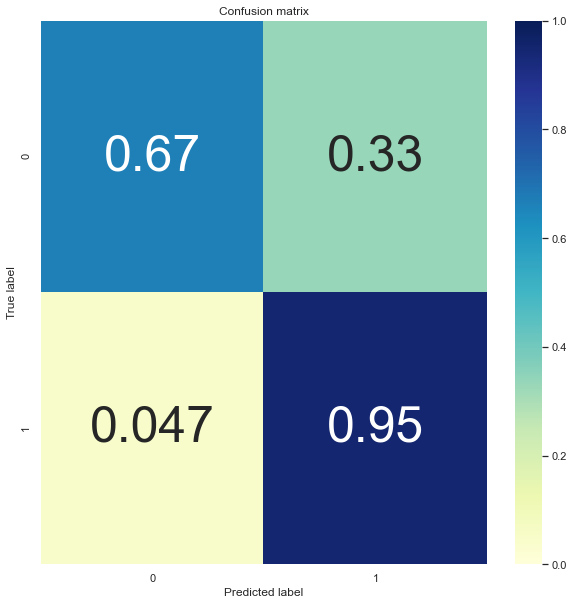

The Accuracy of C parameter 0.0002955209235202888 is 0.8246753246753247:
The Log Loss of C parameter 0.0002955209235202888 is 0.6800190887587124:



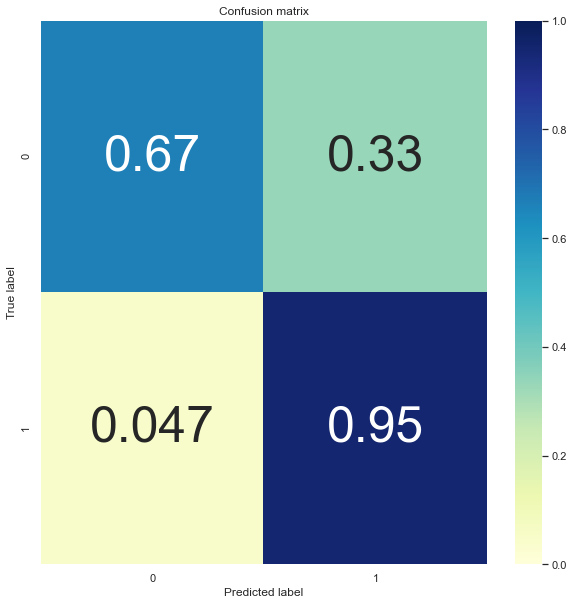

The Accuracy of C parameter 0.0005817091329374358 is 0.8311688311688312:
The Log Loss of C parameter 0.0005817091329374358 is 0.6691258875276159:



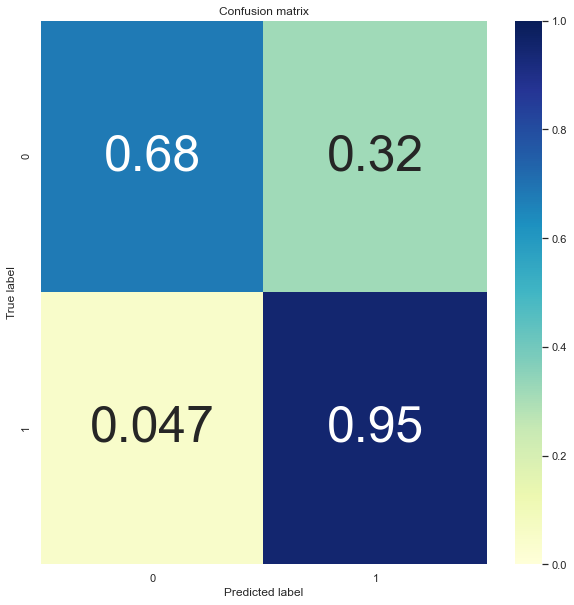

The Accuracy of C parameter 0.0011450475699382823 is 0.8311688311688312:
The Log Loss of C parameter 0.0011450475699382823 is 0.6515879519473948:



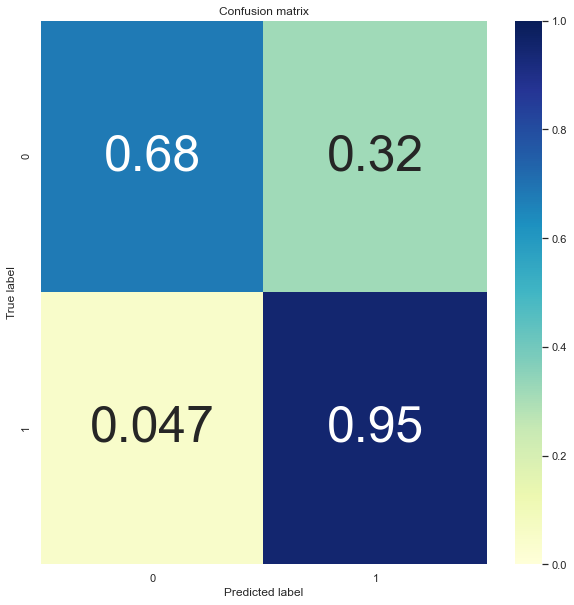

The Accuracy of C parameter 0.002253933904734791 is 0.8246753246753247:
The Log Loss of C parameter 0.002253933904734791 is 0.6267755906682335:



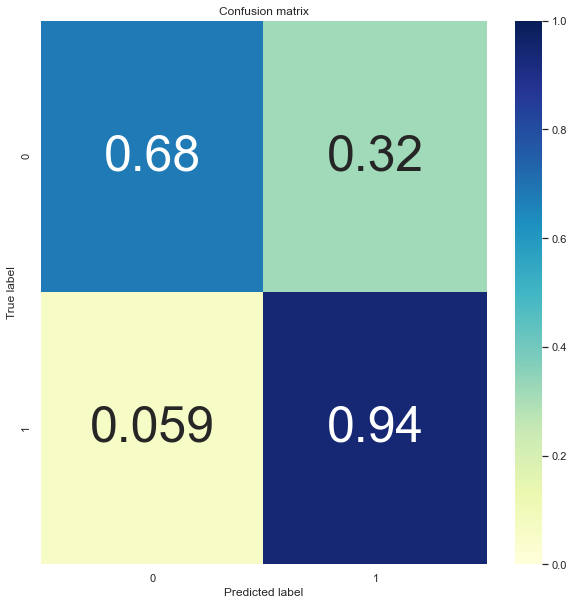

The Accuracy of C parameter 0.004436687330978612 is 0.8376623376623377:
The Log Loss of C parameter 0.004436687330978612 is 0.5966171430475969:



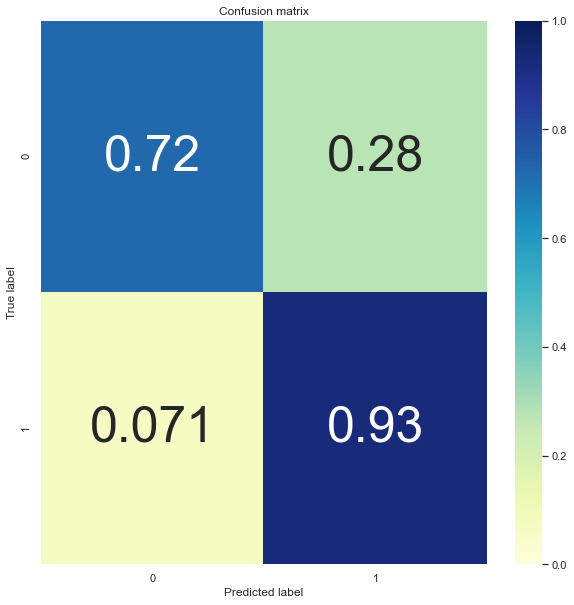

The Accuracy of C parameter 0.008733261623828438 is 0.8506493506493507:
The Log Loss of C parameter 0.008733261623828438 is 0.5647612400744894:



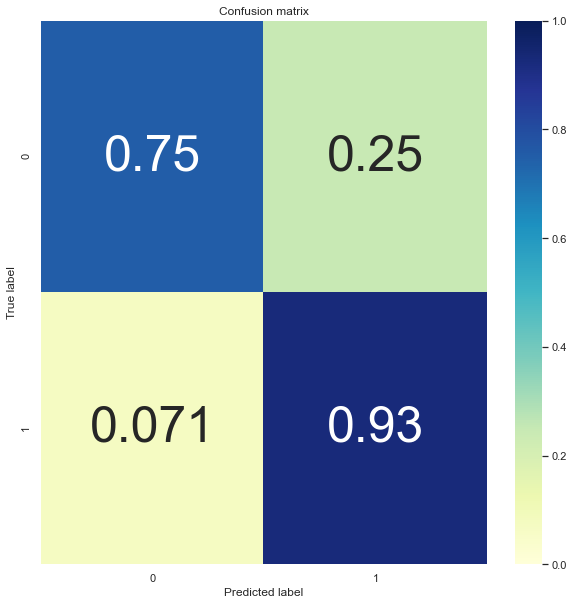

The Accuracy of C parameter 0.017190722018585746 is 0.8376623376623377:
The Log Loss of C parameter 0.017190722018585746 is 0.5344939437597368:



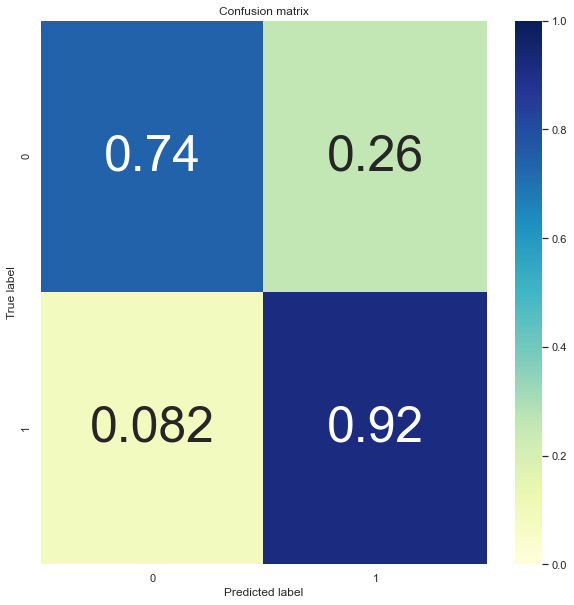

The Accuracy of C parameter 0.033838551534282335 is 0.8376623376623377:
The Log Loss of C parameter 0.033838551534282335 is 0.5077746466321416:



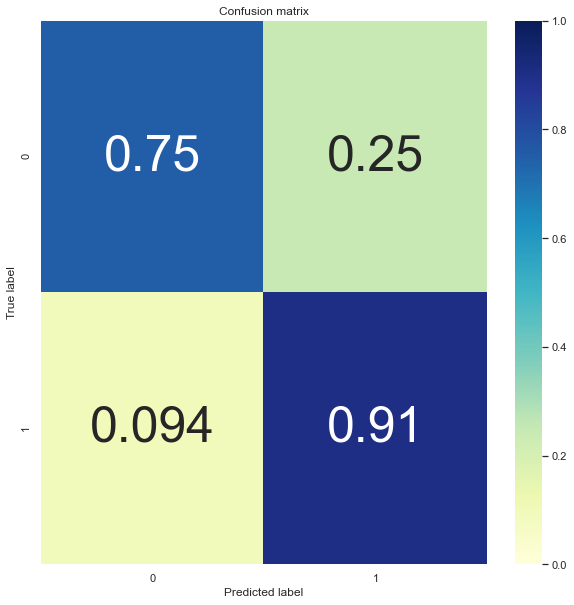

The Accuracy of C parameter 0.06660846290809161 is 0.8311688311688312:
The Log Loss of C parameter 0.06660846290809161 is 0.48555074783475033:



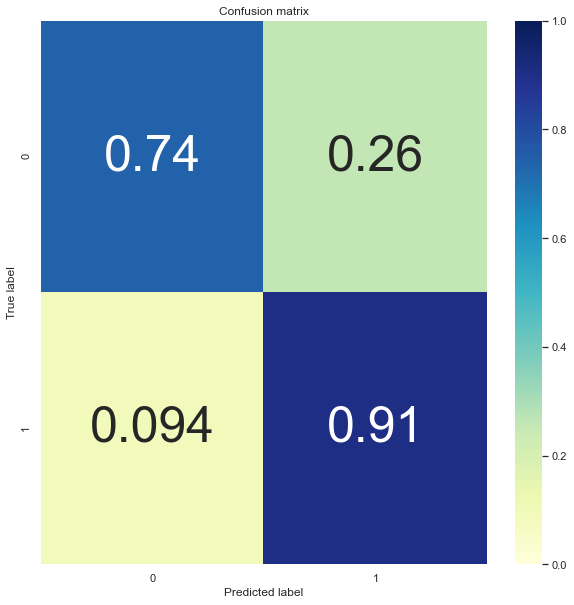

The Accuracy of C parameter 0.13111339374215658 is 0.8311688311688312:
The Log Loss of C parameter 0.13111339374215658 is 0.4681213100963695:



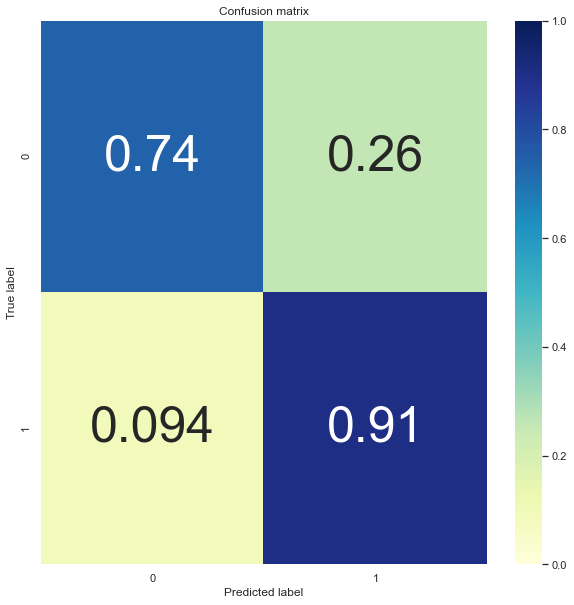

The Accuracy of C parameter 0.2580861540418077 is 0.8311688311688312:
The Log Loss of C parameter 0.2580861540418077 is 0.45534102299012696:



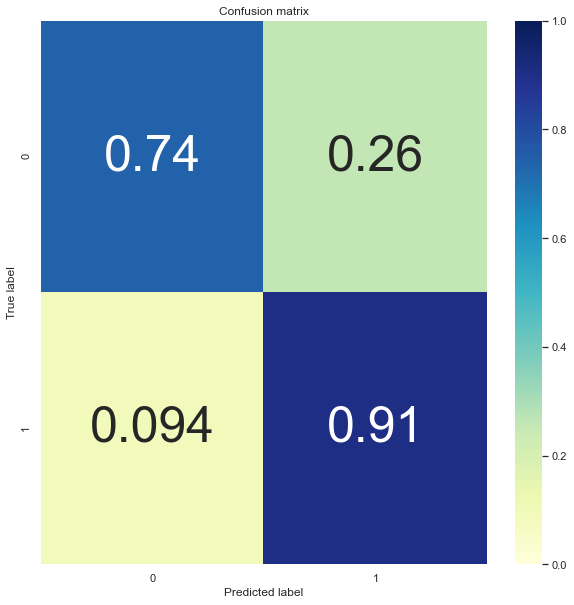

The Accuracy of C parameter 0.5080218046913023 is 0.8311688311688312:
The Log Loss of C parameter 0.5080218046913023 is 0.4467285198760041:



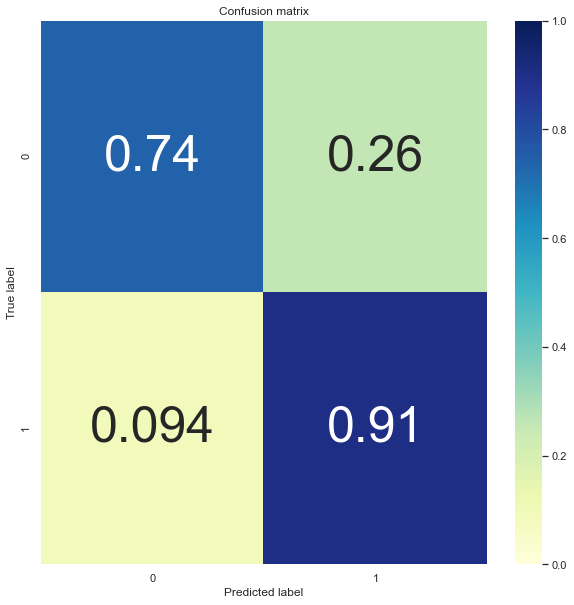

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 1.0 is 0.8376623376623377:
The Log Loss of C parameter 1.0 is 0.4414934644139577:



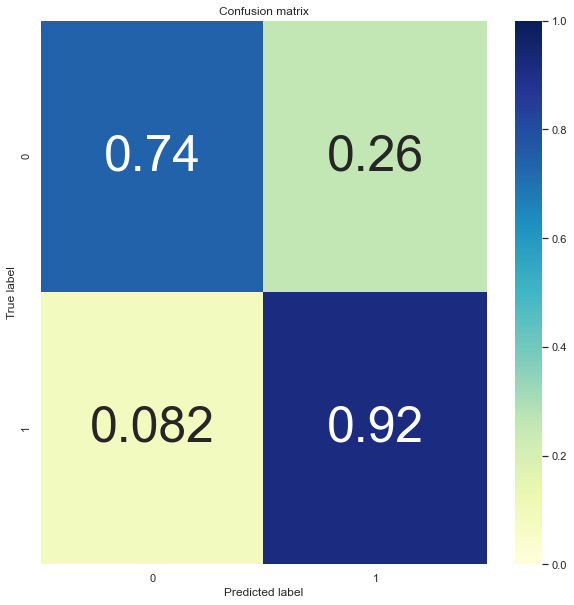

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 1.9684194472866112 is 0.8376623376623377:
The Log Loss of C parameter 1.9684194472866112 is 0.4386236792102158:



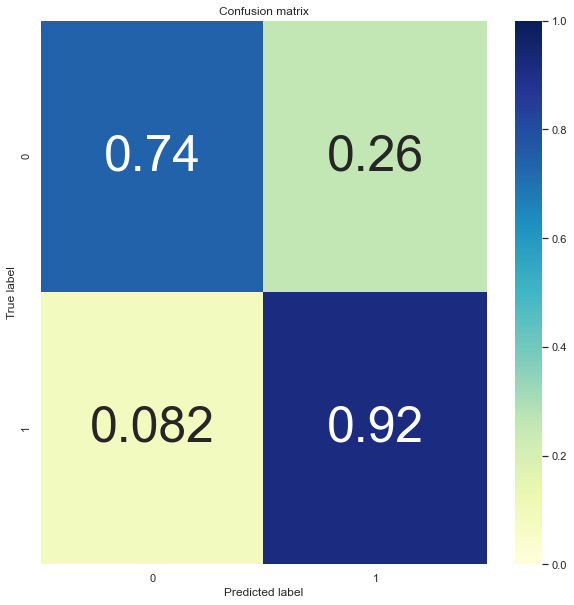

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 3.874675120456136 is 0.8441558441558441:
The Log Loss of C parameter 3.874675120456136 is 0.4371461857675279:



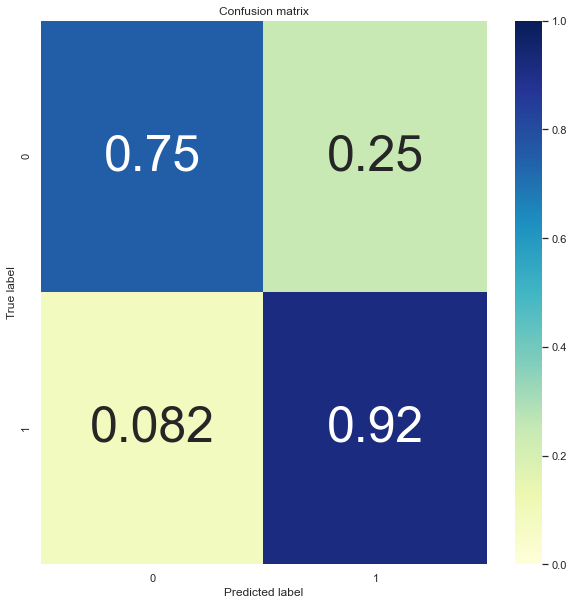

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 7.626985859023452 is 0.8441558441558441:
The Log Loss of C parameter 7.626985859023452 is 0.436403911498307:



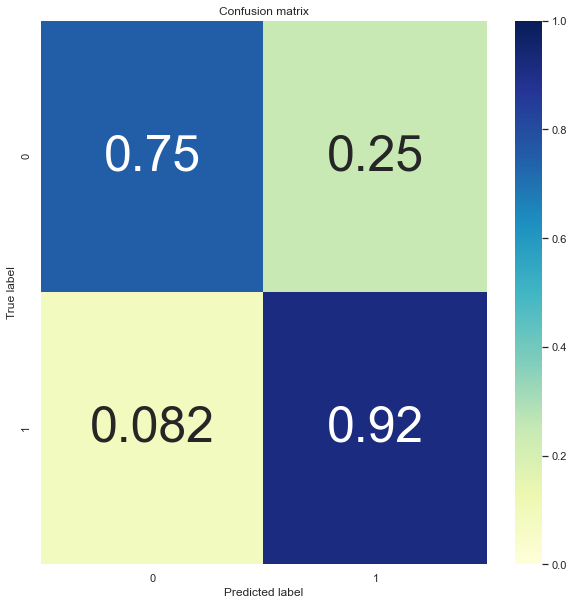

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 15.013107289081743 is 0.8441558441558441:
The Log Loss of C parameter 15.013107289081743 is 0.4360319589014405:



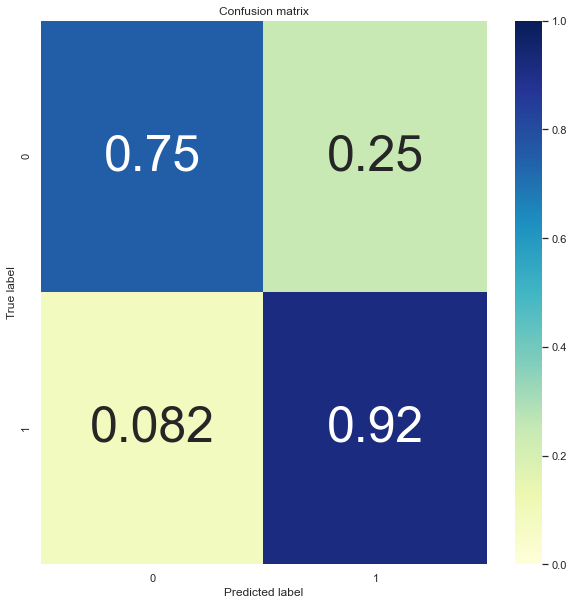

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 29.55209235202888 is 0.8441558441558441:
The Log Loss of C parameter 29.55209235202888 is 0.43584484274648183:



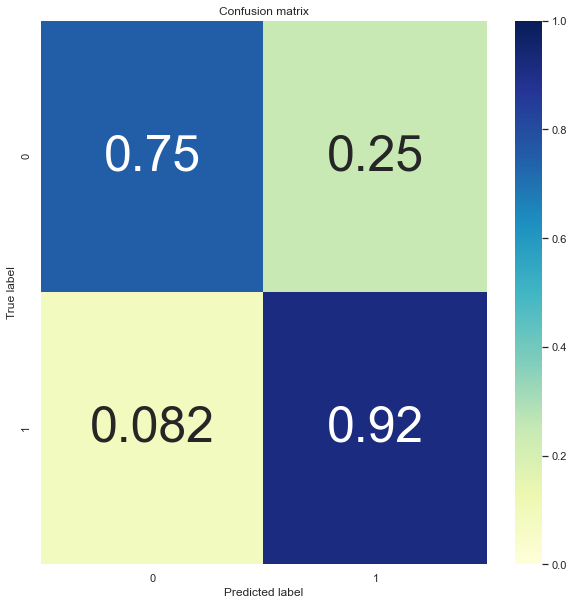

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 58.170913293743574 is 0.8441558441558441:
The Log Loss of C parameter 58.170913293743574 is 0.4357503378731018:



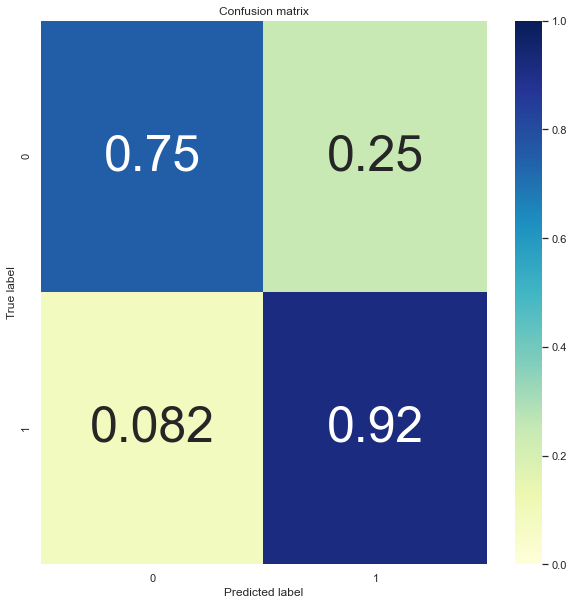

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 114.50475699382812 is 0.8441558441558441:
The Log Loss of C parameter 114.50475699382812 is 0.4357024814269006:



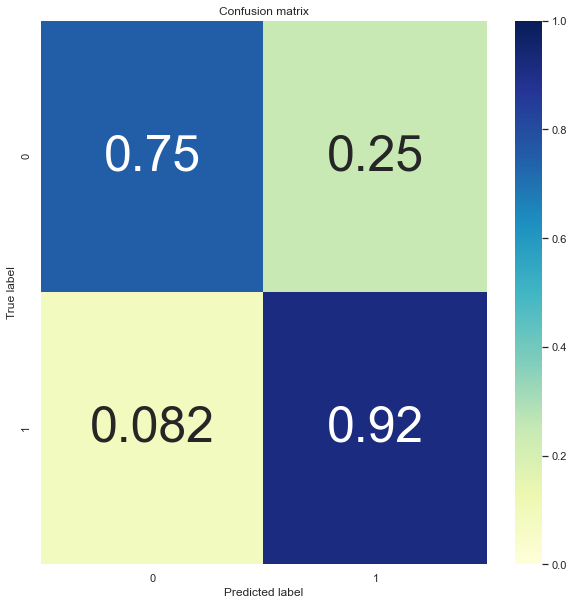

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 225.39339047347934 is 0.8441558441558441:
The Log Loss of C parameter 225.39339047347934 is 0.4356782105822807:



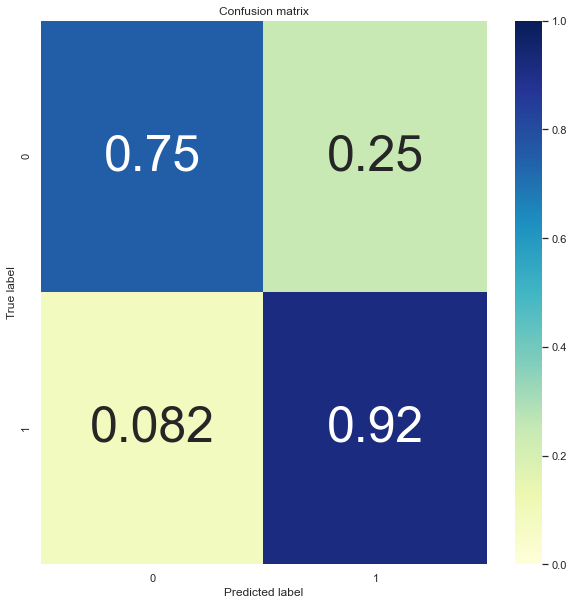

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 443.66873309786155 is 0.8441558441558441:
The Log Loss of C parameter 443.66873309786155 is 0.43566589131729666:



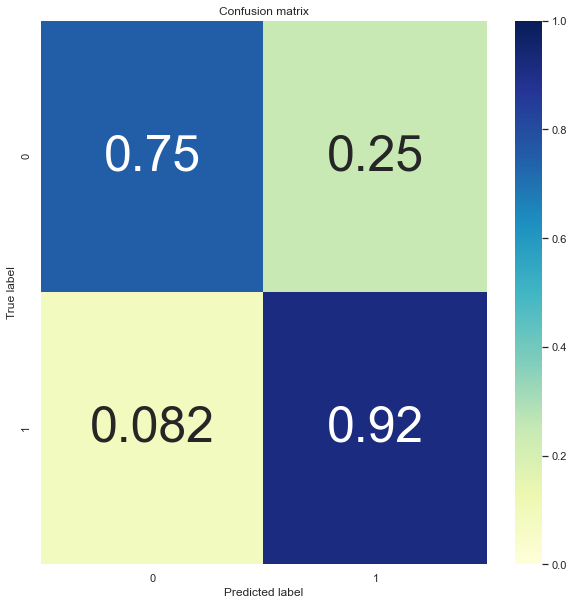

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 873.3261623828438 is 0.8441558441558441:
The Log Loss of C parameter 873.3261623828438 is 0.43565963568975197:



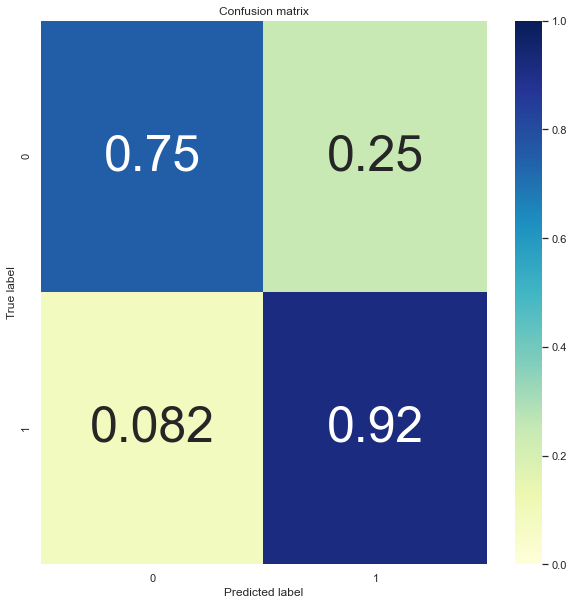

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 1719.0722018585782 is 0.8441558441558441:
The Log Loss of C parameter 1719.0722018585782 is 0.4356564584278595:



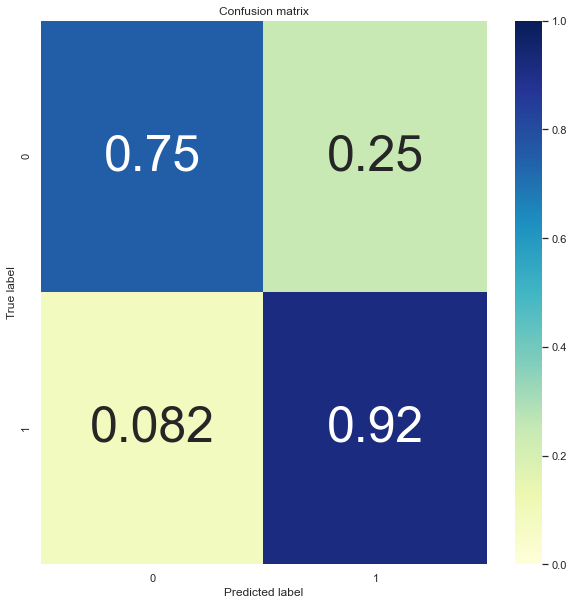

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 3383.8551534282333 is 0.8441558441558441:
The Log Loss of C parameter 3383.8551534282333 is 0.43565484449925906:



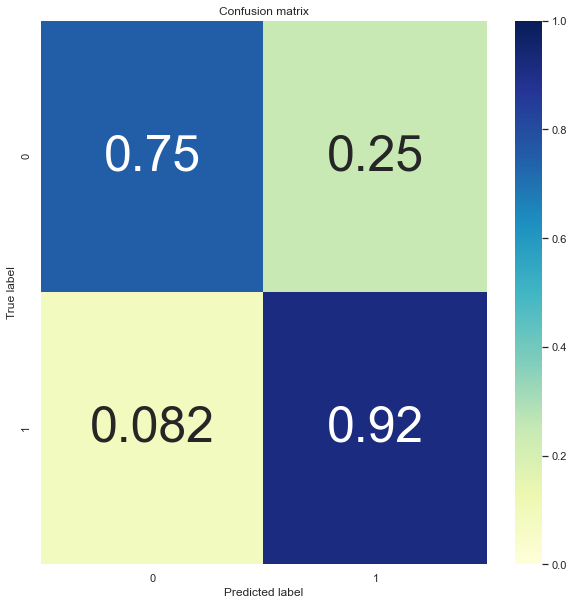

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 6660.846290809168 is 0.8441558441558441:
The Log Loss of C parameter 6660.846290809168 is 0.435654024637383:



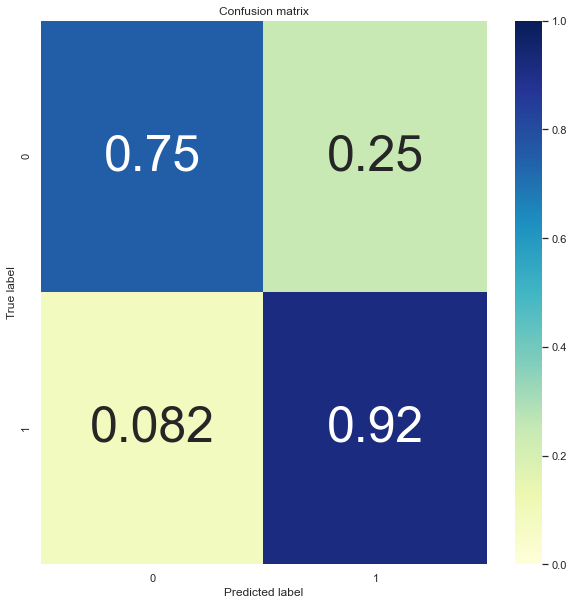

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 13111.33937421563 is 0.8441558441558441:
The Log Loss of C parameter 13111.33937421563 is 0.4356536081423111:



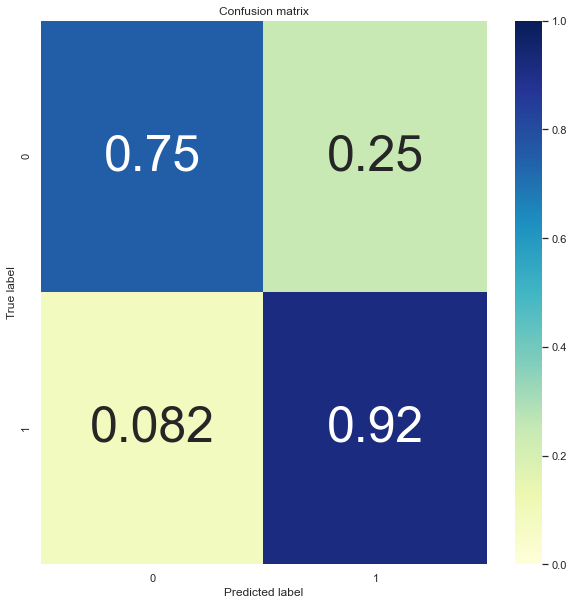

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 25808.615404180768 is 0.8441558441558441:
The Log Loss of C parameter 25808.615404180768 is 0.43565339655701524:



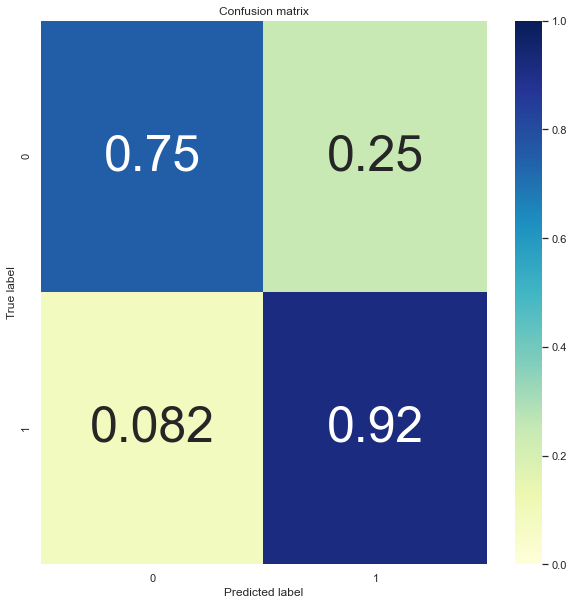

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 50802.18046913033 is 0.8441558441558441:
The Log Loss of C parameter 50802.18046913033 is 0.4356532890679006:



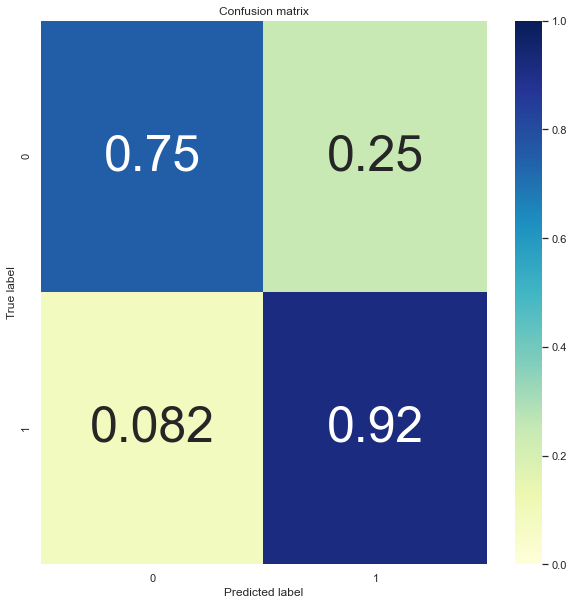

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


The Accuracy of C parameter 100000.0 is 0.8441558441558441:
The Log Loss of C parameter 100000.0 is 0.43565323446131704:



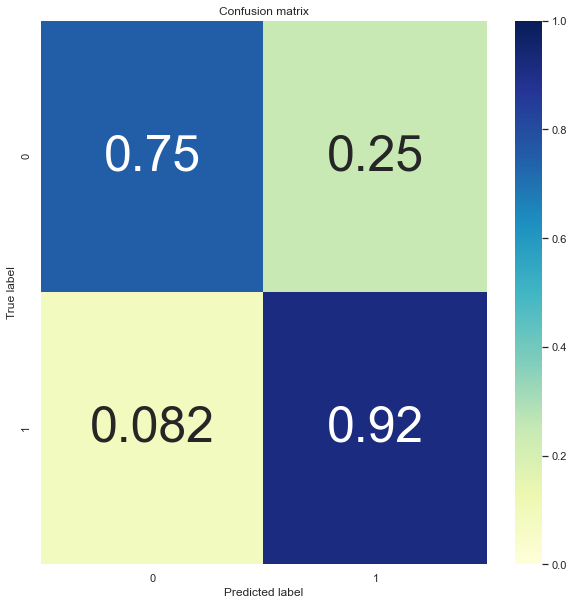

In [84]:
# Looping Over The Parametres & Checking the Confusion Matrixes
# Here we have selected geomspace range for C value because it is probably best for finding Global Minimum Loss
# Confusion Matrix function
def plot_confusion_matrix(cm, classes=None, title='Confusion matrix'):
    """Plots a confusion matrix."""
    if classes is not None:
        sns.heatmap(cm, cmap="YlGnBu", xticklabels=classes, yticklabels=classes, vmin=0., vmax=1., annot=True, annot_kws={'size':50})
    else:
        sns.heatmap(cm, vmin=0., vmax=1.)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

    
C_List = geomspace(1e-5,1e5,num=35)
Accuracy = []
Log_Loss = []
for c in C_List:
    LiverModel2=LogisticRegression(random_state=403,solver='saga', class_weight='balanced', C=c, penalty='l2')
    LiverModel2.fit(X_train,Y_train)
    Score=LiverModel2.score(X_test,Y_test)
    Accuracy.append(Score)
    print("The Accuracy of C parameter {} is {}:".format(c,Score))
    Predicted_Proba_Y = LiverModel2.predict_proba(X_test)
    Log_Loss2 = log_loss(Y_test,Predicted_Proba_Y)
    Log_Loss.append(Log_Loss2)
    print("The Log Loss of C parameter {} is {}:".format(c, Log_Loss2))
    print("")
    Y_pred = LiverModel2.predict(X_test)
    cm = confusion_matrix(Y_test, Y_pred)
    cm_norm = cm / cm.sum(axis=1).reshape(-1,1)
    plot_confusion_matrix(cm_norm, classes = LiverModel2.classes_, title='Confusion matrix')
    plt.show()

In [85]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
## C_vals is the alpla value of lasso and ridge regression(as alpha increases the model complexity decreases,)
## remember effective alpha scores are 0<alpha<infinity 
C_vals = [0.1, 0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,2,3,4,5,6,7,8,9,10,12,13,14,15,16,16.5,17,17.5,18]
## Choosing penalties(Lasso(l1) or Ridge(l2))
## Choose a cross validation strategy. 
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=403)

## setting param for param_grid in GridSearchCV. 
param = {'C': C_vals}

## Calling on GridSearchCV object. 
LiverModel = GridSearchCV(estimator=LogisticRegression(solver='saga', class_weight='balanced', penalty='l2'), 
                           param_grid = param,
                           scoring = 'accuracy',
                            n_jobs =-1,
                           cv = cv
                          )
## Fitting the model
LiverModel.fit(X_train, Y_train)

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=403, test_size=0.2,
            train_size=None),
             estimator=LogisticRegression(class_weight='balanced',
                                          solver='saga'),
             n_jobs=-1,
             param_grid={'C': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1,
                               2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16,
                               16.5, 17, 17.5, 18]},
             scoring='accuracy')

In [86]:
## Getting the best of everything.
print(LiverModel.best_score_)
print(LiverModel.best_params_)
print(LiverModel.best_estimator_)

0.7008130081300813
{'C': 0.8}
LogisticRegression(C=0.8, class_weight='balanced', solver='saga')


In [87]:
LiverModel = LiverModel.best_estimator_
LiverModel.score(X_test, Y_test)

0.8376623376623377

In [88]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,LiverModel.predict(X_test)),\
            columns=["Predicted GOOD Liver", "Predicted BAD Liver"],\
            index=["GOOD Liver","BAD Liver"] )

,Predicted GOOD Liver,Predicted BAD Liver
GOOD Liver,51,18
BAD Liver,7,78


In [89]:
from sklearn.metrics import recall_score
recall_score(Y_test,LiverModel.predict(X_test))

0.9176470588235294

In [90]:
from sklearn.metrics import precision_score
precision_score(Y_test,LiverModel.predict(X_test))

0.8125

In [91]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,LiverModel.predict(X_test)))

              precision    recall  f1-score   support

           0       0.88      0.74      0.80        69
           1       0.81      0.92      0.86        85

    accuracy                           0.84       154
   macro avg       0.85      0.83      0.83       154
weighted avg       0.84      0.84      0.84       154



# Support Vector Machine

In [92]:
#"Age","Fare","Average_Fare","Family_Size","Age_Group" Column Will Be Removed because they have very Low Correlation value with "Survived".
#"Family_Group"
#DataFrame Separation for Encoding
#CAR1 will be 1D Series
#CAR2 & CAR3 will remain 2D DataFrame only
#Test1
Label=Liver['Dataset']
Continuous=Liver[['Age','Total_Bilirubin','Direct_Bilirubin','Alkaline_Phosphotase','Alamine_Aminotransferase','Aspartate_Aminotransferase','Albumin','Albumin_and_Globulin_Ratio']]
Nominal=Liver[['Gender']]

In [93]:
# Continuous Feature Scaling(Scaling of features)
# Continuous Features will be in 2D Array
from sklearn.preprocessing import StandardScaler
StandardScaler = StandardScaler()
Continuous=StandardScaler.fit_transform(Continuous) #Scaling of Features part for optimisation

# Check data type and dimention
# While Converting into DataFrame always provide columns name
Continuous=DataFrame(Continuous,columns=['Age','Total_Bilirubin','Direct_Bilirubin','Alkaline_Phosphotase','Alamine_Aminotransferase','Aspartate_Aminotransferase','Albumin','Albumin_and_Globulin_Ratio']) #Converting Features into 2D DataFrame
type(Continuous),ndim(Continuous),Continuous.shape

(pandas.core.frame.DataFrame, 2, (766, 8))

In [94]:
#Final ConCatination For Creating Features
#Features will be 2D DataFrame
Features=concat([Continuous,Nominal],axis=1)
Features

,Age,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Albumin,Albumin_and_Globulin_Ratio,Gender
0,1.300310,-0.358488,-0.428685,-0.364146,-0.318104,-0.279887,0.113164,-0.247019,0
1,1.118363,1.504558,1.750622,2.020559,-0.014523,0.044382,-0.016733,-0.778668,1
2,1.118363,0.847012,1.185617,1.047115,-0.039822,-0.082162,0.113164,-0.280247,1
3,0.875767,-0.303693,-0.307612,-0.387434,-0.330754,-0.271978,0.243060,0.085261,1
4,1.724853,0.225997,0.338108,-0.326885,-0.248534,-0.117752,-1.055906,-1.908421,1
5,0.147980,-0.157572,-0.186540,-0.266336,-0.299131,-0.295705,1.542026,1.082102,1
6,-1.064999,-0.321958,-0.388328,-0.517848,-0.318104,-0.303614,0.372957,0.085261,0
7,-0.883052,-0.321958,-0.347970,-0.294282,-0.330754,-0.307569,0.502853,0.417541,0
8,-1.610839,-0.321958,-0.347970,-0.294282,-0.280157,-0.275933,1.152336,0.749821,1
9,0.693821,-0.358488,-0.388328,0.115589,-0.084094,-0.121707,0.243060,0.085261,1


In [103]:
# Kernel Selection Process
from sklearn import svm
from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
kernel_list = ['linear','poly','rbf','sigmoid']
params = dict(kernel=kernel_list)
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=403)

Liver_SVM_Solver_Select = svm.SVC(C=1.0, random_state=403, class_weight='balanced')
Kernel_Type = GridSearchCV(Liver_SVM_Solver_Select, params, cv=cv)
Kernel_Type.fit(X_train, Y_train)
scores = Kernel_Type.cv_results_['mean_test_score']

for score, kernel in zip(scores, kernel_list):
    print(f"  {kernel} {score:.3f}" )

  linear 0.680
  poly 0.657
  rbf 0.686
  sigmoid 0.647


In [102]:
# Looping Over The Parametres
# Here we have selected geomspace range for C value because it is probably best for finding Global Minimum Loss
Degree = [1,2,3,4,5,6,7,8,9,10]
params = dict(degree=Degree)
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=403)
Liver_Poly_Degree_Select = svm.SVC(C=1.0, random_state=403, class_weight='balanced', kernel='poly')
Degree_Type = GridSearchCV(Liver_Poly_Degree_Select, params, cv=cv)
Degree_Type.fit(X_train, Y_train)
scores = Degree_Type.cv_results_['mean_test_score']

for score, degree in zip(scores, Degree):
    print(f"  {degree} {score:.3f}" )

  1 0.673
  2 0.655
  3 0.657
  4 0.641
  5 0.624
  6 0.618
  7 0.624
  8 0.620
  9 0.623
  10 0.618


In [101]:
# Kernel Selection Process
from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
kernel_list = ['linear','poly','rbf','sigmoid']
params = dict(kernel=kernel_list)
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=403)

Liver_SVM_Solver_Select = svm.SVC(C=1.0, random_state=403, class_weight='balanced',degree=1)
Kernel_Type = GridSearchCV(Liver_SVM_Solver_Select, params, cv=cv)
Kernel_Type.fit(X_train, Y_train)
scores = Kernel_Type.cv_results_['mean_test_score']

for score, kernel in zip(scores, kernel_list):
    print(f"  {kernel} {score:.3f}" )

  linear 0.680
  poly 0.673
  rbf 0.686
  sigmoid 0.647


In [104]:
# Looping Over The Parametres
# Here we have selected geomspace range for C value because it is probably best for finding Global Minimum Loss
Kernel=['linear','poly','rbf','sigmoid']
for i in Kernel:
    model=svm.SVC(kernel=i,class_weight='balanced',gamma='scale',degree=1)
    model.fit(X_train,Y_train)
    print('For kernel:',i)
    print('Accuracy is:',model.score(X_test,Y_test))

For kernel: linear
Accuracy is: 0.8051948051948052
For kernel: poly
Accuracy is: 0.7857142857142857
For kernel: rbf
Accuracy is: 0.8246753246753247
For kernel: sigmoid
Accuracy is: 0.7532467532467533


In [105]:
## Using StratifiedShuffleSplit No of Splits always should be 5 for 80% Train & 20% Test Split Pattern
## Always give test_size=.20
## We can use KFold, StratifiedShuffleSplit, StratiriedKFold or ShuffleSplit, They are all close cousins. look at sklearn userguide for more info.   
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score
cv = StratifiedShuffleSplit(n_splits = 5, test_size=.20, random_state=403) # run model 10x with 60/30 split intentionally leaving out 10%
accuracies = cross_val_score(svm.SVC(kernel = 'linear', class_weight='balanced'), Features, Label, cv = cv)
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),5)))

Cross-Validation accuracy scores:[0.73 0.71 0.77 0.75 0.7 ]
Mean Cross-Validation accuracy score: 0.73117


In [106]:
## Using StratifiedShuffleSplit No of Splits always should be 5 for 80% Train & 20% Test Split Pattern
## Always give test_size=.20
## We can use KFold, StratifiedShuffleSplit, StratiriedKFold or ShuffleSplit, They are all close cousins. look at sklearn userguide for more info.   
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score
cv = StratifiedShuffleSplit(n_splits = 5, test_size=.20, random_state=403) # run model 10x with 60/30 split intentionally leaving out 10%
accuracies = cross_val_score(svm.SVC(kernel = 'rbf', class_weight='balanced'), Features, Label, cv = cv)
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),5)))

Cross-Validation accuracy scores:[0.72 0.75 0.78 0.79 0.72]
Mean Cross-Validation accuracy score: 0.75065


In [107]:
# Looping Over The Parametres
# Here we have selected geomspace range for C value because it is probably best for finding Global Minimum Loss
X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=403)
Degree = [1.00e+04, 6.87e+03, 4.71e+03, 3.24e+03, 2.22e+03, 1.53e+03,
        1.05e+03, 7.20e+02, 4.94e+02, 3.39e+02, 2.33e+02, 1.60e+02,
        1.10e+02, 7.54e+01, 5.18e+01, 3.56e+01, 2.44e+01, 1.68e+01,
        1.15e+01, 7.91e+00, 5.43e+00, 3.73e+00, 2.56e+00, 1.76e+00,
        1.21e+00, 8.29e-01, 5.69e-01, 3.91e-01, 2.68e-01, 1.84e-01,
        1.26e-01, 8.69e-02, 5.96e-02, 4.09e-02, 2.81e-02, 1.93e-02,
        1.33e-02, 9.10e-03, 6.25e-03, 4.29e-03, 2.95e-03, 2.02e-03,
        1.39e-03, 9.54e-04, 6.55e-04, 4.50e-04, 3.09e-04, 2.12e-04,
        1.46e-04, 1.00e-04]
params = dict(C=Degree)
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=403)
Liver_Linear_Degree_Select = svm.SVC(random_state=403, class_weight='balanced', kernel='linear',gamma='scale')
Degree_Type = GridSearchCV(Liver_Linear_Degree_Select, params, cv=cv)
Degree_Type.fit(X_train, Y_train)
scores = Degree_Type.cv_results_['mean_test_score']

for score, C in zip(scores, Degree):
    print(f"  {C} {score:.3f}" )

  10000.0 0.683
  6870.0 0.683
  4710.0 0.683
  3240.0 0.681
  2220.0 0.681
  1530.0 0.683
  1050.0 0.683
  720.0 0.683
  494.0 0.683
  339.0 0.683
  233.0 0.683
  160.0 0.683
  110.0 0.683
  75.4 0.683
  51.8 0.683
  35.6 0.683
  24.4 0.683
  16.8 0.681
  11.5 0.676
  7.91 0.675
  5.43 0.676
  3.73 0.676
  2.56 0.675
  1.76 0.676
  1.21 0.678
  0.829 0.675
  0.569 0.675
  0.391 0.673
  0.268 0.676
  0.184 0.672
  0.126 0.675
  0.0869 0.685
  0.0596 0.685
  0.0409 0.688
  0.0281 0.686
  0.0193 0.686
  0.0133 0.680
  0.0091 0.667
  0.00625 0.650
  0.00429 0.629
  0.00295 0.618
  0.00202 0.597
  0.00139 0.584
  0.000954 0.550
  0.000655 0.535
  0.00045 0.550
  0.000309 0.610
  0.000212 0.512
  0.000146 0.512
  0.0001 0.512


In [108]:
# Looping Over The Parametres
# Here we have selected geomspace range for C value because it is probably best for finding Global Minimum Loss
C_List = geomspace(10000,0.0001,num=50)
for c in C_List:
    model1=svm.SVC(C=c,kernel='linear',class_weight='balanced',gamma='scale')
    model1.fit(X_train,Y_train)
    Train_Score=model1.score(X_train,Y_train)
    Test_Score=model1.score(X_test,Y_test)
    print("The Accuracy @ {} Degree parameter, Train Score is {} & Test Score is {}:".format(c,Train_Score,Test_Score))

The Accuracy @ 10000.0 Degree parameter, Train Score is 0.7124183006535948 & Test Score is 0.8181818181818182:
The Accuracy @ 6866.488450042998 Degree parameter, Train Score is 0.7140522875816994 & Test Score is 0.8181818181818182:
The Accuracy @ 4714.866363457394 Degree parameter, Train Score is 0.7140522875816994 & Test Score is 0.8181818181818182:
The Accuracy @ 3237.457542817643 Degree parameter, Train Score is 0.7140522875816994 & Test Score is 0.8181818181818182:
The Accuracy @ 2222.9964825261955 Degree parameter, Train Score is 0.7140522875816994 & Test Score is 0.8181818181818182:
The Accuracy @ 1526.4179671752333 Degree parameter, Train Score is 0.7140522875816994 & Test Score is 0.8181818181818182:
The Accuracy @ 1048.1131341546852 Degree parameter, Train Score is 0.7140522875816994 & Test Score is 0.8181818181818182:
The Accuracy @ 719.6856730011522 Degree parameter, Train Score is 0.7140522875816994 & Test Score is 0.8181818181818182:
The Accuracy @ 494.17133613238383 Degre

In [109]:
# Looping Over The Parametres
# Here we have selected geomspace range for C value because it is probably best for finding Global Minimum Loss
Degree = [1.00e+04, 6.87e+03, 4.71e+03, 3.24e+03, 2.22e+03, 1.53e+03,
        1.05e+03, 7.20e+02, 4.94e+02, 3.39e+02, 2.33e+02, 1.60e+02,
        1.10e+02, 7.54e+01, 5.18e+01, 3.56e+01, 2.44e+01, 1.68e+01,
        1.15e+01, 7.91e+00, 5.43e+00, 3.73e+00, 2.56e+00, 1.76e+00,
        1.21e+00, 8.29e-01, 5.69e-01, 3.91e-01, 2.68e-01, 1.84e-01,
        1.26e-01, 8.69e-02, 5.96e-02, 4.09e-02, 2.81e-02, 1.93e-02,
        1.33e-02, 9.10e-03, 6.25e-03, 4.29e-03, 2.95e-03, 2.02e-03,
        1.39e-03, 9.54e-04, 6.55e-04, 4.50e-04, 3.09e-04, 2.12e-04,
        1.46e-04, 1.00e-04]
params = dict(C=Degree)
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=403)
Liver_Rbf_Degree_Select = svm.SVC(random_state=403, class_weight='balanced',kernel='rbf',gamma='scale')
Degree_Type = GridSearchCV(Liver_Rbf_Degree_Select, params, cv=cv)
Degree_Type.fit(X_train, Y_train)
scores = Degree_Type.cv_results_['mean_test_score']

for score, C in zip(scores, Degree):
    print(f"  {C} {score:.3f}" )

  10000.0 0.668
  6870.0 0.673
  4710.0 0.689
  3240.0 0.694
  2220.0 0.704
  1530.0 0.706
  1050.0 0.704
  720.0 0.707
  494.0 0.693
  339.0 0.699
  233.0 0.699
  160.0 0.701
  110.0 0.698
  75.4 0.699
  51.8 0.704
  35.6 0.699
  24.4 0.685
  16.8 0.689
  11.5 0.686
  7.91 0.681
  5.43 0.680
  3.73 0.686
  2.56 0.691
  1.76 0.694
  1.21 0.696
  0.829 0.694
  0.569 0.693
  0.391 0.694
  0.268 0.702
  0.184 0.694
  0.126 0.694
  0.0869 0.691
  0.0596 0.691
  0.0409 0.685
  0.0281 0.686
  0.0193 0.623
  0.0133 0.515
  0.0091 0.512
  0.00625 0.512
  0.00429 0.512
  0.00295 0.512
  0.00202 0.512
  0.00139 0.512
  0.000954 0.512
  0.000655 0.512
  0.00045 0.512
  0.000309 0.512
  0.000212 0.512
  0.000146 0.512
  0.0001 0.512


In [110]:
# Looping Over The Parametres
# Here we have selected geomspace range for C value because it is probably best for finding Global Minimum Loss
C_List = geomspace(10000,0.0001,num=50)
for c in C_List:
    model2=svm.SVC(C=c,kernel='rbf',class_weight='balanced',gamma='scale')
    model2.fit(X_train,Y_train)
    Train_Score=model2.score(X_train,Y_train)
    Test_Score=model2.score(X_test,Y_test)
    print("The Accuracy @ {} Degree parameter, Train Score is {} & Test Score is {}:".format(c,Train_Score,Test_Score))

The Accuracy @ 10000.0 Degree parameter, Train Score is 0.9395424836601307 & Test Score is 0.8311688311688312:
The Accuracy @ 6866.488450042998 Degree parameter, Train Score is 0.9281045751633987 & Test Score is 0.8441558441558441:
The Accuracy @ 4714.866363457394 Degree parameter, Train Score is 0.9248366013071896 & Test Score is 0.8376623376623377:
The Accuracy @ 3237.457542817643 Degree parameter, Train Score is 0.9101307189542484 & Test Score is 0.7987012987012987:
The Accuracy @ 2222.9964825261955 Degree parameter, Train Score is 0.9019607843137255 & Test Score is 0.8181818181818182:
The Accuracy @ 1526.4179671752333 Degree parameter, Train Score is 0.8986928104575164 & Test Score is 0.8181818181818182:
The Accuracy @ 1048.1131341546852 Degree parameter, Train Score is 0.8905228758169934 & Test Score is 0.8506493506493507:
The Accuracy @ 719.6856730011522 Degree parameter, Train Score is 0.880718954248366 & Test Score is 0.8701298701298701:
The Accuracy @ 494.17133613238383 Degree

In [111]:
## Using StratifiedShuffleSplit No of Splits always should be 5 for 80% Train & 20% Test Split Pattern
## Always give test_size=.20
## We can use KFold, StratifiedShuffleSplit, StratiriedKFold or ShuffleSplit, They are all close cousins. look at sklearn userguide for more info.   
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score
cv = StratifiedShuffleSplit(n_splits = 5, test_size=.20, random_state=403) # run model 10x with 60/30 split intentionally leaving out 10%
accuracies = cross_val_score(svm.SVC(kernel = 'linear', class_weight='balanced', C=0.0409), Features, Label, cv = cv)
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),5)))

Cross-Validation accuracy scores:[0.73 0.73 0.76 0.77 0.71]
Mean Cross-Validation accuracy score: 0.73896


In [113]:
## Using StratifiedShuffleSplit No of Splits always should be 5 for 80% Train & 20% Test Split Pattern
## Always give test_size=.20
## We can use KFold, StratifiedShuffleSplit, StratiriedKFold or ShuffleSplit, They are all close cousins. look at sklearn userguide for more info.   
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score
cv = StratifiedShuffleSplit(n_splits = 5, test_size=.20, random_state=403) # run model 10x with 60/30 split intentionally leaving out 10%
accuracies = cross_val_score(svm.SVC(kernel = 'rbf', class_weight='balanced', C=720.0), Features, Label, cv = cv)
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),5)))

Cross-Validation accuracy scores:[0.68 0.72 0.77 0.8  0.78]
Mean Cross-Validation accuracy score: 0.74805


In [114]:
# For loop to check ideal sample that will give generalized model
#Test For Poly C=160
from sklearn import svm

for i in range(1,1000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    LiverSVM=svm.SVC(C=0.0409,kernel='linear',class_weight='balanced',gamma='scale')
    
    LiverSVM.fit(X_train,Y_train)
    
    train_score=LiverSVM.score(X_train,Y_train)
    
    test_score=LiverSVM.score(X_test,Y_test)
    
    if test_score >= train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 1
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 2
Test: 0.7532467532467533 Train: 0.7369281045751634 RandomState: 5
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 7
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 8
Test: 0.7727272727272727 Train: 0.7369281045751634 RandomState: 17
Test: 0.7987012987012987 Train: 0.7352941176470589 RandomState: 18
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 19
Test: 0.7467532467532467 Train: 0.7369281045751634 RandomState: 24
Test: 0.7467532467532467 Train: 0.7320261437908496 RandomState: 26
Test: 0.7727272727272727 Train: 0.7467320261437909 RandomState: 28
Test: 0.7597402597402597 Train: 0.7516339869281046 RandomState: 31
Test: 0.7532467532467533 Train: 0.7516339869281046 RandomState: 32
Test: 0.7597402597402597 Train: 0.7320261437908496 RandomState: 35
Test: 0.7727272727272727 Train: 0.7336601307189542 RandomState: 36


Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 288
Test: 0.7792207792207793 Train: 0.7303921568627451 RandomState: 289
Test: 0.7467532467532467 Train: 0.7434640522875817 RandomState: 292
Test: 0.7857142857142857 Train: 0.7434640522875817 RandomState: 296
Test: 0.7727272727272727 Train: 0.7532679738562091 RandomState: 298
Test: 0.7662337662337663 Train: 0.7238562091503268 RandomState: 299
Test: 0.7662337662337663 Train: 0.7205882352941176 RandomState: 301
Test: 0.7532467532467533 Train: 0.7483660130718954 RandomState: 307
Test: 0.7467532467532467 Train: 0.7369281045751634 RandomState: 309
Test: 0.7597402597402597 Train: 0.7303921568627451 RandomState: 311
Test: 0.7597402597402597 Train: 0.7189542483660131 RandomState: 312
Test: 0.7662337662337663 Train: 0.7352941176470589 RandomState: 314
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 315
Test: 0.7857142857142857 Train: 0.7320261437908496 RandomState: 318
Test: 0.7597402597402597 Train: 0.74183006535947

Test: 0.7727272727272727 Train: 0.7320261437908496 RandomState: 530
Test: 0.7857142857142857 Train: 0.7418300653594772 RandomState: 532
Test: 0.7922077922077922 Train: 0.7189542483660131 RandomState: 533
Test: 0.7662337662337663 Train: 0.7401960784313726 RandomState: 535
Test: 0.7922077922077922 Train: 0.7287581699346405 RandomState: 538
Test: 0.7467532467532467 Train: 0.7450980392156863 RandomState: 539
Test: 0.7597402597402597 Train: 0.7434640522875817 RandomState: 544
Test: 0.7597402597402597 Train: 0.7450980392156863 RandomState: 548
Test: 0.8116883116883117 Train: 0.7320261437908496 RandomState: 549
Test: 0.7662337662337663 Train: 0.75 RandomState: 551
Test: 0.7922077922077922 Train: 0.7450980392156863 RandomState: 555
Test: 0.7597402597402597 Train: 0.7467320261437909 RandomState: 556
Test: 0.8051948051948052 Train: 0.738562091503268 RandomState: 557
Test: 0.7402597402597403 Train: 0.7369281045751634 RandomState: 559
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState:

Test: 0.7922077922077922 Train: 0.7401960784313726 RandomState: 794
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 795
Test: 0.7727272727272727 Train: 0.7418300653594772 RandomState: 796
Test: 0.7662337662337663 Train: 0.7303921568627451 RandomState: 800
Test: 0.7987012987012987 Train: 0.7483660130718954 RandomState: 807
Test: 0.7532467532467533 Train: 0.7369281045751634 RandomState: 813
Test: 0.7467532467532467 Train: 0.7418300653594772 RandomState: 816
Test: 0.7337662337662337 Train: 0.7271241830065359 RandomState: 818
Test: 0.7597402597402597 Train: 0.7483660130718954 RandomState: 819
Test: 0.7532467532467533 Train: 0.7418300653594772 RandomState: 821
Test: 0.7532467532467533 Train: 0.738562091503268 RandomState: 822
Test: 0.7467532467532467 Train: 0.7336601307189542 RandomState: 823
Test: 0.7532467532467533 Train: 0.7336601307189542 RandomState: 824
Test: 0.8246753246753247 Train: 0.7254901960784313 RandomState: 825
Test: 0.7532467532467533 Train: 0.7483660130718954

In [133]:
X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=512)
LiverSVM.fit(X_train,Y_train)

SVC(C=0.0409, class_weight='balanced', kernel='linear')

In [134]:
LiverSVM.score(X_train,Y_train)

0.7320261437908496

In [135]:
LiverSVM.score(X_test,Y_test)

0.8311688311688312

In [136]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,LiverSVM.predict(X_test)),\
            columns=["Predicted GOOD Liver", "Predicted BAD Liver"],\
            index=["GOOD Liver","BAD Liver"] )

,Predicted GOOD Liver,Predicted BAD Liver
GOOD Liver,49,26
BAD Liver,0,79


In [137]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,LiverSVM.predict(X_test)))

              precision    recall  f1-score   support

           0       1.00      0.65      0.79        75
           1       0.75      1.00      0.86        79

    accuracy                           0.83       154
   macro avg       0.88      0.83      0.82       154
weighted avg       0.87      0.83      0.83       154



In [143]:
# For loop to check ideal sample that will give generalized model
#Test For Poly C=160
from sklearn import svm

for i in range(1,1000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    LiverSVM=svm.SVC(C=1.757510624854793,kernel='rbf',class_weight='balanced',gamma='scale')
    
    LiverSVM.fit(X_train,Y_train)
    
    train_score=LiverSVM.score(X_train,Y_train)
    
    test_score=LiverSVM.score(X_test,Y_test)
    
    if test_score >= train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.7987012987012987 Train: 0.75 RandomState: 2
Test: 0.7792207792207793 Train: 0.7630718954248366 RandomState: 7
Test: 0.7792207792207793 Train: 0.7516339869281046 RandomState: 8
Test: 0.7662337662337663 Train: 0.7647058823529411 RandomState: 9
Test: 0.7727272727272727 Train: 0.7647058823529411 RandomState: 17
Test: 0.7922077922077922 Train: 0.7598039215686274 RandomState: 18
Test: 0.7662337662337663 Train: 0.7647058823529411 RandomState: 26
Test: 0.8116883116883117 Train: 0.7516339869281046 RandomState: 35
Test: 0.7922077922077922 Train: 0.7565359477124183 RandomState: 36
Test: 0.7857142857142857 Train: 0.7598039215686274 RandomState: 37
Test: 0.7727272727272727 Train: 0.7647058823529411 RandomState: 41
Test: 0.7792207792207793 Train: 0.7565359477124183 RandomState: 52
Test: 0.7727272727272727 Train: 0.7647058823529411 RandomState: 53
Test: 0.7987012987012987 Train: 0.7581699346405228 RandomState: 54
Test: 0.7727272727272727 Train: 0.7663398692810458 RandomState: 58
Test: 0.76623

Test: 0.7922077922077922 Train: 0.7630718954248366 RandomState: 434
Test: 0.7792207792207793 Train: 0.7679738562091504 RandomState: 435
Test: 0.8051948051948052 Train: 0.7532679738562091 RandomState: 438
Test: 0.7662337662337663 Train: 0.7630718954248366 RandomState: 442
Test: 0.7857142857142857 Train: 0.7696078431372549 RandomState: 444
Test: 0.8051948051948052 Train: 0.7630718954248366 RandomState: 446
Test: 0.7662337662337663 Train: 0.7598039215686274 RandomState: 447
Test: 0.7857142857142857 Train: 0.7598039215686274 RandomState: 448
Test: 0.7987012987012987 Train: 0.761437908496732 RandomState: 451
Test: 0.8051948051948052 Train: 0.7598039215686274 RandomState: 453
Test: 0.7727272727272727 Train: 0.761437908496732 RandomState: 457
Test: 0.7792207792207793 Train: 0.7483660130718954 RandomState: 458
Test: 0.7792207792207793 Train: 0.7565359477124183 RandomState: 459
Test: 0.7792207792207793 Train: 0.7598039215686274 RandomState: 463
Test: 0.7727272727272727 Train: 0.7581699346405228

Test: 0.7727272727272727 Train: 0.7598039215686274 RandomState: 772
Test: 0.8116883116883117 Train: 0.7532679738562091 RandomState: 774
Test: 0.7792207792207793 Train: 0.7647058823529411 RandomState: 783
Test: 0.7987012987012987 Train: 0.761437908496732 RandomState: 789
Test: 0.7662337662337663 Train: 0.7598039215686274 RandomState: 790
Test: 0.7727272727272727 Train: 0.7630718954248366 RandomState: 796
Test: 0.7922077922077922 Train: 0.7679738562091504 RandomState: 800
Test: 0.7727272727272727 Train: 0.7630718954248366 RandomState: 803
Test: 0.7727272727272727 Train: 0.7647058823529411 RandomState: 807
Test: 0.7922077922077922 Train: 0.761437908496732 RandomState: 815
Test: 0.7987012987012987 Train: 0.761437908496732 RandomState: 822
Test: 0.7662337662337663 Train: 0.7565359477124183 RandomState: 823
Test: 0.7662337662337663 Train: 0.7647058823529411 RandomState: 824
Test: 0.7922077922077922 Train: 0.7549019607843137 RandomState: 825
Test: 0.7987012987012987 Train: 0.7581699346405228 

In [144]:
X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=403)
LiverSVM.fit(X_train,Y_train)

SVC(C=1.757510624854793, class_weight='balanced')

In [146]:
LiverSVM.score(X_train,Y_train) #Training Score

0.7352941176470589

In [147]:
LiverSVM.score(X_test,Y_test) #Testing Score

0.8636363636363636

In [148]:
# printing confision matrix
DataFrame(confusion_matrix(Y_test,LiverSVM.predict(X_test)),\
            columns=["Predicted GOOD Liver", "Predicted BAD Liver"],\
            index=["GOOD Liver","BAD Liver"] )

,Predicted GOOD Liver,Predicted BAD Liver
GOOD Liver,50,19
BAD Liver,2,83


In [149]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,LiverSVM.predict(X_test)))

              precision    recall  f1-score   support

           0       0.96      0.72      0.83        69
           1       0.81      0.98      0.89        85

    accuracy                           0.86       154
   macro avg       0.89      0.85      0.86       154
weighted avg       0.88      0.86      0.86       154



In [150]:
## Using StratifiedShuffleSplit No of Splits always should be 5 for 80% Train & 20% Test Split Pattern
## Always give test_size=.20
## We can use KFold, StratifiedShuffleSplit, StratiriedKFold or ShuffleSplit, They are all close cousins. look at sklearn userguide for more info.   
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score
cv = StratifiedShuffleSplit(n_splits = 5, test_size=.20, random_state=403) # run model 10x with 60/30 split intentionally leaving out 10%
accuracies = cross_val_score(svm.SVC(C=1.757510624854793,kernel='rbf',class_weight='balanced',gamma='scale'), Features, Label, cv = cv)
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),5)))

Cross-Validation accuracy scores:[0.73 0.76 0.77 0.77 0.72]
Mean Cross-Validation accuracy score: 0.75065


In [155]:
## Using StratifiedShuffleSplit No of Splits always should be 5 for 80% Train & 20% Test Split Pattern
## Always give test_size=.20
## We can use KFold, StratifiedShuffleSplit, StratiriedKFold or ShuffleSplit, They are all close cousins. look at sklearn userguide for more info.   
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score
cv = StratifiedShuffleSplit(n_splits = 5, test_size=.20, random_state=403) # run model 10x with 60/30 split intentionally leaving out 10%
accuracies = cross_val_score(svm.SVC(C=0.0409,kernel='linear',class_weight='balanced',gamma='scale'), Features, Label, cv = cv)
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),5)))

Cross-Validation accuracy scores:[0.73 0.73 0.76 0.77 0.71]
Mean Cross-Validation accuracy score: 0.73896


In [167]:
from sklearn.model_selection import GridSearchCV
#Cs = [0.001, 0.01, 0.1, 1,1.5,2,2.5,3,4,5,10]  ## penalty parameter C for the error term.
Cs = [ 136, 90, 50, 30, 25, 20, 15, 10, 5, 4, 3, 2.5, 2, 1.5, 1, 0.1, 0.01, 0.001, 0.0001]
#gammas = [0.0001,0.001, 0.01, 0.1, 1]
gammas = [2.4, 2.3, 2.2, 2.1, 2, 1.9, 1.8, 1.7, 1.6, 1.5, 1, 0.1, 0.01, 0.001, 0.0001]
param_grid = {'C': Cs, 'gamma' : gammas}
cv = StratifiedShuffleSplit(n_splits=5, test_size=.20, random_state=403)
LiverSVM = GridSearchCV(svm.SVC(kernel = 'rbf', probability=True), param_grid, cv=cv) ## 'rbf' stands for gaussian kernel
LiverSVM.fit(X_train,Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=403, test_size=0.2,
            train_size=None),
             estimator=SVC(probability=True),
             param_grid={'C': [136, 90, 50, 30, 25, 20, 15, 10, 5, 4, 3, 2.5, 2,
                               1.5, 1, 0.1, 0.01, 0.001, 0.0001],
                         'gamma': [2.4, 2.3, 2.2, 2.1, 2, 1.9, 1.8, 1.7, 1.6,
                                   1.5, 1, 0.1, 0.01, 0.001, 0.0001]})

In [168]:
print(LiverSVM.best_score_)
print(LiverSVM.best_params_)
print(LiverSVM.best_estimator_)

0.7463414634146341
{'C': 5, 'gamma': 2.2}
SVC(C=5, gamma=2.2, probability=True)


In [169]:
# using the best found hyper paremeters to get the score.
LiverSVM = LiverSVM.best_estimator_
LiverSVM.score(X_test,Y_test)

0.8376623376623377

In [170]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,LiverSVM.predict(X_test)),\
            columns=["Predicted GOOD Liver", "Predicted BAD Liver"],\
            index=["GOOD Liver","BAD Liver"] )

,Predicted GOOD Liver,Predicted BAD Liver
GOOD Liver,59,10
BAD Liver,15,70


In [171]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,LiverSVM.predict(X_test)))

              precision    recall  f1-score   support

           0       0.80      0.86      0.83        69
           1       0.88      0.82      0.85        85

    accuracy                           0.84       154
   macro avg       0.84      0.84      0.84       154
weighted avg       0.84      0.84      0.84       154



# K-Nearest Neighbours

In [172]:
#"Age","Fare","Average_Fare","Family_Size","Age_Group" Column Will Be Removed because they have very Low Correlation value with "Survived".
#"Family_Group"
#DataFrame Separation for Encoding
#CAR1 will be 1D Series
#CAR2 & CAR3 will remain 2D DataFrame only
#Test1
Label=Liver['Dataset']
Continuous=Liver[['Age','Direct_Bilirubin','Alkaline_Phosphotase','Alamine_Aminotransferase']]
Nominal=Liver[['Gender']]

In [173]:
# Continuous Feature Scaling(Scaling of features)
# Continuous Features will be in 2D Array
from sklearn.preprocessing import StandardScaler
StandardScaler = StandardScaler()
Continuous=StandardScaler.fit_transform(Continuous) #Scaling of Features part for optimisation

# Check data type and dimention
# While Converting into DataFrame always provide columns name
Continuous=DataFrame(Continuous,columns=['Age','Direct_Bilirubin','Alkaline_Phosphotase','Alamine_Aminotransferase']) #Converting Features into 2D DataFrame
type(Continuous),ndim(Continuous),Continuous.shape

(pandas.core.frame.DataFrame, 2, (766, 4))

In [174]:
#Final ConCatination For Creating Features
#Features will be 2D DataFrame
Features=concat([Continuous,Nominal],axis=1)
Features

,Age,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Gender
0,1.300310,-0.428685,-0.364146,-0.318104,0
1,1.118363,1.750622,2.020559,-0.014523,1
2,1.118363,1.185617,1.047115,-0.039822,1
3,0.875767,-0.307612,-0.387434,-0.330754,1
4,1.724853,0.338108,-0.326885,-0.248534,1
5,0.147980,-0.186540,-0.266336,-0.299131,1
6,-1.064999,-0.388328,-0.517848,-0.318104,0
7,-0.883052,-0.347970,-0.294282,-0.330754,0
8,-1.610839,-0.347970,-0.294282,-0.280157,1
9,0.693821,-0.388328,0.115589,-0.084094,1


Text(0, 0.5, 'Error Rate')

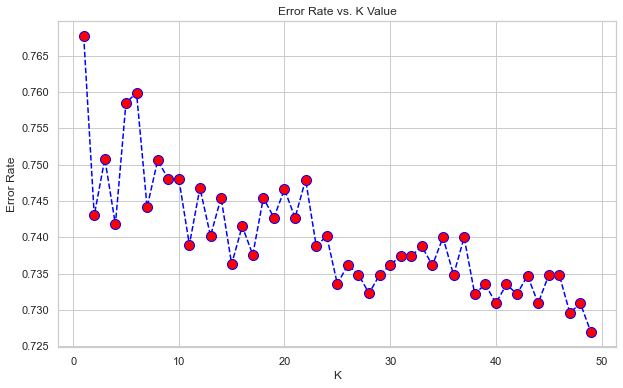

In [175]:
#Euclidean 2D/3D/4D/5D/nD distance between 2 points
# n=number of numeric features=number of dimentions
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier

# Will take some time
accuracy_rate = []
for i in range(1,50):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    score=cross_val_score(knn,Features,Label,cv=20)
    accuracy_rate.append(score.mean())
    
# Will take some time
error_rate = []
for i in range(1,50):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    score=cross_val_score(knn,Features,Label,cv=20)
    error_rate.append(1-score.mean())
    
# Will take some time
for i in range(1,50):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,Y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(mean(pred_i != Y_test))
    
figure(figsize=(10,6))
#plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
  #       markerfacecolor='red', markersize=10)
plot(range(1,50),accuracy_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
title('Error Rate vs. K Value')
xlabel('K')
ylabel('Error Rate')

In [176]:
# For loop to check ideal sample that will give generalized model
#Test1
from sklearn.neighbors import KNeighborsClassifier

for i in range(1,1000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    LiverKNN=KNeighborsClassifier(n_neighbors=49)
    
    LiverKNN.fit(X_train,Y_train)
    
    train_score=LiverKNN.score(X_train,Y_train)
    
    test_score=LiverKNN.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.7272727272727273 Train: 0.7254901960784313 RandomState: 1
Test: 0.7597402597402597 Train: 0.7271241830065359 RandomState: 2
Test: 0.7272727272727273 Train: 0.7238562091503268 RandomState: 5
Test: 0.7272727272727273 Train: 0.7254901960784313 RandomState: 7
Test: 0.7597402597402597 Train: 0.7271241830065359 RandomState: 8
Test: 0.7272727272727273 Train: 0.7254901960784313 RandomState: 10
Test: 0.7337662337662337 Train: 0.7254901960784313 RandomState: 11
Test: 0.7467532467532467 Train: 0.7173202614379085 RandomState: 17
Test: 0.7597402597402597 Train: 0.7124183006535948 RandomState: 18
Test: 0.7467532467532467 Train: 0.7238562091503268 RandomState: 24
Test: 0.7337662337662337 Train: 0.7254901960784313 RandomState: 31
Test: 0.7597402597402597 Train: 0.7271241830065359 RandomState: 32
Test: 0.7467532467532467 Train: 0.7336601307189542 RandomState: 34
Test: 0.7467532467532467 Train: 0.7173202614379085 RandomState: 35
Test: 0.7467532467532467 Train: 0.7254901960784313 RandomState: 36


Test: 0.7402597402597403 Train: 0.7271241830065359 RandomState: 310
Test: 0.7662337662337663 Train: 0.7287581699346405 RandomState: 311
Test: 0.7467532467532467 Train: 0.7107843137254902 RandomState: 312
Test: 0.7597402597402597 Train: 0.7271241830065359 RandomState: 318
Test: 0.7662337662337663 Train: 0.7336601307189542 RandomState: 321
Test: 0.7597402597402597 Train: 0.7254901960784313 RandomState: 322
Test: 0.7467532467532467 Train: 0.7271241830065359 RandomState: 323
Test: 0.7337662337662337 Train: 0.7189542483660131 RandomState: 324
Test: 0.7467532467532467 Train: 0.7222222222222222 RandomState: 325
Test: 0.7337662337662337 Train: 0.7189542483660131 RandomState: 327
Test: 0.7727272727272727 Train: 0.7254901960784313 RandomState: 335
Test: 0.7727272727272727 Train: 0.7303921568627451 RandomState: 336
Test: 0.7272727272727273 Train: 0.7254901960784313 RandomState: 337
Test: 0.7727272727272727 Train: 0.7320261437908496 RandomState: 339
Test: 0.7272727272727273 Train: 0.72385620915032

Test: 0.7662337662337663 Train: 0.7222222222222222 RandomState: 593
Test: 0.7467532467532467 Train: 0.7222222222222222 RandomState: 594
Test: 0.7597402597402597 Train: 0.7238562091503268 RandomState: 595
Test: 0.7662337662337663 Train: 0.7189542483660131 RandomState: 597
Test: 0.7532467532467533 Train: 0.7156862745098039 RandomState: 602
Test: 0.7792207792207793 Train: 0.7238562091503268 RandomState: 603
Test: 0.7792207792207793 Train: 0.7336601307189542 RandomState: 604
Test: 0.7207792207792207 Train: 0.7173202614379085 RandomState: 605
Test: 0.7272727272727273 Train: 0.7222222222222222 RandomState: 606
Test: 0.7467532467532467 Train: 0.7271241830065359 RandomState: 607
Test: 0.7402597402597403 Train: 0.7271241830065359 RandomState: 608
Test: 0.7272727272727273 Train: 0.7173202614379085 RandomState: 609
Test: 0.7857142857142857 Train: 0.7091503267973857 RandomState: 611
Test: 0.7467532467532467 Train: 0.7320261437908496 RandomState: 613
Test: 0.7662337662337663 Train: 0.71895424836601

Test: 0.8051948051948052 Train: 0.7156862745098039 RandomState: 876
Test: 0.7402597402597403 Train: 0.7222222222222222 RandomState: 890
Test: 0.7467532467532467 Train: 0.7222222222222222 RandomState: 891
Test: 0.7402597402597403 Train: 0.7205882352941176 RandomState: 895
Test: 0.7337662337662337 Train: 0.7287581699346405 RandomState: 898
Test: 0.7532467532467533 Train: 0.7156862745098039 RandomState: 900
Test: 0.7272727272727273 Train: 0.7189542483660131 RandomState: 901
Test: 0.7727272727272727 Train: 0.7238562091503268 RandomState: 902
Test: 0.7467532467532467 Train: 0.7352941176470589 RandomState: 903
Test: 0.7402597402597403 Train: 0.7254901960784313 RandomState: 904
Test: 0.7272727272727273 Train: 0.7271241830065359 RandomState: 906
Test: 0.7597402597402597 Train: 0.7271241830065359 RandomState: 913
Test: 0.7337662337662337 Train: 0.7287581699346405 RandomState: 915
Test: 0.7402597402597403 Train: 0.7222222222222222 RandomState: 916
Test: 0.7402597402597403 Train: 0.72712418300653

In [177]:
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=618)
LiverKNN=KNeighborsClassifier(n_neighbors=49)
LiverKNN.fit(X_train,Y_train)

KNeighborsClassifier(n_neighbors=49)

In [178]:
LiverKNN.score(X_train,Y_train)

0.7140522875816994

In [179]:
LiverKNN.score(X_test,Y_test)

0.8311688311688312

In [180]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,LiverKNN.predict(X_test)),\
            columns=["Predicted GOOD Liver", "Predicted BAD Liver"],\
            index=["GOOD Liver","BAD Liver"] )

,Predicted GOOD Liver,Predicted BAD Liver
GOOD Liver,46,24
BAD Liver,2,82


In [181]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,LiverKNN.predict(X_test)))

              precision    recall  f1-score   support

           0       0.96      0.66      0.78        70
           1       0.77      0.98      0.86        84

    accuracy                           0.83       154
   macro avg       0.87      0.82      0.82       154
weighted avg       0.86      0.83      0.83       154



## KNN Tuning

In [182]:
## Importing the model.
## Always give test_size=.20
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedShuffleSplit
## calling on the model oject. 
LiverKNN = KNeighborsClassifier(n_neighbors=49)
## knn classifier works by doing euclidian distance 


## doing 10 fold staratified-shuffle-split cross validation 
cv = StratifiedShuffleSplit(n_splits=5, test_size=.20, random_state=618)

accuracies = cross_val_score(LiverKNN, Features, Label, cv = cv, scoring='accuracy')
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),3)))

Cross-Validation accuracy scores:[0.69 0.72 0.81 0.69 0.75]
Mean Cross-Validation accuracy score: 0.732


In [183]:
from sklearn.model_selection import GridSearchCV
## Always give test_size=.20
## trying out multiple values for k
k_range = range(1,50)
## 
weights_options=['uniform','distance']
# 
param = {'n_neighbors':k_range, 'weights':weights_options}
## Using startifiedShufflesplit. 
cv = StratifiedShuffleSplit(n_splits=5, test_size=.20, random_state=618)
# estimator = knn, param_grid = param, n_jobs = -1 to instruct scikit learn to use all available processors. 
LiverKNN = GridSearchCV(KNeighborsClassifier(), param, cv=cv, verbose = False, n_jobs=-1)
## Fitting the model. 
LiverKNN.fit(X_train,Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=618, test_size=0.2,
            train_size=None),
             estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'n_neighbors': range(1, 50),
                         'weights': ['uniform', 'distance']},
             verbose=False)

In [184]:
print(LiverKNN.best_score_)
print(LiverKNN.best_params_)
print(LiverKNN.best_estimator_)

0.7479674796747967
{'n_neighbors': 5, 'weights': 'distance'}
KNeighborsClassifier(weights='distance')


In [185]:
### Using the best parameters from the grid-search.
LiverKNN= LiverKNN.best_estimator_
LiverKNN.score(X_test,Y_test)

0.8441558441558441

In [186]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,LiverKNN.predict(X_test)),\
            columns=["Predicted GOOD Liver", "Predicted BAD Liver"],\
            index=["GOOD Liver","BAD Liver"] )

,Predicted GOOD Liver,Predicted BAD Liver
GOOD Liver,55,15
BAD Liver,9,75


In [187]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,LiverKNN.predict(X_test)))

              precision    recall  f1-score   support

           0       0.86      0.79      0.82        70
           1       0.83      0.89      0.86        84

    accuracy                           0.84       154
   macro avg       0.85      0.84      0.84       154
weighted avg       0.85      0.84      0.84       154



# Decision Tree

In [244]:
# For loop to check ideal sample that will give generalized model
#Test1
# For loop to check ideal sample that will give generalized model
#Test1
from sklearn.tree import DecisionTreeClassifier

#Train Test Split, 80% Training Data & 20% Testing Data
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.2,random_state=3)
LiverTree=DecisionTreeClassifier()
LiverTree.fit(X_train,Y_train)

DecisionTreeClassifier()

In [245]:
LiverTree.score(X_train,Y_train)

1.0

In [246]:
LiverTree.score(X_test,Y_test)

0.7532467532467533

In [247]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,LiverTree.predict(X_test)),\
            columns=["Predicted GOOD Liver", "Predicted BAD Liver"],\
            index=["GOOD Liver","BAD Liver"] )

,Predicted GOOD Liver,Predicted BAD Liver
GOOD Liver,59,21
BAD Liver,17,57


In [248]:
print(classification_report(Y_test,LiverTree.predict(X_test)))

              precision    recall  f1-score   support

           0       0.78      0.74      0.76        80
           1       0.73      0.77      0.75        74

    accuracy                           0.75       154
   macro avg       0.75      0.75      0.75       154
weighted avg       0.75      0.75      0.75       154



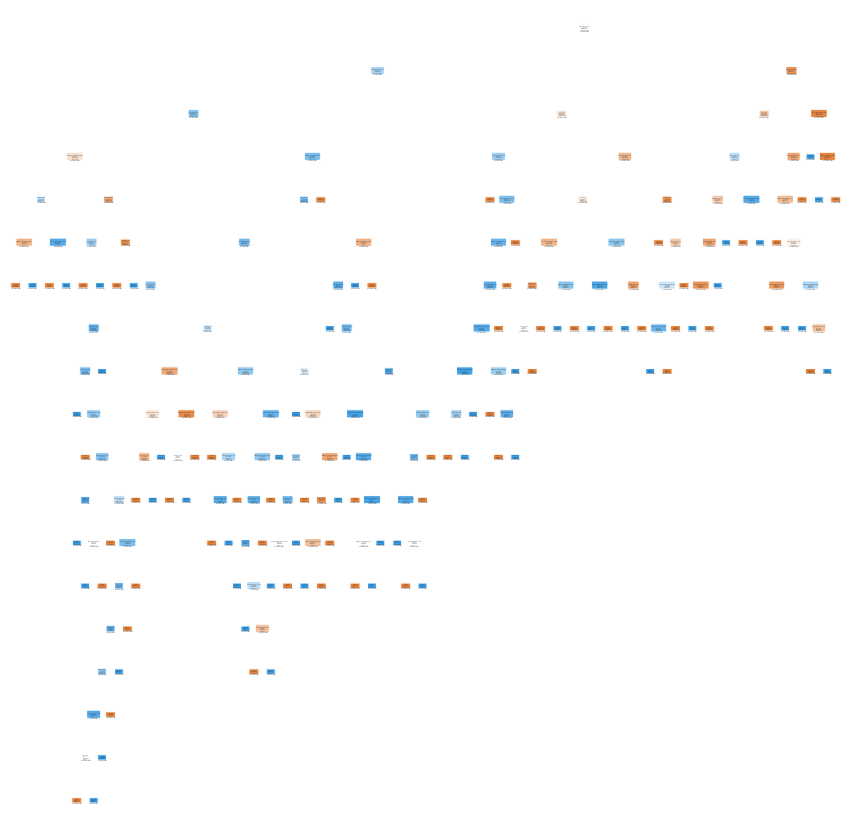

In [249]:
# Visualizing and Plotting the TitanicTree Decision Tree
from sklearn import tree
from sklearn.tree import plot_tree
figure(figsize=(15,15))
tree.plot_tree(LiverTree,
          filled=True,
          rounded=True,
          class_names=["GOOD-LIVER", "BAD-LIVER"],
          feature_names=Features.columns);

In [250]:
path = LiverTree.cost_complexity_pruning_path(X_train,Y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [251]:
ccp_alphas

array([0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01,
       0.01, 0.01, 0.01, 0.01, 0.03, 0.1 ])

In [252]:
LiverTrees = []
for ccp_alpha in ccp_alphas:
    LiverTree = DecisionTreeClassifier(random_state=3, ccp_alpha=ccp_alpha)
    LiverTree.fit(X_train,Y_train)
    LiverTrees.append(LiverTree)
print("Number of Nodes in the Last Tree is: {} with ccp_alpha: {}".format(
LiverTrees[-1].tree_.node_count, ccp_alphas[-1]))

Number of Nodes in the Last Tree is: 1 with ccp_alpha: 0.10248146688458115


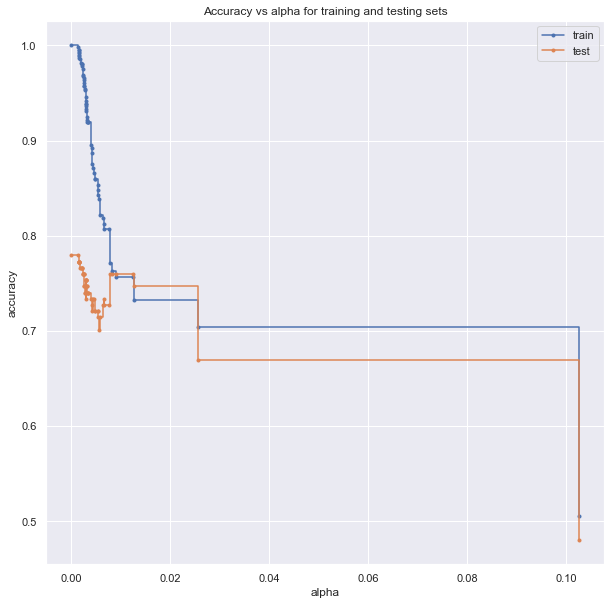

In [253]:
train_score = [LiverTree.score(X_train, Y_train) for LiverTree in LiverTrees]
test_score = [LiverTree.score(X_test, Y_test) for LiverTree in LiverTrees]

fig, ax = subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_score, marker='.', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alphas, test_score, marker='.', label="test",
        drawstyle="steps-post")
ax.legend()
show()

In [254]:
LiverTree = DecisionTreeClassifier(random_state=3, ccp_alpha=0.01)
LiverTree.fit(X_train,Y_train)

DecisionTreeClassifier(ccp_alpha=0.01, random_state=3)

In [255]:
LiverTree.score(X_train,Y_train)

0.7565359477124183

In [256]:
LiverTree.score(X_test,Y_test)

0.7597402597402597

In [257]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,LiverTree.predict(X_test)),\
            columns=["Predicted GOOD Liver", "Predicted BAD Liver"],\
            index=["GOOD Liver","BAD Liver"] )

,Predicted GOOD Liver,Predicted BAD Liver
GOOD Liver,54,26
BAD Liver,11,63


In [258]:
print(classification_report(Y_test,LiverTree.predict(X_test)))

              precision    recall  f1-score   support

           0       0.83      0.68      0.74        80
           1       0.71      0.85      0.77        74

    accuracy                           0.76       154
   macro avg       0.77      0.76      0.76       154
weighted avg       0.77      0.76      0.76       154



# Random Forest

In [259]:
# For loop to check ideal sample that will give generalized model
#Test1
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier

for i in range(1,1000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    LiverTree = DecisionTreeClassifier(ccp_alpha=0.01,criterion='gini')
    LiverForest = BaggingClassifier(LiverTree, n_estimators=300, max_samples=0.80, random_state=i)
    
    LiverForest.fit(X_train,Y_train)
    
    train_score=LiverForest.score(X_train,Y_train)
    
    test_score=LiverForest.score(X_test,Y_test)
    
    if test_score >= train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.8506493506493507 Train: 0.8120915032679739 RandomState: 2
Test: 0.8311688311688312 Train: 0.8251633986928104 RandomState: 36
Test: 0.8441558441558441 Train: 0.8235294117647058 RandomState: 97
Test: 0.8311688311688312 Train: 0.8088235294117647 RandomState: 134
Test: 0.8571428571428571 Train: 0.8300653594771242 RandomState: 145
Test: 0.8181818181818182 Train: 0.8120915032679739 RandomState: 191
Test: 0.8311688311688312 Train: 0.8300653594771242 RandomState: 241
Test: 0.8246753246753247 Train: 0.8169934640522876 RandomState: 327
Test: 0.8376623376623377 Train: 0.826797385620915 RandomState: 336
Test: 0.8571428571428571 Train: 0.8186274509803921 RandomState: 403
Test: 0.8506493506493507 Train: 0.8300653594771242 RandomState: 506
Test: 0.8506493506493507 Train: 0.8366013071895425 RandomState: 521
Test: 0.8376623376623377 Train: 0.8251633986928104 RandomState: 533
Test: 0.8181818181818182 Train: 0.815359477124183 RandomState: 634
Test: 0.8376623376623377 Train: 0.8316993464052288 Ran

In [260]:
X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=968)
LiverForest.fit(X_train,Y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(ccp_alpha=0.01),
                  max_samples=0.8, n_estimators=300, random_state=999)

In [261]:
LiverForest.score(X_train,Y_train)

0.8202614379084967

In [262]:
LiverForest.score(X_test,Y_test)

0.8636363636363636

In [263]:
# printing confision matrix
DataFrame(confusion_matrix(Y_test,LiverForest.predict(X_test)),\
            columns=["Predicted GOOD Liver", "Predicted BAD Liver"],\
            index=["GOOD Liver","BAD Liver"] )

,Predicted GOOD Liver,Predicted BAD Liver
GOOD Liver,62,17
BAD Liver,4,71


In [264]:
print(classification_report(Y_test,LiverForest.predict(X_test)))

              precision    recall  f1-score   support

           0       0.94      0.78      0.86        79
           1       0.81      0.95      0.87        75

    accuracy                           0.86       154
   macro avg       0.87      0.87      0.86       154
weighted avg       0.87      0.86      0.86       154



In [265]:
# Visualizing Random State of Each Tree
LiverForest.estimators_, len(LiverForest.estimators_)

([DecisionTreeClassifier(ccp_alpha=0.01, random_state=1276550613),
  DecisionTreeClassifier(ccp_alpha=0.01, random_state=1857334363),
  DecisionTreeClassifier(ccp_alpha=0.01, random_state=1032796505),
  DecisionTreeClassifier(ccp_alpha=0.01, random_state=1265280238),
  DecisionTreeClassifier(ccp_alpha=0.01, random_state=944334302),
  DecisionTreeClassifier(ccp_alpha=0.01, random_state=170919106),
  DecisionTreeClassifier(ccp_alpha=0.01, random_state=584413037),
  DecisionTreeClassifier(ccp_alpha=0.01, random_state=250819915),
  DecisionTreeClassifier(ccp_alpha=0.01, random_state=1807330965),
  DecisionTreeClassifier(ccp_alpha=0.01, random_state=1570187667),
  DecisionTreeClassifier(ccp_alpha=0.01, random_state=1003869459),
  DecisionTreeClassifier(ccp_alpha=0.01, random_state=150271574),
  DecisionTreeClassifier(ccp_alpha=0.01, random_state=1716716642),
  DecisionTreeClassifier(ccp_alpha=0.01, random_state=1498919371),
  DecisionTreeClassifier(ccp_alpha=0.01, random_state=1323690237),


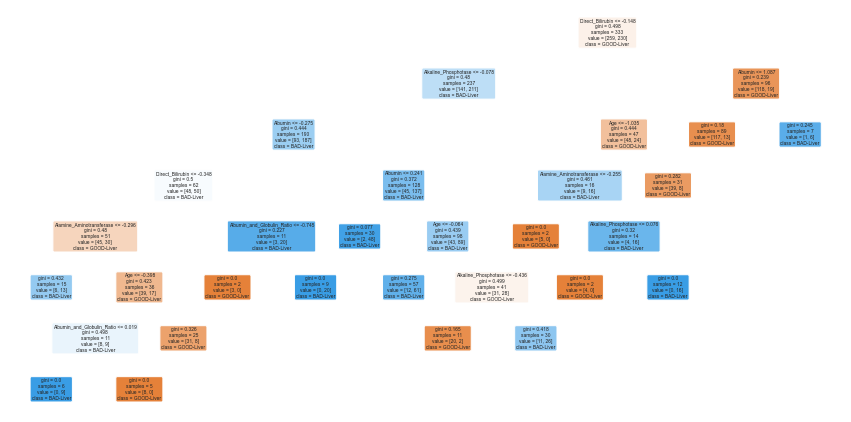

In [266]:
# Visualizing the 4th Tree of the Random Forest
figure(figsize=(15,7.5))
tree.plot_tree(LiverForest.estimators_[99],
          filled=True,
          rounded=True,
          class_names=["GOOD-Liver", "BAD-Liver"],
          feature_names=Features.columns);

In [267]:
# Visualizing Random Forest Diagram
for i in range(len(LiverForest.estimators_)):
      print(tree.export_text(LiverForest.estimators_[i]))

|--- feature_3 <= -0.26
|   |--- feature_5 <= -0.01
|   |   |--- feature_0 <= -0.25
|   |   |   |--- class: 1
|   |   |--- feature_0 >  -0.25
|   |   |   |--- feature_1 <= -0.38
|   |   |   |   |--- class: 0
|   |   |   |--- feature_1 >  -0.38
|   |   |   |   |--- class: 1
|   |--- feature_5 >  -0.01
|   |   |--- class: 0
|--- feature_3 >  -0.26
|   |--- feature_0 <= -2.10
|   |   |--- class: 1
|   |--- feature_0 >  -2.10
|   |   |--- feature_5 <= -0.06
|   |   |   |--- feature_0 <= -0.00
|   |   |   |   |--- feature_2 <= -0.38
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_2 >  -0.38
|   |   |   |   |   |--- feature_6 <= -0.40
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_6 >  -0.40
|   |   |   |   |   |   |--- class: 1
|   |   |   |--- feature_0 >  -0.00
|   |   |   |   |--- class: 0
|   |   |--- feature_5 >  -0.06
|   |   |   |--- class: 0

|--- feature_2 <= -0.04
|   |--- feature_7 <= -0.57
|   |   |--- feature_1 <= -0.34
|   |   |   |--- cl


|--- feature_2 <= -0.12
|   |--- feature_3 <= -0.22
|   |   |--- feature_5 <= -0.25
|   |   |   |--- class: 1
|   |   |--- feature_5 >  -0.25
|   |   |   |--- feature_1 <= -0.38
|   |   |   |   |--- class: 0
|   |   |   |--- feature_1 >  -0.38
|   |   |   |   |--- feature_8 <= 0.50
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_8 >  0.50
|   |   |   |   |   |--- feature_3 <= -0.42
|   |   |   |   |   |   |--- feature_5 <= -0.23
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- feature_5 >  -0.23
|   |   |   |   |   |   |   |--- feature_1 <= -0.28
|   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- feature_1 >  -0.28
|   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_3 >  -0.42
|   |   |   |   |   |   |--- feature_3 <= -0.32
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- feature_3 >  -0.32
|   |   |   |   |   |   |   |--- class: 0
|   |--- feature_3 >  -0.22
|   |   |--- 

# ADA-Boost Forest/Stumps Forest Classifier

In [272]:
# For loop to check ideal sample that will give generalized model
#Test1
from sklearn.ensemble import AdaBoostClassifier
# Learning rate shrinks the contribution of each classifier by learning_rate.
# There is a trade-off between learning_rate and n_estimators.
for i in range(1,1000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    LiverAdaB=AdaBoostClassifier(n_estimators=50, learning_rate=1)
    
    LiverAdaB.fit(X_train,Y_train)
    
    train_score=LiverAdaB.score(X_train,Y_train)
    
    test_score=LiverAdaB.score(X_test,Y_test)
    
    if test_score >= train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.8311688311688312 Train: 0.8251633986928104 RandomState: 26
Test: 0.8246753246753247 Train: 0.8218954248366013 RandomState: 101
Test: 0.8376623376623377 Train: 0.8088235294117647 RandomState: 173
Test: 0.8246753246753247 Train: 0.8218954248366013 RandomState: 363
Test: 0.8376623376623377 Train: 0.8349673202614379 RandomState: 373
Test: 0.8376623376623377 Train: 0.8218954248366013 RandomState: 376
Test: 0.8181818181818182 Train: 0.8120915032679739 RandomState: 395
Test: 0.8376623376623377 Train: 0.8316993464052288 RandomState: 459
Test: 0.8441558441558441 Train: 0.8169934640522876 RandomState: 504
Test: 0.8181818181818182 Train: 0.8169934640522876 RandomState: 533
Test: 0.8376623376623377 Train: 0.8300653594771242 RandomState: 618
Test: 0.8246753246753247 Train: 0.8137254901960784 RandomState: 666
Test: 0.8181818181818182 Train: 0.8137254901960784 RandomState: 815
Test: 0.8376623376623377 Train: 0.8366013071895425 RandomState: 968
Test: 0.8506493506493507 Train: 0.830065359477124

In [273]:
X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=991)
LiverAdaB.fit(X_train,Y_train)

AdaBoostClassifier(learning_rate=1)

In [274]:
LiverAdaB.score(X_train,Y_train)

0.8300653594771242

In [275]:
LiverAdaB.score(X_test,Y_test)

0.8506493506493507

In [277]:
# printing confision matrix
DataFrame(confusion_matrix(Y_test,LiverAdaB.predict(X_test)),\
            columns=["Predicted GOOD Liver", "Predicted BAD Liver"],\
            index=["GOOD Liver","BAD Liver"] )

,Predicted GOOD Liver,Predicted BAD Liver
GOOD Liver,67,13
BAD Liver,10,64


In [278]:
print(classification_report(Y_test,LiverAdaB.predict(X_test)))

              precision    recall  f1-score   support

           0       0.87      0.84      0.85        80
           1       0.83      0.86      0.85        74

    accuracy                           0.85       154
   macro avg       0.85      0.85      0.85       154
weighted avg       0.85      0.85      0.85       154



In [309]:
## setting param for param_grid in GridSearchCV.
n_estimators = [50, 100, 150, 200, 250, 300, 350, 400]
LearningRate=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
Algorithm = ["SAMME","SAMME.R"]
Param = {"n_estimators":n_estimators,"learning_rate":LearningRate,"algorithm":Algorithm}
cv = StratifiedShuffleSplit(n_splits = 5, test_size=0.20, random_state=533)


## Calling on GridSearchCV object. 
LiverAdaB = GridSearchCV(estimator=AdaBoostClassifier(), 
                           param_grid = Param,
                           scoring = 'accuracy',
                            n_jobs =-1,
                           cv = cv)
## Fitting the model
LiverAdaB.fit(X_train, Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=533, test_size=0.2,
            train_size=None),
             estimator=AdaBoostClassifier(), n_jobs=-1,
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7,
                                           0.8, 0.9, 1.0],
                         'n_estimators': [50, 100, 150, 200, 250, 300, 350,
                                          400]},
             scoring='accuracy')

In [310]:
print(LiverAdaB.best_score_)
print(LiverAdaB.best_params_)
print(LiverAdaB.best_estimator_)

0.7479674796747967
{'algorithm': 'SAMME.R', 'learning_rate': 0.9, 'n_estimators': 150}
AdaBoostClassifier(learning_rate=0.9, n_estimators=150)


In [311]:
## setting param for param_grid in GridSearchCV.
n_estimators = [50, 100, 150, 200, 250, 300, 350, 400]
LearningRate=[0.80,0.81,0.82,0.83,0.84,0.85,0.86,0.87,0.88,0.89,0.90,0.91,0.92,0.93,0.94,0.95,0.96,0.97,0.98,0.99,1.0]
Param = {"n_estimators":n_estimators,"learning_rate":LearningRate}
cv = StratifiedShuffleSplit(n_splits = 5, test_size=0.20, random_state=533)


## Calling on GridSearchCV object. 
LiverAdaB = GridSearchCV(estimator=AdaBoostClassifier(), 
                           param_grid = Param,
                           scoring = 'accuracy',
                            n_jobs =-1,
                           cv = cv)
## Fitting the model
LiverAdaB.fit(X_train, Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=533, test_size=0.2,
            train_size=None),
             estimator=AdaBoostClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.8, 0.81, 0.82, 0.83, 0.84, 0.85,
                                           0.86, 0.87, 0.88, 0.89, 0.9, 0.91,
                                           0.92, 0.93, 0.94, 0.95, 0.96, 0.97,
                                           0.98, 0.99, 1.0],
                         'n_estimators': [50, 100, 150, 200, 250, 300, 350,
                                          400]},
             scoring='accuracy')

In [312]:
print(LiverAdaB.best_score_)
print(LiverAdaB.best_params_)
print(LiverAdaB.best_estimator_)

0.7479674796747967
{'learning_rate': 0.9, 'n_estimators': 150}
AdaBoostClassifier(learning_rate=0.9, n_estimators=150)


In [316]:
# For loop to check ideal sample that will give generalized model
#Test1
from sklearn.ensemble import AdaBoostClassifier
# Learning rate shrinks the contribution of each classifier by learning_rate.
# There is a trade-off between learning_rate and n_estimators.
for i in range(1,1000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    LiverAdaB=AdaBoostClassifier(n_estimators=100, learning_rate=0.9)
    
    LiverAdaB.fit(X_train,Y_train)
    
    train_score=LiverAdaB.score(X_train,Y_train)
    
    test_score=LiverAdaB.score(X_test,Y_test)
    
    if test_score >= train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.8636363636363636 Train: 0.8578431372549019 RandomState: 968


In [317]:
X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=968)
LiverAdaB=AdaBoostClassifier(n_estimators=100, learning_rate=0.9)
LiverAdaB.fit(X_train,Y_train)

AdaBoostClassifier(learning_rate=0.9, n_estimators=100)

In [318]:
LiverAdaB.score(X_train,Y_train)

0.8578431372549019

In [319]:
LiverAdaB.score(X_test,Y_test)

0.8636363636363636

In [320]:
# printing confision matrix
DataFrame(confusion_matrix(Y_test,LiverAdaB.predict(X_test)),\
            columns=["Predicted GOOD Liver", "Predicted BAD Liver"],\
            index=["GOOD Liver","BAD Liver"] )

,Predicted GOOD Liver,Predicted BAD Liver
GOOD Liver,64,15
BAD Liver,6,69


In [321]:
print(classification_report(Y_test,LiverAdaB.predict(X_test)))

              precision    recall  f1-score   support

           0       0.91      0.81      0.86        79
           1       0.82      0.92      0.87        75

    accuracy                           0.86       154
   macro avg       0.87      0.87      0.86       154
weighted avg       0.87      0.86      0.86       154



# GradientBoostingClassifier Hyperparameter Tuning

In [330]:
# Tuning
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=999)
## setting param for param_grid in GridSearchCV.
Max_Depth = [3,4,5,6,7,8,9,10,11,12,13,14,15]
Trees = [100,150,200,250,300,350,400]
LearningRate = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
param = {'n_estimators': Trees, 'max_depth': Max_Depth, 'learning_rate':LearningRate}
LiverGBC = GridSearchCV(estimator=GradientBoostingClassifier(), param_grid = param, scoring = 'accuracy', n_jobs =-1, cv=cv)
## Fitting the model
LiverGBC.fit(X_train,Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=999, test_size=0.2,
            train_size=None),
             estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7,
                                           0.8, 0.9, 1.0],
                         'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14,
                                       15],
                         'n_estimators': [100, 150, 200, 250, 300, 350, 400]},
             scoring='accuracy')

In [331]:
print(LiverGBC.best_score_)
print(LiverGBC.best_params_)
print(LiverGBC.best_estimator_)

0.8243902439024391
{'learning_rate': 0.4, 'max_depth': 6, 'n_estimators': 100}
GradientBoostingClassifier(learning_rate=0.4, max_depth=6)


In [332]:
# Tuning
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=999)
## setting param for param_grid in GridSearchCV.
LearningRate = [0.30,0.31,0.32,0.33,0.34,0.35,0.36,0.37,0.38,0.39,0.40,0.41,0.42,0.43,0.44,0.45,0.46,0.47,0.49,0.50]
param = {'n_estimators': Trees, 'max_depth': Max_Depth, 'learning_rate':LearningRate}
LiverGBC = GridSearchCV(estimator=GradientBoostingClassifier(max_depth=6,n_estimators=100), param_grid = param, scoring = 'accuracy', n_jobs =-1, cv=cv)
## Fitting the model
LiverGBC.fit(X_train,Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=999, test_size=0.2,
            train_size=None),
             estimator=GradientBoostingClassifier(max_depth=6), n_jobs=-1,
             param_grid={'learning_rate': [0.3, 0.31, 0.32, 0.33, 0.34, 0.35,
                                           0.36, 0.37, 0.38, 0.39, 0.4, 0.41,
                                           0.42, 0.43, 0.44, 0.45, 0.46, 0.47,
                                           0.49, 0.5],
                         'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14,
                                       15],
                         'n_estimators': [100, 150, 200, 250, 300, 350, 400]},
             scoring='accuracy')

In [333]:
print(LiverGBC.best_score_)
print(LiverGBC.best_params_)
print(LiverGBC.best_estimator_)

0.8227642276422765
{'learning_rate': 0.47, 'max_depth': 7, 'n_estimators': 150}
GradientBoostingClassifier(learning_rate=0.47, max_depth=7, n_estimators=150)


In [337]:
# For loop to check ideal sample that will give generalized model
#Test1
from sklearn.ensemble import GradientBoostingClassifier
# Learning rate shrinks the contribution of each classifier by learning_rate.
# There is a trade-off between learning_rate and n_estimators.
for i in range(1,1000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    LiverGradB1=GradientBoostingClassifier(n_estimators=150, learning_rate=0.47, max_depth=7, ccp_alpha=0.0)
    
    LiverGradB1.fit(X_train,Y_train)
    
    train_score=LiverGradB1.score(X_train,Y_train)
    
    test_score=LiverGradB1.score(X_test,Y_test)
    
    if test_score >= train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

In [459]:
X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=999)
LiverGradB1=GradientBoostingClassifier(n_estimators=150, learning_rate=0.47, max_depth=7,ccp_alpha=)
LiverGradB1.fit(X_train,Y_train)

GradientBoostingClassifier(ccp_alpha=0.999, learning_rate=0.47, max_depth=7,
                           n_estimators=150)

In [460]:
LiverGradB1.score(X_train,Y_train)

0.5065359477124183

In [461]:
LiverGradB1.score(X_test,Y_test)

0.474025974025974

In [344]:
path = LiverGradB1.cost_complexity_pruning_path(X_train,Y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

AttributeError: 'GradientBoostingClassifier' object has no attribute 'cost_complexity_pruning_path'